### <p style="background-color:#627D50;color:#D1CABD;font-size:110%;text-align:center;border-radius:20px 60px;  border: 10px solid #cfcfcf;  padding-top: 10px;  padding-left: 10px;  padding-right: 10px; padding-bottom: 10px;  border-radius: 80px 20px;line-height: 1.2em; margin-bottom: 10px;"> **Projet 5** : Segmentez des clients d'un site e-commerce </p>

<img src="Olist.png" align="left" alt="Alternative text" />

Vous êtes consultant pour ***Olist***, une entreprise brésilienne qui propose une solution de vente sur les marketplaces en ligne.

***Olist*** souhaite que vous fournissiez à ses équipes d'e-commerce une segmentation des clients qu'elles pourront utiliser au quotidien pour leurs campagnes de communication.

Votre ***objectif*** est de comprendre les différents types d'utilisateurs grâce à leur comportement et à leurs données personnelles.

---
- Mentor [**Babou M'BAYE**]()
- Etudiant [**Bourama FANE**](https://www.linkedin.com/in/bourama-fan%C3%A9-7aba41141/)
- Parcours [*Data Scientiste*]()
- Ecole [*OpenClassrooms*]()

---

## <a id='-1'> <font color='#114b98' font-size='110%' text-align='left'> Sommaire </font> </a>
----------

[<font color="#337da4"> <h5> Librairies & Fonctions](#0)</h5>
[<font color="#337da4"> <h5> 1. Modèle RFM classique](#1)</h5>
> [1.1. Chargement de la base](#1.1)<br>
> [1.2. Calcul des scores RFM ](#1.2)<br>
> [1.3. Définition et visualisation des segments](#1.3)<br>
> [1.4. Description des segments](#1.4)<br>

[<font color="#337da4"> <h5> 2. Clustering K-means (RFM variables)](#2)</h5>
> [2.1. Clustering avant réduction](#2.1)<br>
> [2.2. Réduction dimensionnelle-PCA](#2.2)<br>
> [2.3. Clustering après réduction](#2.3)<br>

[<font color="#337da4"> <h5> 3. Segmentation des clients Olist (RFM étendue)](#3)</h5>

> [3.1. Selection de variables pertinentes](#3.1)<br>
> [3.2. Clustering](#3.2)<br>
> > [3.2.1. Preprocessing](#3.2.1)<br>
> > [3.2.2. Projection des données](#3.2.2)<br>
> > [3.2.3. Nombre optimal de clusters](#3.2.3)<br>
> > [3.2.4. Projection des clusters](#3.2.4)<br>
> > [3.2.5. Evaluation du clustering](#3.2.5)<br>
    
> [3.3. DBSCAN](#3.3)<br>
> [3.4. Hierarchical Clustering (Agglomerative)](#3.4)<br>
> [3.5. Comparaison des modèles ](#3.5)<br>
> [3.6. Clustering retenu](#3.6)<br> 

[<font color="#337da4"> <h5> 4. Stabilité à l'initialisation du K-Means](#4)</h5>


### <font color="#337da4" id="0"> Librairies </font>
----------------------------

In [1]:
# !pip install pywaffle
import os
from datetime import date, time, datetime, timedelta
from dateutil.relativedelta import relativedelta
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import plotly.express as px
import missingno as msno

# from pivottablejs import pivot_ui
# from IPython.display import HTML
# from pandas_profiling import ProfileReport
from IPython.display import display, Markdown
# from matplotlib.lines import Line2D

from plotly.offline import download_plotlyjs, init_notebook_mode, iplot
import matplotlib as mpl
import plotly.graph_objs as go
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.compose import ColumnTransformer, make_column_transformer
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.decomposition import PCA
from sklearn.metrics import homogeneity_score, adjusted_rand_score, adjusted_mutual_info_score
from sklearn.metrics import silhouette_score, davies_bouldin_score,calinski_harabasz_score

# Clustering Librairies import
from sklearn.cluster import KMeans
from sklearn.cluster import MeanShift, estimate_bandwidth
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer, InterclusterDistance
from kmodes.kprototypes import KPrototypes



# Appel de mes propres functions
from function import *


# plt.style.use('ggplot')
# Affichage des valeurs
pd.set_option('display.max_colwidth', None)
# !pip install dataframe_to_image
import dataframe_image as dfi
imgPath='D:/OpenClassrooms/Projet 5/Soutenance/'

# font_title = {'family': 'serif', 'color':  '#114b98', 'weight': 'bold', 'size': 16,}
# font_title2 = {'family': 'serif', 'color':  '#114b98', 'weight': 'bold', 'size': 12,}
# font_title3 = {'family': 'serif', 'color':  '#4F6272', 'weight': 'bold', 'size': 10,}

# mycolors = ["black", "hotpink", "b", "#4CAF50"]
# AllColors=['#99ff99','#66b3ff','#4F6272', '#B7C3F3','#ff9999','#ffcc99','#ff6666', '#DD7596', '#8EB897',
#            '#c2c2f0','#DDA0DD','#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', 
#            '#7f7f7f', '#bcbd22', '#17becf','#e41a1c','#377eb8','#4daf4a','#984ea3','#ff7f00','#ffff33',
#            '#a65628','#f781bf',"#E69F00", "#56B4E9", "#009E73", "#F0E442", "#0072B2", "#D55E00", "#CC79A7", "#000000"]

  
    
# --- Importing Libraries ---
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
# import pandas_profiling
import seaborn as sns
import warnings
import os
import yellowbrick
import scipy.cluster.hierarchy as shc
import matplotlib.patches as patches

from matplotlib.patches import Rectangle
#from pandas_profiling import ProfileReport
from pywaffle import Waffle
from math import isnan
from random import sample
from numpy.random import uniform
from sklearn.neighbors import NearestNeighbors
from sklearn.impute import KNNImputer
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
from sklearn.metrics import davies_bouldin_score, silhouette_score, calinski_harabasz_score
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer
from yellowbrick.style import set_palette
from yellowbrick.contrib.wrapper import wrap

# --- Libraries Settings ---
# white,dark,whitegrid,darkgrid,ticks
# Scale and Context: poster, paper,notebook,talk
# sns.set_context('notebook', font_scale = 1)
# sns.set_style('darkgrid')

# sns.set_style("darkgrid", {"axes.facecolor": "0.98"})

# sns.set_style("whitegrid")
# sns.color_palette("crest", as_cmap=True)
# sns.color_palette("viridis", as_cmap=True)
sns.color_palette("coolwarm", as_cmap=True)

import warnings
warnings.filterwarnings('ignore')

%matplotlib inline
sns.set_style("whitegrid", {'axes.grid' : True})
sns.set_context('notebook')
plt.rcParams["figure.figsize"] = [7.00, 3.50]
plt.rcParams["figure.autolayout"] = True
plt.rcParams['figure.facecolor']='w'
mpl.rcParams["figure.figsize"] = (12, 4)
plt.rcParams['figure.dpi'] = 96
# sns.set(rc = {'axes.facecolor': '#FBFBFB', 'figure.facecolor': '#FBFBFB'})

# # color palette can be passed as a list of hex codes
# custom_colors = ["#9b59b6", "#3498db", "#95a5a6", "#e74c3c", "#34495e", "#2ecc71"]
# # set overall plot style, font size scaling factor, and color palette
# sns.set(style="whitegrid", font_scale=1.2, palette=custom_colors )
        
        
init_notebook_mode()
# Reglage des affichages
dictPdSettings = {'display.max_rows': 500, 'display.width': 100,
                  'display.max_colwidth': 100,
                  'display.float_format': lambda x: '%.2f' % x}
for k,v in dictPdSettings.items():
    pd.set_option(k,v)    


class clr:
    start = '\033[93m'+'\033[1m'
    color = '\033[93m'
    end = '\033[0m'

### <font color="#337da4" id="1"> 1. Modèle RFM classique </font>
----------------------------

Segmenter ***consiste à créer des segments homogènes de clients*** que l'on peut ensuite activer dans des campagnes marketing ciblées. La segmentation permet de mieux cibler ses campagnes et scénarios marketing. Il y a théoriquement autant de méthodes de segmentation qu'il y a de critères et de combinaisons de critères possibles. Ici, nous nous interesserons à la méthode ***RFM***. 

La segmentation **RFM (Recency-Frequency-Monetary)** est une technique d'analyse de la segmentation de la clientèle utilisée en marketing pour segmenter les clients selon leur comportement d'achat. C'est donc une segmentation 100% comportementale.

Un modèle **RFM (Recency-Frequency-Monetary)** se réfère à trois variables clés:<br>
- ***Recency (R)***: la dernière fois qu'un client a effectué un achat.
- ***Frequency (F)***: la fréquence à laquelle un client effectue des achats.
- ***Monetary (M)***: le montant total que le client a dépensé sur une période donnée.

En combinant ces trois variables, les clients peuvent être classés en groupes, ce qui permet aux spécialistes du marketing de mieux comprendre leur comportement d'achat et de cibler leurs efforts de marketing de manière plus efficace.

#### <font color="#337da4" id="1.1"> 1.1. Chargement de la base </font>
----------------------------

Nous allons charger la base finale et proceder à la segmentation.

In [2]:
df_rfm=pd.read_csv('df_Olist_rfm.csv')
df_rfm.head()

,customer_unique_id,recency,frequency,monetary
0,0000366f3b9a7992bf8c76cfdf3221e2,115,1,141.90
1,0000b849f77a49e4a4ce2b2a4ca5be3f,118,1,27.19
2,0000f46a3911fa3c0805444483337064,541,1,86.22
3,0000f6ccb0745a6a4b88665a16c9f078,325,1,43.62
4,0004aac84e0df4da2b147fca70cf8255,292,1,196.89


#### <font color="#337da4" id="1.2"> 1.2. Calcul des scores RFM </font>
----------------------------

Pour ***implementer un modèle RFM***, l'approche la plus populaire et la plus simple est la méthode des ***quintiles*** qui prend aussi sens au regard de la ***règle de Pareto*** : "20% des clients sont responsables de 80% des bénéfices".

Nous allons calculer pour chacune des variables les quintiles, ensuite, les scores pour chaque client.


In [3]:
quintiles = df_rfm[['recency', 'frequency', 'monetary']].quantile([.2, .4, .6, .8]).to_dict()
quintiles

{'recency': {0.2: 97.0, 0.4: 181.0, 0.6: 272.0, 0.8: 388.0},
 'frequency': {0.2: 1.0, 0.4: 1.0, 0.6: 1.0, 0.8: 1.0},
 'monetary': {0.2: 53.61, 0.4: 85.73200000000004, 0.6: 131.04, 0.8: 206.99}}

-----
Ensuite, nous allons évaluer le scoring de chacune des variables en prenant en compte la valeur de chacun des quintiles.
Une exception cependant pour la récence, où on inverse.

Ci dessous, les fonctions qui évalueront les scores.

In [4]:
def r_score(x):
    if x <= quintiles['recency'][.2]:
        return 5
    elif x <= quintiles['recency'][.4]:
        return 4
    elif x <= quintiles['recency'][.6]:
        return 3
    elif x <= quintiles['recency'][.8]:
        return 2
    else:
        return 1

def fm_score(x, c):
    if x <= quintiles[c][.2]:
        return 1
    elif x <= quintiles[c][.4]:
        return 2
    elif x <= quintiles[c][.6]:
        return 3
    elif x <= quintiles[c][.8]:
        return 4
    else:
        return 5   

Pour obtenir le score RFM, il vous suffit d'additionner les scores de Récence, Fréquence et Montant.
A ce stade, vous avez un score RFM qui va de 3 à 15 pour chaque membre de votre clientèle

In [5]:
df_rfm['R'] = df_rfm['recency'].apply(lambda x: r_score(x))
df_rfm['F'] = df_rfm['frequency'].apply(lambda x: fm_score(x, 'frequency'))
df_rfm['M'] = df_rfm['monetary'].apply(lambda x: fm_score(x, 'monetary'))
df_rfm['RFM_Score'] = df_rfm['R'].map(str) + df_rfm['F'].map(str) + df_rfm['M'].map(str)
df_rfm.head()

,customer_unique_id,recency,frequency,monetary,R,F,M,RFM_Score
0,0000366f3b9a7992bf8c76cfdf3221e2,115,1,141.90,4,1,4,414
1,0000b849f77a49e4a4ce2b2a4ca5be3f,118,1,27.19,4,1,1,411
2,0000f46a3911fa3c0805444483337064,541,1,86.22,1,1,3,113
3,0000f6ccb0745a6a4b88665a16c9f078,325,1,43.62,2,1,1,211
4,0004aac84e0df4da2b147fca70cf8255,292,1,196.89,2,1,4,214


#### <font color="#337da4" id="1.3"> 1.3. Définition et visualisation des segments </font>
----------------------------

Ici, nous definissons les segments en fonctions des scores obtenus par les clients. 

In [6]:
segt_map = {
    r'[1-2][1-2]': 'hibernating',
    r'[1-2][3-4]': 'at risk',
    r'[1-2]5': 'can\'t loose',
    r'3[1-2]': 'about to sleep',
    r'33': 'need attention',
    r'[3-4][4-5]': 'loyal customers',
    r'41': 'promising',
    r'51': 'new customers',
    r'[4-5][2-3]': 'potential loyalists',
    r'5[4-5]': 'champions'
}

df_rfm['Segment'] = df_rfm['R'].map(str) + df_rfm['F'].map(str)
df_rfm['Segment'] = df_rfm['Segment'].replace(segt_map, regex=True)
df_rfm.head()

,customer_unique_id,recency,frequency,monetary,R,F,M,RFM_Score,Segment
0,0000366f3b9a7992bf8c76cfdf3221e2,115,1,141.90,4,1,4,414,promising
1,0000b849f77a49e4a4ce2b2a4ca5be3f,118,1,27.19,4,1,1,411,promising
2,0000f46a3911fa3c0805444483337064,541,1,86.22,1,1,3,113,hibernating
3,0000f6ccb0745a6a4b88665a16c9f078,325,1,43.62,2,1,1,211,hibernating
4,0004aac84e0df4da2b147fca70cf8255,292,1,196.89,2,1,4,214,hibernating


#### <font color="#337da4"> Distribution des clients selon les parmètres R, F, M. </font>
----------------------------

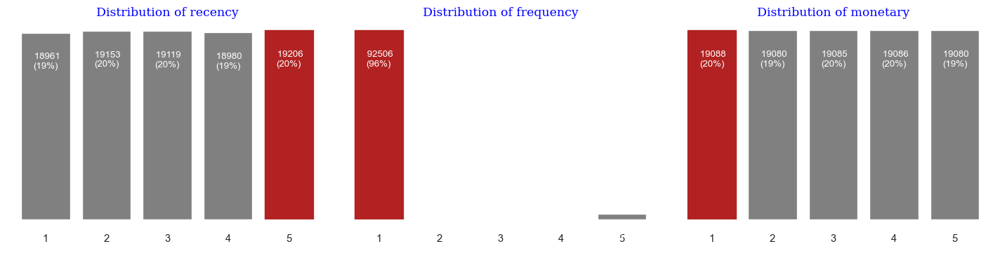

In [7]:

fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(15, 4))

for i, p in enumerate(['R', 'F','M']):
    parameters = {'R':'recency', 'F':'frequency','M':'monetary'}
    y = df_rfm[p].value_counts().sort_index()
    x = y.index
    ax = axes[i]
    bars = ax.bar(x, y, color='grey')
    ax.set_frame_on(False)
    ax.tick_params(left=False, labelleft=False, bottom=False,size=8)
    ax.set_title('Distribution of {}'.format(parameters[p]),
                fontdict=font2)
    for bar in bars:
        value = bar.get_height()
        if value == y.max():
            bar.set_color('firebrick')
        ax.text(bar.get_x() + bar.get_width() / 2,
                value - 5,
                '\n\n {}\n({}%)'.format(int(value), int(value * 100 / y.sum())),
               ha='center',
               va='top',
               color='w',size=10)
        ax.grid(False)
plt.show()

---------
Le graphique montre que la majorité de nos clients n'ont pas acheté à plusieurs reprises. la fréquence des achats reste très faible. 

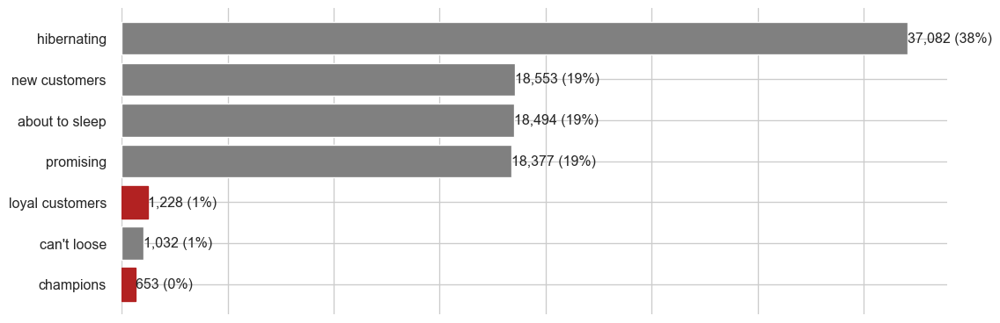

In [8]:
# count the number of customers in each segment
segments_counts = df_rfm['Segment'].value_counts().sort_values(ascending=True)

fig, ax = plt.subplots(figsize=(12,4), dpi=96)

bars = ax.barh(range(len(segments_counts)),
              segments_counts,
              color='grey')
ax.set_frame_on(False)
ax.tick_params(left=False,
               bottom=False,
               labelbottom=False)
ax.set_yticks(range(len(segments_counts)))
ax.set_yticklabels(segments_counts.index,size=12)

for i, bar in enumerate(bars):
        value = bar.get_width()
        if segments_counts.index[i] in ['champions', 'loyal customers']:
            bar.set_color('firebrick')
        ax.text(value,
                bar.get_y() + bar.get_height()/2,
                '{:,} ({:}%)'.format(int(value),
                                   int(value*100/segments_counts.sum())),
                va='center',
                ha='left',size=12
               )
plt.savefig(imgPath + 'rfm_segment.png', bbox_inches='tight')
plt.show()

#### <font color="#337da4"> Matrice RFM </font>
----------------------------

In [9]:
df_rfm['Segment'].unique()

array(['promising', 'hibernating', 'about to sleep', 'new customers',
       'loyal customers', 'champions', "can't loose"], dtype=object)

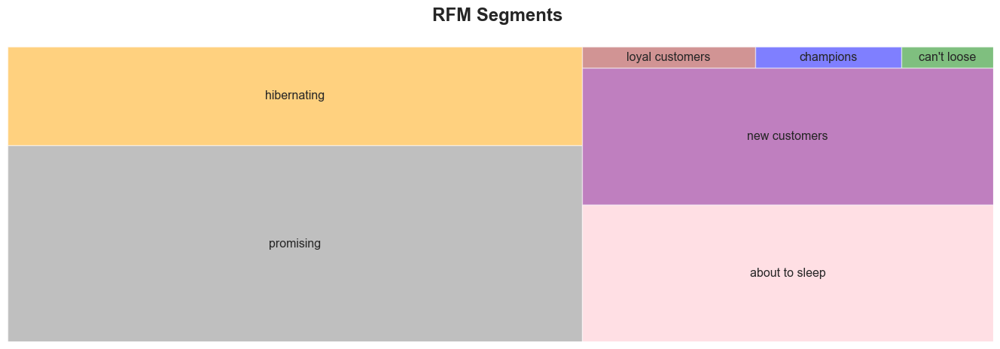

In [10]:
import squarify

squarity =df_rfm['Segment'] .value_counts()
color=['grey','orange','pink','purple', 'brown', 'blue', 'green', 'red',"#0072B2", "#D55E00", "#CC79A7"]


fig = plt.gcf()
ax = fig.add_subplot()
fig.set_size_inches(14, 5)
squarify.plot(sizes= squarity , 
              label=['promising', 'hibernating', 'about to sleep', 'new customers',
                     'loyal customers', 'champions', "can't loose",] ,
              color = color, alpha=0.5)

plt.title("RFM Segments \n", fontsize=18, fontweight="bold")
plt.axis('off')
fig.savefig(imgPath + 'rfm_segment2.png', bbox_inches='tight')
plt.show()

#### <font color="#337da4" id="1.4"> 1.4. Description des segments </font>
----------------------------

<h5>1 – Champions  </h5>
Les Champions sont vos meilleurs clients. Cette catégorie regroupe ceux qui ont acheté récemment (R élevé), qui achètent très régulièrement (F élevée) et qui dépensent le plus (M élevé).

<h5>2 – Loyal customers: Clients fidèles </h5> 
Le client fidèle se situe sur une catégorie en dessous : il dépense en général beaucoup (M élevé) et régulièrement (F élevé). Il doit tout de même faire l'objet de toute votre attention.

<h5>3 – potential loyalists: Clients potentiellement fidèles </h5> 
Le client potentiellement fidèle est un client récemment acquis (R faible), mais qui a dépensé une belle somme d'argent (M élevé) et a acheté plusieurs fois (F élevé).

<h5>4 – New customers: Clients récents </h5> 
Comme son nom l'indique, le client récent a fait récemment appel à vos services pour la première fois (R élevé). Néanmoins, ce n'est pas le plus actif puisqu'il dépense assez peu fréquemment (F faible).

<h5>5 – Promising: Clients prometteurs </h5> 
Comme le client récent, le client prometteur a récemment acheté un de vos produits (R élevé) mais ne dépense pas beaucoup (M faible).

<h5>6 – Need attention: Clients qui méritent une attention </h5>
Le client qui mérite votre attention se situe au-dessus de la moyenne concernant à la fois la récence, la fréquence et le montant. Cependant, il n'a pas forcément acheté récemment (R faible).

<h5>7 – About to sleep:Clients sur le point de s'endormir </h5>
Contrairement au client qui mérite de l'attention, le client sur le point de s'endormir se situe en dessous de la moyenne, aussi bien en termes de récence, de fréquence que de montant. Si vous ne faites rien pour le réactiver, vous risquez grandement de le perdre définitivement.

<h5>8 – At risk: Clients à risque </h5>
Le client à risque est un ancien très bon client, c'est-à-dire qu'il a dépensé beaucoup d'argent dans votre marque (M élevé) et régulièrement (F élevé). Mais, tout cela était il y a bien longtemps (R faible).

<h5>9 – Can't loose:Clients que vous ne devez pas perdre</h5>
Il y a des clients que vous pouvez vous permettre de perdre, comme ceux qui n'ont jamais montré de signe de fidélité, ou ceux qui sont très volatils dans leurs choix et montrent peu de cohérence dans leurs achats. Les clients que vous ne pouvez pas vous permettre de perdre sont ceux ayant acheté souvent (F élevé) et ayant effectué les plus gros achats (M élevé). Mais cela fait un moment qu'ils n'ont plus racheté (R faible).

<h5>10 – Hibernating: Clients en hibernation </h5>
Ici, on commence à se diriger vers des profils moins intéressants dans la matrice RFM. Le client en hibernation est, comme son nom l'indique, passif : son dernier achat remonte à un certain temps (F faible), il ne dépense plus beaucoup (M faible) et de moins en moins (F faible). Bref, il est quasiment perdu !

<h5>11 – Lost: Clients perdus </h5>
Le client perdu a les plus faibles scores en Récence, Fréquence et Montant. Pourtant, un client perdu est un client quand même ! Vous avez fourni tous les efforts pour capter son attention à un moment T et le faire souscrire à une de vos offres, ce serait bête de ne pas essayer de le reconquérir !

### <font color="#337da4" id="2"> 2. Clustering K-means (RFM) </font>
----------------------------

[***Le clustering***](https://pythonds.linogaliana.fr/clustering/) est un champ d'application de l'apprentissage ***non-supervisé***. Il s'agit d'exploiter l'information disponible pour regrouper des observations qui se ressemblent.     

L'objectif est de créer des clusters d'observations pour lesquels :    
- au sein de chaque cluster, les observations sont homogènes (variance intra-cluster minimale)
- les clusters ont des profils hétérogènes, c'est-à-dire qu'ils se distinguent les uns des autres (variance inter-cluster maximale)

***L'objectif de l'algorithme des k-moyennes (k-means)*** est de découper notre dataset en ***k paquets (k=nombre de clusters)*** qui se ressemblent. Le résultat du regroupement pourra définir une étiquette associée à chaque élément du dataset. C'est en ça que cette technique est classée dans l'apprentissage non supervisé, par opposition aux techniques où le libellé est fourni au modèle en même temps que les données.

C'est un algorithme itératif qui va affiner sa solution à chaque étape. L'algorithme va déplacer itérativement k centres de paquets (appelés centroïdes) pour les rapprocher des points dont ils sont les plus proches.

***Étapes de l'algorithme :***

> - positionnement des k centroïdes ;
> - pour chaque itération

>> - associer chaque point du dataset au centroïde le plus proche,
>> - déplacer les k centroïdes vers les barycentres des points dont ils sont les plus proches.

L'algorithme s'arrête lorsqu'on a atteint le nombre maximum d'itérations ou lorsque les centroïdes ne bougent plus.

[***Determination du nombre de clusters***](https://pythonds.linogaliana.fr/clustering/)

Le nombre de clusters est fixé par le modélisateur. Il existe plusieurs façons de fixer ce nombre :

> - connaissance a priori du problème ;
> - analyse d’une métrique spécifique pour définir le nombre de clusters à choisir ;
> - etc.

Il y a un arbitrage à faire entre biais et variance : un trop grand nombre de clusters implique une variance intra-cluster très faible (sur-apprentissage, même s’il n’est jamais possible de déterminer le vrai type d’une observation puisqu’on est en apprentissage non supervisé).

Sans connaissance a priori du nombre de clusters, on peut recourir à deux familles de méthodes :

> - ***La méthode du coude (elbow method):*** On prend le point d’inflexion de la courbe de performance du modèle. Cela représente le moment où ajouter un cluster (complexité croissante du modèle) n’apporte que des gains modérés dans la modélisation des données.


> - ***Le score de silhouette :*** La méthode de silhouette est également une méthode pour trouver le nombre optimal de clusters. Le coefficient de silhouette est une mesure de la similitude d’un point de données à l’intérieur d’un groupe par rapport à d’autres groupes.([details](https://fr.wikipedia.org/wiki/Silhouette_(clustering)))

***Plus spécifiquement :***
**Le score de silhouette** d’une observation est donc égal à: 

$ \displaystyle S=\displaystyle \frac{(m\_nearest\_cluster - m\_intra\_cluster)}{max( m\_nearest\_cluster,m\_intra\_cluster)}$


- `m_intra_cluster` est la moyenne des distances de l’observation aux observations du même cluster
- `m_nearest_cluster` est la moyenne des distances de l’observation aux observations du cluster le plus proche.

Le package `yellowbrick` fournit une extension utile à scikit pour représenter facilement la performance en clustering.

#### <font color="#337da4" id="2.1"> 2.1. Clustering avant réduction </font>
----------------------------

La plupart du temps, en machine Learning, les données du dataset présentent des ordres de grandeurs différents. Cette différence d’échelle peut conduire à des performances moindres. Pour palier à cela, des traitements préparatoires sur les données existent: ***feature scaling***.

>- La normalisation ne s’effectue généralement que sur des variables quantitatives.
>- En général, la normalisation impacte les modèles basés sur la descente du gradient, le calcul de distance ou de variance.
>- L’effet de la normalisation sur certains algorithmes basés sur les seuils (arbres de décisions) semble être négligeable.

##### <font color="#337da4"> Preprocessing </font>

----------------------------

La préparation de données ou le data preprocessing ou le pré-traitement est un processus qui précède celui de l'analyse de données. Il est constitué de plusieurs tâches comme le nettoyage de données, l'encodage, la normalisation, le split des données, etc.

Au cours du data preprocessing, les données dites « brutes » sont soumises à différents traitements afin de les rendre exploitables pour l'étape de la construction de modèles.

In [11]:
# Nous allons faire une pipeline.
# scaler =  MinMaxScaler()
rfm_features=['recency', 'frequency', 'monetary']
# preprocessor = ColumnTransformer([
#     ('scaler', scaler, rfm_features)
# ])
random_state = 42
X = df_rfm[rfm_features].copy()

In [12]:
from sklearn import set_config

from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder,PolynomialFeatures
from sklearn.compose import make_column_selector as selector
from sklearn.compose import ColumnTransformer

def prepro(X):
    numeric_features=X.columns
    numeric_transformer = Pipeline(steps=[('imputer', SimpleImputer(strategy='median')),
                                          ('scaler', StandardScaler())])

    preprocessor = ColumnTransformer(transformers=[('num', numeric_transformer, numeric_features)])

    preprocessor = Pipeline(steps=[
        ('preprocessor', preprocessor)
    ])

    X_scaled= pd.DataFrame(data=preprocessor.fit_transform(X), 
                           index=X.index, columns=X.columns)
    return preprocessor, X_scaled


preprocessor, X_scaled=prepro(X)
preprocessor

set_config(display='diagram')
preprocessor

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  Index(['recency', 'frequency', 'monetary'], dtype='object'))]))])

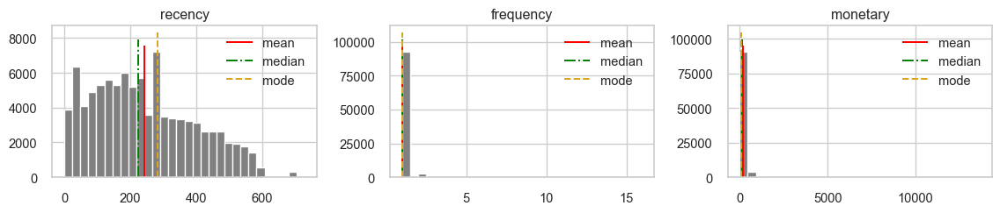

In [13]:


# import scipy.stats as st
# def plot_histograms(df, features, bins=30, figsize=(12,7), color = 'grey',
#                     skip_outliers=False, thresh=3, layout=(3,3), graphName=None):
 
#     fig = plt.figure(figsize=figsize, dpi=96)

#     for i, c in enumerate(features,1):
#         ax = fig.add_subplot(*layout,i)
#         if skip_outliers:
#             ser = df[c][np.abs(st.zscore(df[c]))<thresh]
#         else:
#             ser = df[c]
#         ax.hist(ser,  bins=bins, color=color)
#         ax.set_title(c)
#         ax.vlines(df[c].mean(), *ax.get_ylim(),  color='red', ls='-', lw=1.5)
#         ax.vlines(df[c].median(), *ax.get_ylim(), color='green', ls='-.', lw=1.5)
#         ax.vlines(df[c].mode()[0], *ax.get_ylim(), color='goldenrod', ls='--', lw=1.5)
#         ax.legend(['mean', 'median', 'mode'])
#         # ax.title.set_fontweight('bold')
#         # xmin, xmax = ax.get_xlim()
#         # ax.set(xlim=(0, xmax/5))
        
#     plt.tight_layout(w_pad=0.5, h_pad=0.65)

#     if graphName: 
#         plt.savefig(imgPath + graphName, bbox_inches='tight', dpi=400);
#     plt.show()
    

plot_histograms(X, rfm_features, bins=30, figsize=(12,7), color = 'grey',
                    skip_outliers=False, thresh=3, layout=(3,3), graphName=None)

#### <font color="#337da4"> Nombre optimal de cluster </font>

----------------------------

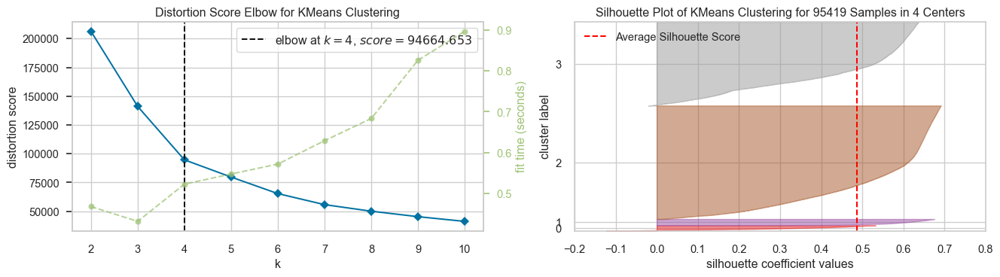

In [14]:
K_dist=elbowmetrics(X, preprocessor,  k_list=(4, 11), cols=2, figsize=(14, 4), 
               graphname='RFM_distortion.png')

-----
Avec la méthode du ***coude*** basée sur le ***score de distortion*** (paramètre par defaut): *(somme moyenne des carrés des distances aux centres)*, une segementation en $\large K = 4$ clusters est retenue, comme optimale.

Ici, **les clusters sont bien répartis et les séparations sont claires**.

-------------------
Nous allons, neamoins, **tester d'autres types de métriques** pour trouver le meilleur K :
- ***Silouhette*** : *rapport moyen entre la distance intra-cluster et la distance du cluster le plus proche*,
- ***Calinski Harabasz*** : *rapport entre la dispersion des grappes dans et entre les groupes*.


##### <font color="#337da4"> Coefficient de silhouette </font>
-------------------------
En partitionnement de données (clustering), ***le coefficient de silhouette*** est une mesure de qualité d'une partition d'un ensemble de données en classification automatique. Pour chaque point, son coefficient de silhouette est la différence entre la distance moyenne avec les points du même groupe que lui (***cohésion***) et la distance moyenne avec les points des autres groupes voisins (***séparation***). Si cette différence est négative, le point est en moyenne plus proche du groupe voisin que du sien : ***il est donc mal classé***. À l'inverse, si cette différence est positive, le point est en moyenne plus proche de son groupe que du groupe voisin : ***il est donc bien classé***.

Le coefficient de silhouette proprement dit est la moyenne du coefficient de silhouette pour tous les points. 


***Le coefficient (ou score) de silhouette*** se définit d'abord sur un point ${\textstyle i}$ dont le groupe est ${\textstyle k=C(i)}$. Il se base sur la distance moyenne du point à son groupe : 

$${\large \displaystyle \textstyle a(i)={\displaystyle \frac {1}{\vert I_{k}\vert -1}}\displaystyle \sum _{j\in I_{k},j\neq i}d(x^{i},x^{j})} $$ 

et la distance moyenne du point à son groupe voisin 

$${\large \textstyle b(i)}={\displaystyle \min_{k'\neq k}{\frac{1}{\vert I_{k'}\vert }}\displaystyle \sum_{i'\in I_{k'}}d(x^{i},x^{i'})}$$ 
Le coefficient de silhouette du point ${\textstyle i}$ s'écrit alors :

$${\large \displaystyle s_{sil}(i)}={\displaystyle \frac {b(i)-a(i)}{\displaystyle \max(a(i),b(i))}}$$

On peut le moyenner groupe par groupe pour comparer leurs homogénéités : ceux avec les coefficient de silhouette les plus forts sont les plus homogènes. Sur l'ensemble de la classification, il aura pour expression :

$${\large \displaystyle S_{sil}=\displaystyle \frac {1}{K}}\sum _{k=1}^{K}{\frac {1}{\vert I_{k}\vert }}\sum _{i\in I_{k}}s_{sil}(i)$$

##### <font color="#337da4"> Indice de Calinski-Harabasz</font>
-------------------------
[L'indice de Calinski-Harabasz](https://fr.wikipedia.org/wiki/Indice_de_Calinski-Harabasz#) est une mesure de qualité d'une partition d'un ensemble de données en classification automatique.
C'est le rapport entre la variance inter-groupes et la variance intra-groupe.

Il se rapproche beaucoup du critère utilisé pour stopper certains algorithmes de partitionnement, comme les K-means. De tels algorithmes vont donc maximiser ce score, par construction.

Une alternative à l'indice de Calinski-Harabasz est **l'indice de Dunn** ou encore **l'indice de Davies-Bouldin.**

**Expression mathématique**:

${\large \displaystyle \textstyle \mu _{k}={\displaystyle\frac {1}{\vert I_{k}\vert }}\displaystyle\sum _{i\in I_{k}}x^{i}}$ le point moyen du groupe ${\large \displaystyle \textstyle k}$ et ${\large \displaystyle \textstyle \mu ={\displaystyle\frac {1}{N}}\displaystyle\sum _{i=1}^{N}x^{i}} $ le point moyen de tout le nuage. L'indice (ou score) de Calinski-Harabasz, 

${\large \displaystyle \textstyle S_{CH}}$, se base sur la variance inter-groupes 

${\large \displaystyle \textstyle B=\sum _{k=1}^{K}\vert I_{k}\vert \Vert \mu _{k}-\mu \Vert ^{2}}$ et les variances intra-groupes 

${\large \displaystyle \textstyle W_{k}=\sum _{i\in I_{k}}\Vert x^{i}-\mu _{k}\Vert ^{2}}$.

Il aura pour expression :

$${\large \displaystyle  S_{CH}={\displaystyle \frac{(N-K)B}{\displaystyle (K-1)\sum _{k=1}^{K}W_{k}}}}$$

**L'indice de Calinski-Harabasz** varie entre 0 (pire classification) et ${\textstyle +\infty }$ (meilleure classification). Il dépend fortement de ${\textstyle N}$ (le nombre de points dans l'échantillon). Toutes choses égales par ailleurs, il croit linéairement avec ${\textstyle N}$. Par conséquent, son ordre de grandeur peut varier considérablement d'un jeu de données à l'autre.

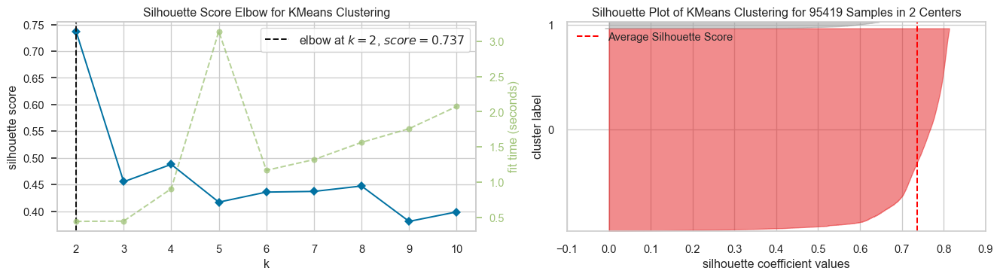

In [15]:
metrics = ["silhouette"]
K_silhouette=elbowmetrics(X, preprocessor, metrics=metrics, k_list=(4, 11), cols=2, figsize=(14, 4), 
               graphname='RFM_silhouette.png') 

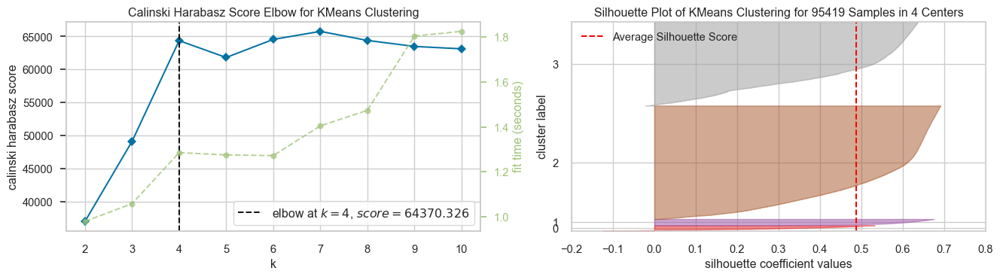

In [16]:
metrics = ["calinski_harabasz"]
K_calinski=elbowmetrics(X, preprocessor, metrics=metrics, k_list=(4, 11), cols=2, figsize=(14, 4), 
               graphname='RFM_calinski.png') 

In [14]:
from sklearn.metrics import davies_bouldin_score
def nbclusters_Bouldin(data, centers):
    scores = []
    for K in centers:
        kmeans = KMeans(n_clusters=K, random_state=random_state)
        labels = kmeans.fit_predict(data)    
        scores.append(davies_bouldin_score(data, labels))
    plt.figure(figsize=(8,3))
    plt.plot(centers, scores, linestyle='--', marker='o', color='b');
    plt.xlabel('K');
    plt.ylabel('Davies Bouldin score');
    plt.title('Davies Bouldin score vs. K')
    nb_bd=centers[np.argmin(scores)]
    print(clr.color+'*' * 53+clr.end)
    print('Le nombre optimal de clusters est de :', nb_bd)
    print(clr.color+'*' * 53+clr.end)
    return nb_bd;

*****************************************************
Le nombre optimal de clusters est de : 2
*****************************************************


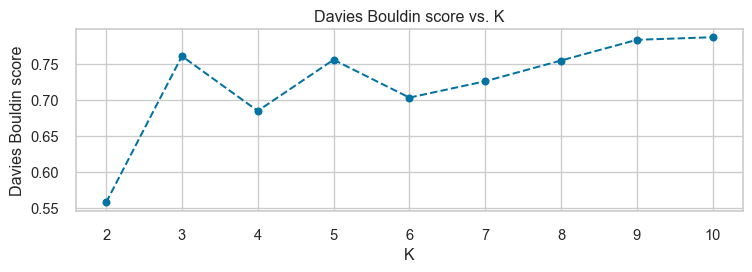

In [15]:
X_scaled= pd.DataFrame(data=preprocessor.fit_transform(X), 
                       index=X.index, columns=X.columns)
K_bouldin=nbclusters_Bouldin(X_scaled, range(2,11))

------
Ces métriques donnent des résultats différents. la méthode de ***Calinski-Harabasz*** donne un résultat (5) proche de celle de la ***distortion (4)*** (paramètre par defaut.). 

Quant à la méthode de ***Davies Bouldin***, nous avons 3 comme nombre optimal de clusters.

Nous allons retenir le résultat de la méthode distortion $K=4$ (K_dist) comme le nombre optimal de cluster.

In [14]:
KBest=4

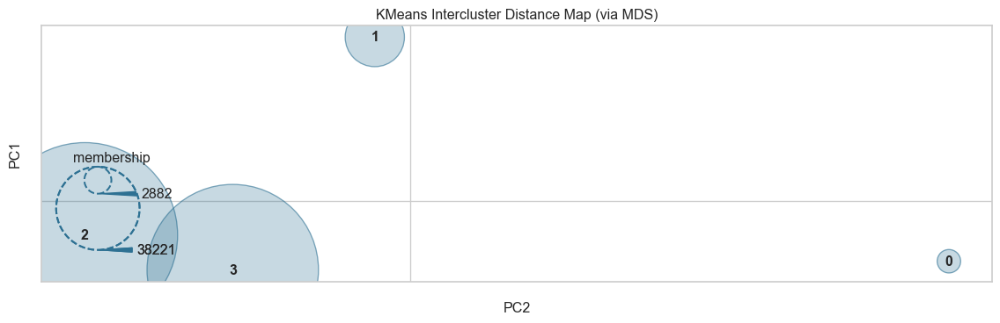

In [15]:
# # Intercluster distance Map avec le k optimal
# def distanceInterCluster(X, preprocessor, K, graphname: str = None):
#     distance_visualizer = Pipeline([
#         ("preprocessor", preprocessor),
#         ("distancevisualizer", InterclusterDistance(KMeans(n_clusters=K, random_state=random_state)))])
#     distance_visualizer.fit(X)
#     if graphname:
#         distance_visualizer.named_steps['distancevisualizer'].show(outpath=imgPath + graphname,
#                                                                    bbox_inches='tight', dpi=96)
#     else:
#         distance_visualizer.named_steps['distancevisualizer'].show(bbox_inches='tight', dpi=96)


        
distanceInterCluster(X, preprocessor, KBest, graphname='RFM_distanceCluster.png')

-------
Sur cette projection en 2D, on remarque que les différents clusters sont bien séparés sur les 2 premières composantes principales. Certains clusters se chevauchent. Nous allons,maintenant nous pencher sur la visualisation et la description des caracteristiques des différents clusters.

#### <font color="#337da4"> Visualisation et Analyse des différents clusters</font>
-------------------------

A présent, nous allons entrainer notre KMeans avec le K optimal sélectionné et affecter son cluster à chaque client. Ainsi, nous pourrons analyser les différences entre chaque cluster :

In [37]:
def visualizer(X, preprocessor, K, var1, var2, echelle=1000, figsize=(14, 8),
               titre='Visualisation clustering', graphname: str = None):
    kmeans = Pipeline(steps=[('preprocessor', preprocessor),
                             ('kmeans', KMeans(K, random_state=random_state))])
    kmeans.fit(X)
    y_kmeans = kmeans.fit_predict(X)
    # --- Figures Settings ---
    listecolors = ['#FFBB00', '#3C096C', '#A10115', '#C0B2B5', '#221f1f', "black",
                   "hotpink", "b", "#4CAF50", '#EAD39C', '#7D5E3C', '#9D4EDD', '#FFE270']
    cluster_colors = listecolors[:K]
    labels = ['Cluster ' + (str(i + 1)) for i in range(K)] + ['Centroids']
    title = dict(fontsize=15, fontweight='bold', style='italic', fontfamily='serif')
    text_style = dict(fontweight='bold', fontfamily='serif')
    scatter_style = dict(linewidth=0.65, edgecolor='#100C07', alpha=0.85)
    legend_style = dict(borderpad=2, frameon=False, fontsize=8)
    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=figsize, dpi=96)

    # --- Silhouette Plots ---
    # s_viz = SilhouetteVisualizer(kmeans, ax=ax1, colors=cluster_colors)
    s_viz = Pipeline([
        ("preprocessor", preprocessor),
        ("silhouettevisualizer", SilhouetteVisualizer(KMeans(n_clusters=K, random_state=random_state),
                                                      ax=ax1, colors=cluster_colors))])

    s_viz.fit(X)
    s_viz.named_steps['silhouettevisualizer'].finalize()
    s_viz.named_steps['silhouettevisualizer'].ax.set_title('Graphique Silhouette des clusters\n', **title)
    s_viz.named_steps['silhouettevisualizer'].ax.tick_params(labelsize=7)
    for text in s_viz.named_steps['silhouettevisualizer'].ax.legend_.texts:
        text.set_fontsize(9)
    for spine in s_viz.named_steps['silhouettevisualizer'].ax.spines.values():
        spine.set_color('None')
    s_viz.named_steps['silhouettevisualizer'].ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), **legend_style)
    s_viz.named_steps['silhouettevisualizer'].ax.grid(axis='x', alpha=0.5, color='#9B9A9C', linestyle='dotted')
    s_viz.named_steps['silhouettevisualizer'].ax.grid(axis='y', alpha=0)
    s_viz.named_steps['silhouettevisualizer'].ax.set_xlabel('\n Coefficient Values', fontsize=9, **text_style)
    s_viz.named_steps['silhouettevisualizer'].ax.set_ylabel('Cluster Labels\n', fontsize=9, **text_style)

    # --- Clusters Distribution ---
    y_kmeans_labels = list(set(y_kmeans.tolist()))
    for i in y_kmeans_labels:
        ax2.scatter(X.loc[y_kmeans == i, var1], X.loc[y_kmeans == i, var2], s=50, c=cluster_colors[i], **scatter_style)
    ax2.scatter(kmeans.named_steps['kmeans'].cluster_centers_[:, 0],
                kmeans.named_steps['kmeans'].cluster_centers_[:, 1],
                s=65, c='#0353A4', label='Centroids', **scatter_style)
    for spine in ax2.spines.values():
        spine.set_color('None')
    ax2.set_title('Scatter Plot Clusters Distributions\n', **title)
    ax2.legend(labels, bbox_to_anchor=(0.95, -0.05), ncol=5, **legend_style)
    ax2.grid(axis='both', alpha=0.5, color='#9B9A9C', linestyle='dotted')
    ax2.tick_params(left=False, right=False, labelleft=False, labelbottom=False, bottom=False)
    ax2.spines['bottom'].set_visible(True)
    ax2.spines['bottom'].set_color('#CAC9CD')

    # --- Waffle Chart ---
    unique, counts = np.unique(y_kmeans, return_counts=True)
    df_waffle = dict(zip(unique, counts))
    total = sum(df_waffle.values())
    wfl_square = {key: value / echelle for key, value in df_waffle.items()}
    wfl_label = {key: round(value / total * 100, 2) for key, value in df_waffle.items()}

    ax3 = plt.subplot(2, 2, (3, 4))
    ax3.set_title('Pourcentage de chaque cluster\n', **title)
    ax3.set_aspect(aspect='auto')
    Waffle.make_waffle(ax=ax3, rows=6, values=wfl_square, colors=cluster_colors,
                       labels=[f"Cluster {i + 1} - ({k}%)" for i, k in wfl_label.items()], icons='child', icon_size=30,
                       legend={'loc': 'upper center', 'bbox_to_anchor': (0.5, -0.05), 'ncol': 4, 'borderpad': 2,
                               'frameon': False, 'fontsize': 10})
    ax3.text(0.01, -0.09, f'** 1 square ≈ {echelle} Clients', weight='bold', style='italic', fontsize=8)

    # --- Suptitle & WM ---
    plt.suptitle(titre, fontsize=14, **text_style)
    plt.gcf().text(0.9, 0.03, 'github.com/bouramayaya', style='italic', fontsize=8)
    plt.tight_layout()
    if graphname:
        fig.savefig(imgPath + graphname, bbox_inches='tight', dpi=96)
    plt.show();

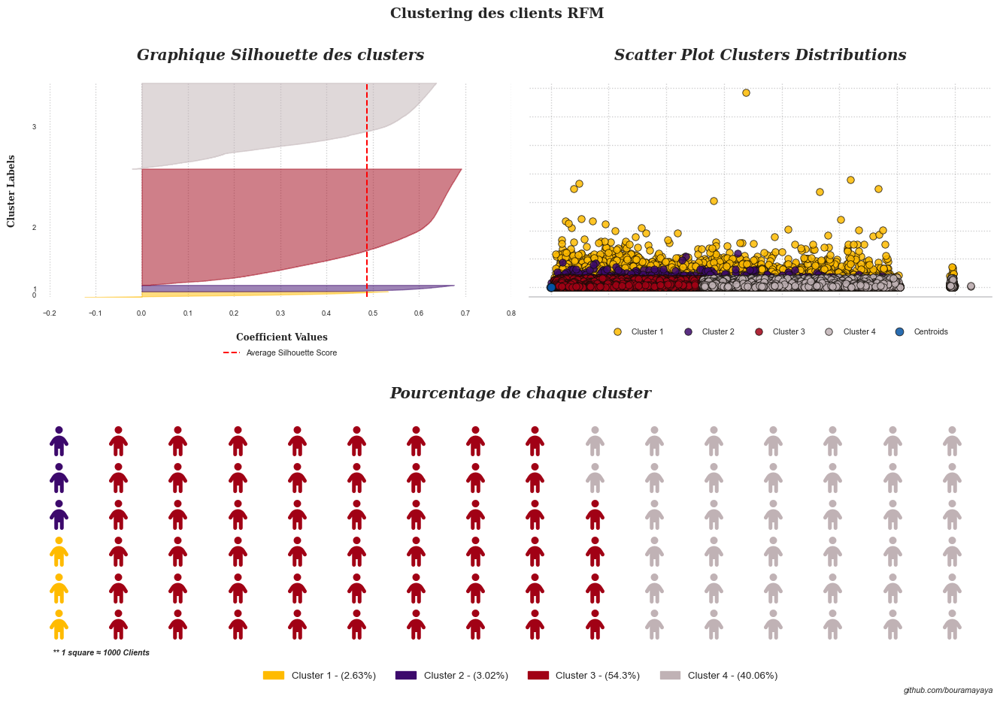

In [19]:
# --- Calling K-Means Functions ---
visualizer(X, preprocessor, K=KBest, var1='recency', var2='monetary', echelle=1000,figsize=(14, 10),
           titre='Clustering des clients RFM \n', graphname='visualizer_RFM1.png');

----------
Cette visualisation met en exergue les différents clusters. Ils sont tous visibles et bien séparés. Nous constatons juste quelques impurétés pour le premier cluster.

Aussi, nous constatons des disparités dans les tailles des clusters. ***Les deux premiers clusters sont de petites tailles.*** 

In [41]:
# from sklearn.decomposition import PCA
# from sklearn.manifold import TSNE, Isomap
# from umap import UMAP
# # pip uninstall umap
# # pip install umap-learn
# # import umap.umap_ as umap
# # !pip uninstall umap
# # !pip install umap-learn -i https://mirrors.ustc.edu.cn/pypi/web/simple
# # from umap import UMAP 

# # git clone https://github.com/lmcinnes/umap
# # cd umap
# # pip install --user -r requirements.txt
# # python setup.py install --user

def reduction(X, n_components):
    # PCA
    pipe1 = Pipeline([
            ('preprocessor', preprocessor), 
            ('pca', PCA(n_components=n_components,  random_state=random_state))
        ])

    X_pca = pd.DataFrame(pipe1.fit_transform(X))

    # TSNE
    pipe2 = Pipeline([
            ('preprocessor', preprocessor), 
            ('tsne', TSNE(n_components=n_components, verbose=0, perplexity=45, 
                          random_state=random_state, n_jobs=-1)),
        ])
    X_tsne = pd.DataFrame(pipe2.fit_transform(X))

    # UMAPgoo
    pipe3 = Pipeline([
            ('preprocessor', preprocessor), 
            ('umap', UMAP(n_components=n_components,  random_state=random_state, n_jobs=-1)),
        ])
    X_umap = pd.DataFrame(pipe3.fit_transform(X))
    return X_pca, X_tsne, X_umap, pipe1.named_steps['pca'].explained_variance_ratio_

In [17]:
X_pca, X_tsne, X_umap, variance_explique=reduction(X, 2)

In [42]:
import matplotlib.cm as cm
def projection_cluster(X, layout=(1,3), nb_clusters=None, graphname=None):

    text_style=dict(fontweight='bold', fontfamily='serif')
    ann=dict(textcoords='offset points', va='center', ha='center', fontfamily='serif', style='italic')
    title=dict(color='#114b98', fontsize=15, fontweight='bold', style='italic', fontfamily='serif')
    bbox=dict(boxstyle='round', pad=0.3, color='#FFDA47', alpha=0.6)
    ncols=layout[1]
    nrows=layout[0]
    fig, ax = plt.subplots(*layout,figsize=(5 * ncols, 4 * nrows))

    if nb_clusters:
        colors=AllColors[:nb_clusters]
        color_palette=AllColors[:nb_clusters] # ['#472165', '#FFBB00', '#3C096C', '#9D4EDD', '#FFE270']
        set_palette(color_palette)
        
        model_pca = KMeans(n_clusters=nb_clusters, random_state=random_state)
        model_pca.fit(X_pca)

        model_tsne = KMeans(n_clusters=nb_clusters, random_state=random_state)
        model_tsne.fit(X_tsne)

        model_umap = KMeans(n_clusters=nb_clusters, random_state=random_state)
        model_umap.fit(X_umap)
        
        # colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
        sns.scatterplot(x=X_pca.iloc[:,0], y=X_pca.iloc[:,1], data=X, legend="full", 
                        s=75, lw=0, alpha=1, c=model_pca.labels_, edgecolor='k', ax=ax[0])
        ax[0].set_title(r"Projection des clusters-PCA", 
                        **title)

        sns.scatterplot(x=X_tsne.iloc[:,0], y=X_tsne.iloc[:,1], data=X, legend="full",  
                        s=75, lw=0, alpha=1, c=model_tsne.labels_, edgecolor='k', ax=ax[1])
        ax[1].set_title(r"Projection des clusters-TSNE", **title)
        
        sns.scatterplot(x=X_umap.iloc[:,0], y=X_umap.iloc[:,1], data=X, legend="full",  
                        s=75, lw=0, alpha=1, c=model_umap.labels_, edgecolor='k', ax=ax[2])
        ax[2].set_title(r"Projection des clusters-UMAP", **title)
        
        # sns.scatterplot(x=X_isomap.iloc[:,0], y=X_isomap.iloc[:,1], data=X, legend="full",  
        #                 s=75, lw=0, alpha=1, c=colors, edgecolor='k', ax=ax[2])
        # ax[2].set_title("Projection-ISOMAP", **title)  
        
    else :
        colors=['#D72C16']
        sns.scatterplot(x=X_pca.iloc[:,0], y=X_pca.iloc[:,1], data=X, legend="full", c=colors, ax=ax[0])
        ax[0].set_title("Projection-PCA", **title)

        sns.scatterplot(x=X_tsne.iloc[:,0], y=X_tsne.iloc[:,1], data=X, legend="full", c=colors, ax=ax[1])
        ax[1].set_title("Projection-TSNE", **title)

        sns.scatterplot(x=X_umap.iloc[:,0], y=X_umap.iloc[:,1], data=X, legend="full", c=colors, ax=ax[2])
        ax[2].set_title("Projection-UMAP", **title)
        
        # sns.scatterplot(x=X_isomap.iloc[:,0], y=X_isomap.iloc[:,1], data=X, legend="full",  ax=ax[2])
        # ax[2].set_title("Projection-ISOMAP", **title)
    if graphname :
        fig.savefig(imgPath + graphname, bbox_inches='tight')

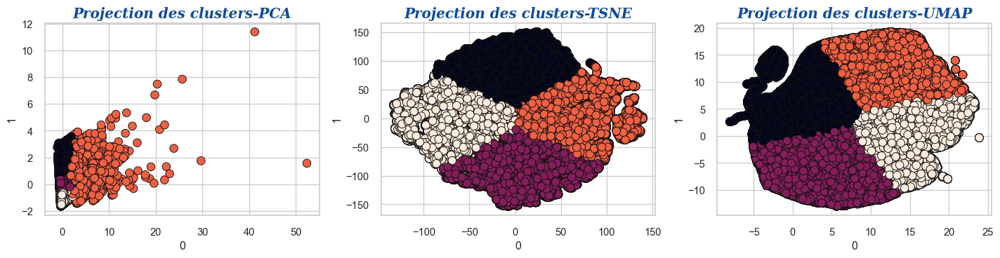

In [19]:
projection_cluster(X, layout=(1,3), nb_clusters=KBest, graphname='RFM_projection_Clusters.png')

-----------
Ici, nous avons projeté les clusters sur le plan en utilisant différentes méthodes: ***PCA, UMAP et t-SNE.***
Nous constatons que nous avons une meilleure visualisation avec les méthodes ***UMAP et t-SNE.***

In [27]:
X_pca3, X_tsne3, X_umap3, variance_explique3=reduction(X, n_components=3)
X_pca3.columns=['PC'+str(i) for i in range(1, 4)]
X_tsne3.columns=['TSNE'+str(i) for i in range(1, 4)]
X_umap3.columns=['UMAP'+str(i) for i in range(1, 4)]

In [43]:
from mpl_toolkits.mplot3d import Axes3D
def projection_3D(X, K, n_components=3):

    model_pca = KMeans(n_clusters=K, random_state=random_state)
    model_pca.fit(X_pca3)
    model_tsne = KMeans(n_clusters=K, random_state=random_state)
    model_tsne.fit(X_tsne3)
    model_umap = KMeans(n_clusters=K, random_state=random_state)
    model_umap.fit(X_umap3)
    
    fig = plt.figure(figsize=(15, 10))
    ax = fig.add_subplot(1,3,1, projection='3d')
    ax.scatter(X_pca3['PC1'], X_pca3['PC2'], X_pca3['PC3'], marker='o', s=30, edgecolor='k', c=model_pca.labels_)
    ax.set_xlabel('PC1 - ' + '{:.1f}%'.format(variance_explique3[0]*100))
    ax.set_ylabel('PC2 - ' + '{:.1f}%'.format(variance_explique3[1]*100))
    ax.set_zlabel('PC3 - ' + '{:.1f}%'.format(variance_explique3[2]*100))
    #ax.view_init(elev=15, azim=45)
    
    ax1 = fig.add_subplot(1,3,2, projection='3d')
    ax1.scatter(X_tsne3['TSNE1'], X_tsne3['TSNE2'], X_tsne3['TSNE3'], marker='o', 
                s=30, edgecolor='k', c=model_tsne.labels_)
    ax1.set_xlabel('TSNE1')
    ax1.set_ylabel('TSNE2')
    ax1.set_zlabel('TSNE3')
    #ax1.view_init(elev=15, azim=45)
    
    ax2 = fig.add_subplot(1,3,3, projection='3d')
    ax2.scatter(X_umap3['UMAP1'], X_umap3['UMAP2'], X_umap3['UMAP3'], marker='o', 
                s=30, edgecolor='k', c=model_umap.labels_)
    ax2.set_xlabel('UMAP1')
    ax2.set_ylabel('UMAP2')
    ax2.set_zlabel('UMAP3')
    #ax2.view_init(elev=15, azim=45)
    plt.show()

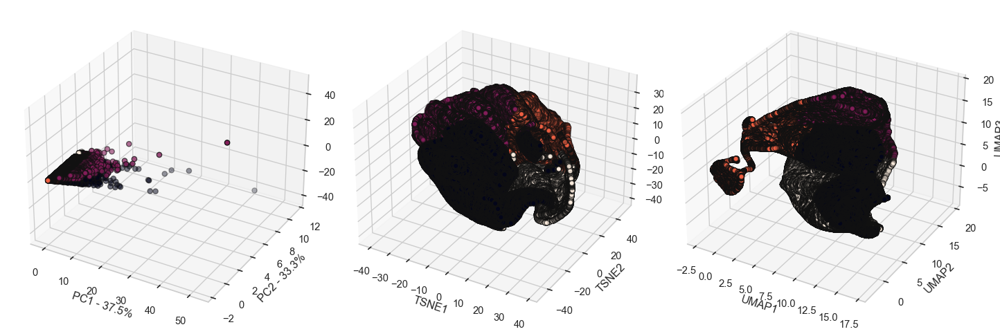

In [29]:
projection_3D(X, K=KBest,  n_components=3)

-----
Les projections en 3D ne sont pas bien lisibles. Les clusters sont superposés.     
Nous observons quelques individus atypiques sur le graphique PCA. 

In [30]:
commentaires='''
Nous observons une distinction nette des clusters (centroids ou centres des clusters). 

Ci dessous la description des clusters:

Cluster 1 - Bons clients sur le point d'abandonner-Ils ne font plus d'achats.

Cluster 2 - Clients qui sont frequents et sont hig value

Cluster 3 - Nouveaux clients et low value

Cluster 4 - Anciens clients qui n'ont pas fait beacoup d'acahts 
'''

In [44]:
varlist=['recency','monetary', 'delivery_delay_mean']
import matplotlib.lines as lines

def plot_centroid_3D(X, name="kmeans",
                    n_clusters=2, graphname=None, 
                    model=KMeans(n_clusters=2, random_state=random_state),
                   varlist=varlist, commentaires=None):
    
    kmeans_model = Pipeline([("preprocessor", preprocessor),
                                 (name, model)])
    kmeans_model.fit(X)
    kmeans_labels = kmeans_model.named_steps[name].labels_
    X_clusters=pd.DataFrame(data=preprocessor.fit_transform(X), index=X.index, columns=X.columns)
    X_clusters["Cluster"] = kmeans_labels+1
    labels = pd.DataFrame(kmeans_labels)
    # X_clusters_data = X_clusters.groupby("clusters", as_index=False).mean()
    # X_clusters_data
    # kmeans_sel = KMeans(n_clusters=2, random_state=random_state).fit(cluster_scaled)
    # labels = pd.DataFrame(kmeans_sel.labels_)
    # X_clusters = X_clusters.assign(Cluster=labels)
    grouped_km = X_clusters.groupby(['Cluster']).mean().round(1)
    grouped_km2 = X_clusters.groupby(['Cluster']).mean().round(1).reset_index()
    grouped_km2['Cluster'] = grouped_km2['Cluster'].map(str)
    grouped_km2
    mycolors = ['#2a333f', '#7D5E3C','#939da6','#0f4c81','#be3e35','#70090a','#244747','#A10115', '#D72C16', 
                '#F0EFEA', '#C0B2B5', '#221f1f', "black", "hotpink", "b", "#4CAF50",'#EAD39C']
    fig = plt.figure(figsize=(8,7))
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter(grouped_km2[varlist[0]], grouped_km2[varlist[1]], grouped_km2[varlist[2]],
               color=mycolors[:n_clusters], alpha=0.5,s=500)

    # add annotations one by one with a loop
    for line in range(0, grouped_km.shape[0]):
         ax.text(grouped_km2[varlist[0]][line], 
                 grouped_km2[varlist[1]][line],
                 grouped_km2[varlist[2]][line], s=('Cluster \n'+grouped_km2['Cluster'][line]), 
                 horizontalalignment='center', fontsize=12, fontweight='light', fontfamily='serif')

    ax.set_xlabel(varlist[0])
    ax.set_ylabel(varlist[1])
    ax.set_zlabel(varlist[2])

    fig.text(0.15, 1.0, 'Visualisation clusters en 3D', fontsize=15, fontweight='bold', fontfamily='serif')
    fig.text(0.15, .95, 'Nous observons l\'espace occupé par chaque cluster (moyenne/cluster)', 
             fontsize=12, fontweight='light', fontfamily='serif')

    fig.text(1.172, 1.0, 'Insight', fontsize=20, fontweight='bold', fontfamily='serif')
    fig.text(1.172, 0.60, commentaires, fontsize=12, fontweight='light', fontfamily='serif')

    l1 = lines.Line2D([1, 1], [0, 1], transform=fig.transFigure, figure=fig,color='black',lw=0.2)
    fig.lines.extend([l1])
    if graphname:
        fig.savefig(imgPath + graphname, bbox_inches='tight')

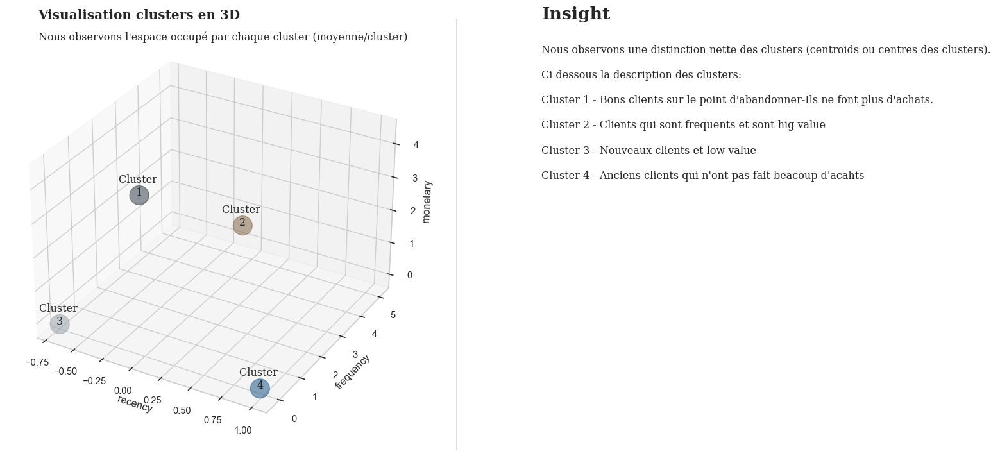

In [32]:
varlist=['recency','frequency','monetary']
plot_centroid_3D(X, name="kmeans", 
                n_clusters=KBest, graphname='rfm_centroid.png',
                model=KMeans(n_clusters=KBest, random_state=random_state),
                varlist=varlist, commentaires=commentaires)

#### <font color="#337da4"> Features importances </font>
-------------------------

In [45]:
def features_importances_analysis(X, K):
    data_dict={}
    data_dict['variables']=X.columns.tolist()

    # Perform K-means clustering
    kmeans = KMeans(n_clusters=K, random_state=random_state)
    kmeans.fit(X)  # X is your input data

    # Get cluster labels for each data point
    cluster_labels = kmeans.labels_

    # Calculate cluster centroids
    cluster_centers = kmeans.cluster_centers_

    # Calculate feature importances for each cluster
    feature_importances = np.zeros((kmeans.n_clusters, X.shape[1]))  # Initialize array for feature importances

    for cluster_label in range(kmeans.n_clusters):
        cluster_data = X[cluster_labels == cluster_label]  # Filter data points for current cluster
        cluster_mean = np.mean(cluster_data, axis=0)  # Calculate mean feature values for current cluster
        overall_mean = np.mean(X, axis=0)  # Calculate mean feature values for entire dataset
        feature_importances[cluster_label] = np.abs(cluster_mean - overall_mean)  # Calculate feature importances

    # Print feature importances for each cluster
    for cluster_label, importances in enumerate(feature_importances):
        listImpor=[]
        print(f"Cluster {cluster_label}:")
        for feature_idx, importance in enumerate(importances):
            print(X.columns.tolist()[feature_idx],f": {importance}")
            listImpor.append(importance.round(3))
        data_dict[f'Cluster '+str(cluster_label)]=listImpor

    dfeatures=pd.DataFrame(data_dict)
    return dfeatures
 

In [33]:
   
dfeatures=features_importances_analysis(X_scaled, KBest)
dfeatures

Cluster 0:
recency : 0.020942949490972473
frequency : 0.09870564288679809
monetary : 4.360682690015833
Cluster 1:
recency : 0.1134222104189505
frequency : 5.116754384294206
monetary : 0.5368000631085338
Cluster 2:
recency : 0.7184356528160253
frequency : 0.1610459707707522
monetary : 0.1356543440925964
Cluster 3:
recency : 0.981045785076301
frequency : 0.16104597077075217
monetary : 0.1425048281212174


,variables,Cluster 0,Cluster 1,Cluster 2,Cluster 3
0,recency,0.02,0.11,0.72,0.98
1,frequency,0.10,5.12,0.16,0.16
2,monetary,4.36,0.54,0.14,0.14


In [46]:
def graph_bar_plot(data, x, y,  axis, title, labelsize, rotation,
                  xlabsize, ylabsize, palette, saturation):
    g = sns.barplot(x=x, y=y, data=data, saturation=saturation, ax=axis, palette=palette)
    g.set(ylim=(data[y].min(), data[y].max()+0.2*data[y].max()))
    for label1 in axis.containers:
        axis.bar_label(label1, label_type='edge', fontsize=labelsize)  # color= AllColors[i],
    for tick in axis.get_xticklabels():
        tick.set_rotation(rotation)
#     axis.tick_params(axis='x')#, colors='black'
#     axis.tick_params(axis='y') # , colors='black'
    for tick in axis.xaxis.get_major_ticks():
        tick.label.set_fontsize(xlabsize)

    for tick in axis.yaxis.get_major_ticks():
        tick.label.set_fontsize(ylabsize)

    # axes.legend(prop=dict(size=10))
    #    axis.yaxis.set_tick_params(labelsize=ylabsize)
    # g.set_xticks([])
#     g.set_yticks([])
    g.set_xlabel('', size=xlabsize)
    g.set_ylabel('', size=ylabsize)
    # ax.title.set_text(title, fontdict = {'font.size':10})
    g.set_title(title + "\n", fontdict=font_title3)
    return g


#  --------------------------------------------------------------------------
# muted, pastel, coolwarm,'Accent', 'cubehelix',
# 'gist_rainbow', 'terrain', 'viridis', vlag
#  --------------------------------------------------------------------------


def features_importances_graph(data, aggvar, listvar, title, ncols=2, figsize=(12, 5), labelsize=8,
                rotation=0, xlabsize=8, ylabsize=8, palette='coolwarm', saturation=0.85, graphName=None,
                shareyy: bool = True, sharexx: bool = False):
    nplot = len(listvar)
    nrows = nplot // ncols + 1
    plt.figure(constrained_layout=True)
    with plt.style.context('seaborn'):
        with plt.rc_context(rc={'font.family': 'serif',  'font.size': 13}): 
            # ,'text.color':'#114b98', 'font.weight': 'bold', 'text.color':'#114b98',
            fig, axs = plt.subplots(nrows=nrows, ncols=ncols, sharey=shareyy, sharex=sharexx,
                                    constrained_layout=True, squeeze=False, figsize=figsize)
            axs = trim_axs(axs, nplot)
            for ax, var in zip(axs, listvar):
                graph_bar_plot(data, aggvar, var, ax, var, labelsize, rotation,
                          xlabsize, ylabsize, palette, saturation)
            fig.text(0.5, 0.90, title, ha="center", fontdict=font_title2)
            if graphName:
                fig.savefig(imgPath + graphName, bbox_inches='tight')
            # fig.subplots_adjust(top=0.88)
            fig.tight_layout()
            plt.show()

<Figure size 1152x384 with 0 Axes>

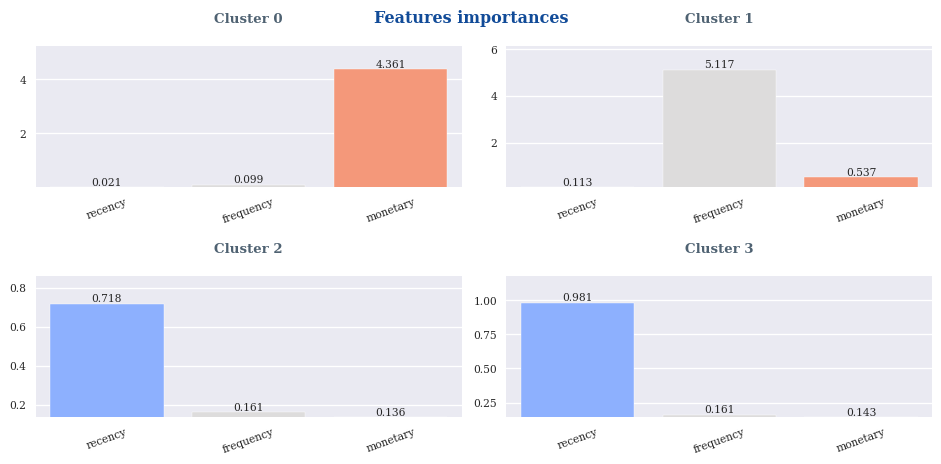

In [34]:
features_importances_graph(data=dfeatures, listvar=dfeatures.columns.tolist()[1:], aggvar='variables', 
            title = r"Features importances" "\n \n",
            ncols=2, figsize=(10, 7), labelsize=8, rotation=20, xlabsize=8, ylabsize=8,
            palette='coolwarm', saturation=1, graphName='Features_importances.png', 
                           shareyy= False, sharexx= False) # , graphName='Features_importances.png'

In [35]:
def description_cluster(X, KBest, 
                        model=KMeans(n_clusters=KBest, random_state=random_state),
                        metric='mean',
                        save=None):
    # --- Add K-Means Prediction to Data Frame ----
    model= Pipeline([("preprocessor", preprocessor),
                                 ("clusterer", model)])
    model.fit(X)
    labels=model.named_steps['clusterer'].labels_
    df_cluster=X[X.columns]
    df_cluster['clusters'] = labels+1
    df_cluster['clusters'] = 'Cluster '+df_cluster['clusters'].astype(str)


    # --- Calculationg Overall Mean from Current Data Frame ---
    df_profile_overall = pd.DataFrame()
    df_profile_overall['Overall'] = df_cluster.describe().loc[[metric]].T

    # --- Summarize Mean of Each Clusters --- 
    df_cluster_summary = (df_cluster.groupby('clusters').describe().T.reset_index()
                          .rename(columns={'level_0': 'Variables', 'level_1': 'Metrics'}))
    df_cluster_summary = df_cluster_summary[df_cluster_summary['Metrics'] == metric].set_index('Variables')

    # --- Combining Both Data Frame ---
    print(clr.start+'.: Statistiques par cluster :.'+clr.end)
    print(clr.color+'*' * 33)
    # f = {'Cluster 1':'{:.2f}'} #column col Cluster 1 to 2 decimals
    df_profile = np.round(df_cluster_summary.join(df_profile_overall).reset_index(), decimals = 3)
    df_styled=df_profile.style.format(precision=2).background_gradient(cmap='YlOrBr').hide_index()
    display(df_styled)
    if save:
        dfi.export(df_styled, imgPath + save)
        
    return df_profile
 

In [36]:
cluster_profile=description_cluster(X, KBest, 
                                    model=KMeans(n_clusters=KBest, random_state=random_state),
                                    metric='mean', save='RFM_profile_mean.png')

.: Statistiques par cluster :.
*********************************


Variables,Metrics,Cluster 1,Cluster 2,Cluster 3,Cluster 4,Overall
recency,mean,245.80,225.22,132.56,392.85,242.59
frequency,mean,1.01,2.12,1.00,1.00,1.03
monetary,mean,1148.19,284.57,132.70,131.15,163.33


In [37]:
cluster_profile=description_cluster(X, KBest, 
                                    model=KMeans(n_clusters=KBest, random_state=random_state),
                                    metric='50%', save='RFM_profile_median.png')

.: Statistiques par cluster :.
*********************************


Variables,Metrics,Cluster 1,Cluster 2,Cluster 3,Cluster 4,Overall
recency,50%,231.00,204.00,134.00,380.00,223.00
frequency,50%,1.00,2.00,1.00,1.00,1.00
monetary,50%,921.05,220.31,102.36,99.22,106.26


#### <font color="#337da4"> Caracteristiques des clusters </font>
----------------------------
> Cluster 1 - Bons clients (Super High value) sur le point d'abandonner - Ils ne font plus d'achats.    
> Cluster 2 - Clients qui sont frequents et sont high value   
> Cluster 3 - Nouveaux clients et low value   
> Cluster 4 - Anciens clients qui n'ont pas fait beacoup d'achats   

In [38]:
kmeans_model= Pipeline([("preprocessor", preprocessor),
                             ("kmeans", KMeans(n_clusters=KBest, random_state=random_state))])
kmeans_model.fit(X)
labels=kmeans_model.named_steps['kmeans'].labels_+1
df_cluster=pd.concat([X, pd.DataFrame(data=labels,index=X.index, columns=['clusters'])], axis=1)
# df_cluster['clusters'] = labels+1
df_cluster['clusters'] = 'Cluster '+ df_cluster['clusters'].astype(str)

In [39]:
def desc_cluster_bar(df_cluster, varlist, cluster_var='clusters', 
                     ncols=3, figsize=(14, 5), rotation=0):
    nplot = len(varlist)
    nrows = int(np.ceil(nplot / ncols))  # .astype(int) # nplot // cols + 1
    nbclusters= df_cluster[cluster_var].nunique()
    orders=df_cluster[cluster_var].unique().tolist()
    orders.sort()
    fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=figsize)
    axs = trim_axs(axs, nplot)
    for i, var in enumerate(varlist):
        sns.barplot(x=cluster_var, y=var,data=df_cluster, order=orders, ax=axs[i])
        axs[i].set_title(var, fontweight="bold", fontfamily='serif', fontsize=12, color='#244247')
        for tick in axs[i].get_xticklabels():
            tick.set_rotation(rotation)
    plt.subplots_adjust(left=0.1,
                        bottom=0.1, 
                        right=0.9, 
                        top=0.8, 
                        wspace=0.4, 
                        hspace=0.4)

    fig.tight_layout()
    plt.show()
 

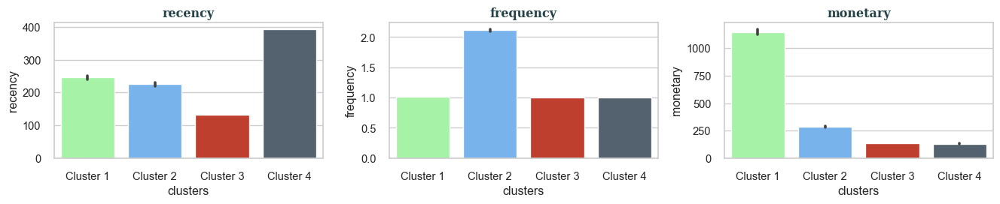

In [40]:
desc_cluster_bar(df_cluster, varlist, cluster_var='clusters', ncols=3, figsize=(14, 3))

In [41]:
def desc_cluster_boxplot(df_cluster, varlist, cluster_var='clusters', 
                     ncols=3, figsize=(14, 5), outliers=True, rotation=0, graphName:str=None):
    nplot = len(varlist)
    nrows = int(np.ceil(nplot / ncols))  # .astype(int) # nplot // cols + 1
    nbclusters= df_cluster[cluster_var].nunique()
    orders=df_cluster[cluster_var].unique().tolist()
    orders.sort()
    # my_palette = sns.color_palette("muted", len(unique))
    
    fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=figsize)
    axs = trim_axs(axs, nplot)
    for i, var in enumerate(varlist):
        sns.boxplot(x=cluster_var, y=var, data=df_cluster, ax=axs[i], showfliers=outliers, # , fliersize=3
                   palette=['#244247','#91b8bd','#4daf4a', '#984ea3', '#ff7f00', '#ffff33',
             '#a65628', '#f781bf', "#E69F00", "#56B4E9", "#009E73", "#F0E442", "#0072B2", "#D55E00", "#CC79A7",
             "#000000", "b", "#4CAF50"], order=orders, boxprops=dict(alpha=.9))
        axs[i].set_title(var, fontweight="bold", fontfamily='serif', fontsize=13, color='#244247')
        axs[i].set_xlabel('')

        # sns.despine(right=True)
        # sns.despine(offset=10, trim=True)

        # axs[i].legend().set_visible(False)
        for tick in axs[i].get_xticklabels():
            tick.set_rotation(rotation)
            
    plt.subplots_adjust(left=0.1,
                        bottom=0.1, 
                        right=0.9, 
                        top=0.8, 
                        wspace=0.4, 
                        hspace=0.4)

    fig.tight_layout()
    if graphName:
        fig.savefig(imgPath + graphName, bbox_inches='tight')
    plt.show()
  

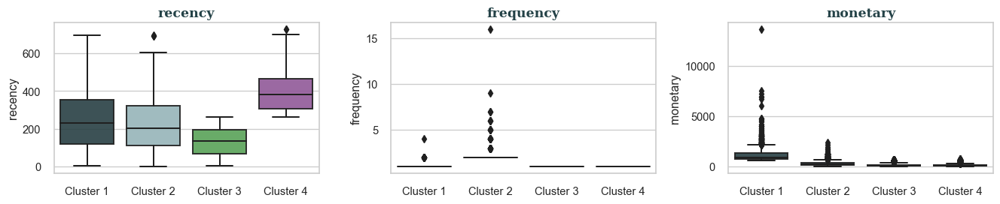

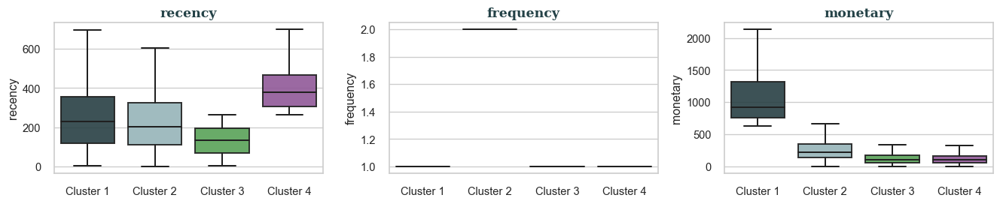

In [42]:
desc_cluster_boxplot(df_cluster, varlist, cluster_var='clusters', ncols=3, figsize=(14, 3),
                     outliers=True, rotation=0, graphName='Cluster_boxplot_with_outliers.png')
desc_cluster_boxplot(df_cluster, varlist, cluster_var='clusters', ncols=3, figsize=(14, 3),
                     outliers=False, rotation=0, graphName='Cluster_boxplot_without_outliers.png')

In [14]:
X_scaled = preprocessor.fit_transform(X)
X_scaled = pd.DataFrame(X_scaled, index=X.index, columns=X.columns)

kmeans_model= Pipeline([("preprocessor", preprocessor),
                             ("kmeans", KMeans(KBest))])
kmeans_model.fit(X)
labels=kmeans_model.named_steps['kmeans'].labels_
df_cluster=pd.concat([X, pd.DataFrame(data=labels,index=X.index, columns=['clusters'])], axis=1)
X_scaled["kmeans_label"] = labels
X_scaled_clusters = X_scaled.groupby("kmeans_label", as_index=False).mean()
ser_mean = X_scaled.groupby("kmeans_label", as_index=False).mean()
ser_median = X_scaled.groupby("kmeans_label", as_index=False).median()
# X_scaled_clusters
# df_cluster

In [15]:
# !pip install plotly

In [16]:
import plotly.offline as po
import plotly.io as pio
from plotly.subplots import make_subplots
import plotly.graph_objects as go

def rows_cols_update(rows, row, cols, col):
    if col + 1 > cols:
        row, col = row + 1, 1
    else:
        row, col = row, col + 1
    return row, col

def plot_radars(X_data, model,  cols=2, scaler = MinMaxScaler(feature_range=(0.1,1)), 
                width=1100, height=500, graphName=None):
    model.fit(X_data)
    labels = model.labels_
    X_clusters=X_data.assign(clusters=labels)
    X_clusters = X_clusters.groupby('clusters', as_index=False).mean()

    unique, counts = np.unique(labels, return_counts=True)
    nplot = len(set(unique))
    row, col = 1, 1
    rows = int(np.ceil(nplot / cols))  # .astype(int) # nplot // cols + 1

    data1=X_clusters[['clusters']]
    data2=X_clusters.drop('clusters', axis=1)

    group2=list(data2.columns)
    data2 = pd.DataFrame(scaler.fit_transform(data2),
                        columns=data2.columns)
    data=pd.concat([data1, data2], axis=1)
    # data=data[[group]+group2]
    # fig = go.Figure()
    # Créer une instance de la classe make_subplots avec les dimensions souhaitées
    fig = make_subplots(rows=rows, cols=cols, specs=[[{'type': 'polar'}] * cols] * rows,
                        subplot_titles=[f'Cluster {cat+1} \n' for cat in data['clusters']])
    # Spécification des tailles des figures
    fig.update_layout(
        autosize=False,
        width=width,  # Largeur totale de la figure
        height=height*rows,  # Hauteur totale de la figure
    )
    for k in data['clusters']:
        fig.add_trace(go.Scatterpolar(
            r=data[data['clusters'] == k].iloc[:, 1:].values.reshape(-1),
            theta=data.columns[1:],
            fill='toself',
            name='Cluster ' + str(k)
        ), row=row, col=col)
        # Ajout des sous titres
        fig.update_layout(title_text=f"Cluster {k}")
        # Update des lignes et colonnes
        row, col = rows_cols_update(rows, row, cols, col)

    fig.update_layout(
        polar=dict(
            radialaxis=dict(
                visible=True,
                range=[0, 1]
            )),
        showlegend=False,  # Supprimer la légende
        title={
            'text': "Comparaison des moyennes par variable des clusters ",
            'y': 0.95,
            'x': 0.5,
            'xanchor': 'center',
            'yanchor': 'top'},
        title_font_color='#114b98',
        title_font_size=20)
        # Save the figure as a PNG file
    if graphName:
        # po.plot(fig, filename=imgPath + graphName) en html
        # fig.write_image(imgPath + graphName)
        pio.write_image(fig, imgPath + graphName)

    fig.show()

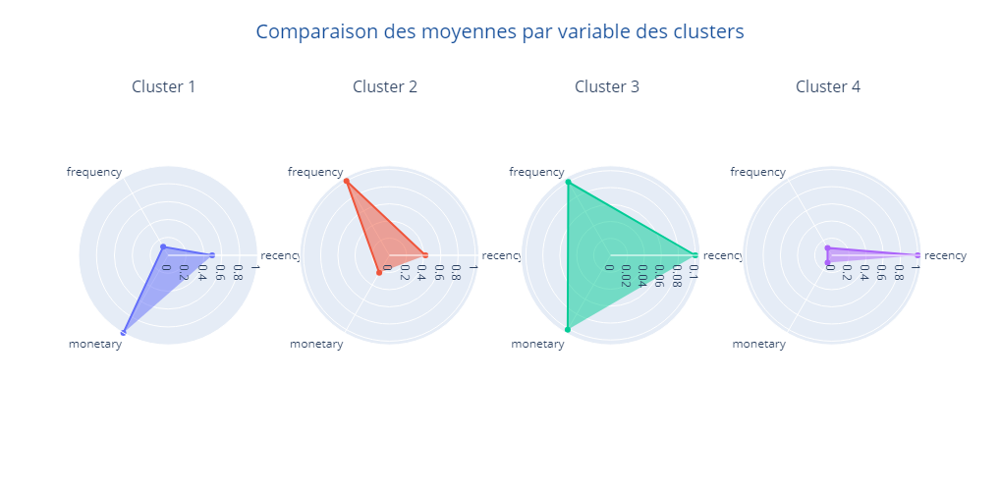

In [19]:
plot_radars(X_data=X_scaled.iloc[:,:-1], 
            model=KMeans(KBest, random_state=random_state), 
            cols = 4) # X_scaled_clusters , graphName='RFM_radars_go.png'

In [23]:
# Libraries
import matplotlib.pyplot as plt
import pandas as pd
from math import pi
def make_spider(df, row, cluster_var, subtitle, color, layout):
 
    # number of variable
    categories=list(df)[1:]
    N = len(categories)

    # What will be the angle of each axis in the plot? (we divide the plot / number of variable)
    angles = [n / float(N) * 2 * pi for n in range(N)]
    angles += angles[:1]

    # Initialise the spider plot
    ax = plt.subplot(*layout,row+1, polar=True)

    # If you want the first axis to be on top:
    ax.set_theta_offset(pi / 2)
    ax.set_theta_direction(-1)

    # Draw one axe per variable + add labels labels yet
    plt.xticks(angles[:-1], categories, color='black',fontfamily='serif',fontweight='light', size=8)
    #ax.set_xticks([]) # turn labels off if you want - can look quite nice

    # Draw ylabels
    ax.set_rlabel_position(0)
    plt.yticks([0,0.2,0.30,0.40,0.50,0.75,0.100], 
               ["0","0.2","0.3","0.4","0.5","0.75","1"], 
               color="grey", size=4)
    plt.ylim(0,1)


    # Ind1
    values=df.loc[row].drop(cluster_var).values.flatten().tolist()
    values += values[:1]
    ax.plot(angles, values, color=color, linewidth=2, linestyle='solid')
    ax.fill(angles, values, color=color, alpha=0.4)

    # Add a subtitle
    plt.title(subtitle, size=10, fontfamily='serif',fontweight='bold', y=1.2)
    plt.tight_layout()

def viz_radar(X_data, model,  cols=4, scaler = MinMaxScaler(feature_range=(0.2,1)), dpi=96,
              zoom=4, title=None, graphName=None):
    my_dpi=96
    model.fit(X_data)
    labels = model.labels_
    X_clusters=X_data.assign(clusters=labels)
    X_clusters = X_clusters.groupby('clusters', as_index=False).mean()
    # my_palette = plt.cm.get_cmap("crest", len(X_clusters.index))

    unique, counts = np.unique(labels, return_counts=True)
    my_palette=sns.color_palette("muted", len(unique))
    
    num_subplots=len(unique)
    rows = int(np.ceil(num_subplots / cols))
    fig=plt.figure(figsize=((1100/(zoom*my_dpi))*cols, (1000/(zoom*my_dpi))*rows), dpi=dpi)
    layout=(rows, cols)
    data1=X_clusters[['clusters']]
    data2=X_clusters.drop('clusters', axis=1)

    group2=list(data2.columns)
    data2 = pd.DataFrame(scaler.fit_transform(data2),
                        columns=data2.columns)
    data=pd.concat([data1, data2], axis=1)

    # Loop to plot
    for row in range(0, len(data.index)):
        make_spider(data, row, 'clusters', 
                    subtitle='Cluster: '+str(X_clusters['clusters'][row]+1), 
                    color=my_palette[row], layout=layout) # '#244747'
    if title:
        fig.text(0.5, 1.1, title, ha="center", fontdict=font_title2)
    if graphName:
        fig.savefig(imgPath + graphName, bbox_inches='tight')
    # fig.subplots_adjust(top=0.88)
    # fig.tight_layout()
    fig.show()
 

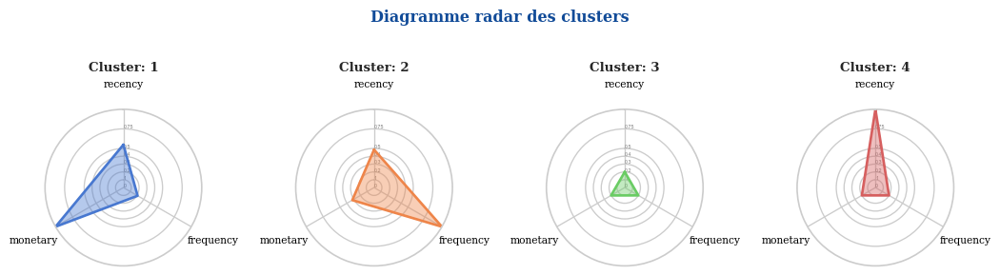

In [24]:
viz_radar(X_data=X_scaled.iloc[:,:-1], 
          model=KMeans(KBest, random_state=random_state), dpi=96, zoom=4,
          title='Diagramme radar des clusters',
          graphName='RFM_radar_plot.png')

#### <font color="#337da4" id="2.2"> 2.2. Réduction dimensionnelle-PCA </font>
----------------------------

Pour cette réduction du nombre de dimensions, nous allons réaliser une ***Analyse en Composantes Principale (PCA)***, l'une des méthodes d'analyse de données multivariées les plus utilisées. Elle permet d'explorer des jeux de données multidimensionnels constitués de variables quantitatives.

Pour cela, nous utiliserons la méthode PCA du module decomposition ***Sklearn*** sur les variables numériques centrées et réduite.

------------------------------------

##### Variance expliquée par axe :

[37.48 33.28 29.24]


------------------------------------

##### Variance expliquée cumulée :

[ 37.48  70.76 100.  ]


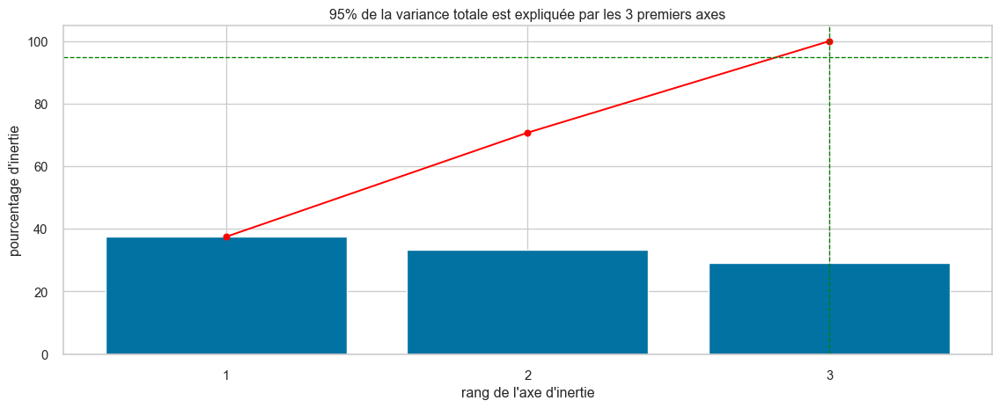

In [25]:
X_projected, limit, min_plans=pca_eboulis(X, preprocessor, limit = 95)

In [26]:
def pca_reduced(X, preprocessor, min_plans): 
    #Instanciation pca
    pca = Pipeline([("preprocessor", preprocessor),
                    ("pca", PCA(n_components = min_plans, svd_solver='full'))])
    
    # Dimension
    X_principal = pca.fit_transform(X) 
    X_principal = pd.DataFrame(X_principal) 
    X_principal.columns = ['P'+str(i) for i in range(1,min_plans+1)] 

    return X_principal

X_principal=pca_reduced(X, preprocessor, min_plans)
X_principal.head(3)

,P1,P2,P3
0,-0.05,-0.84,-0.13
1,-0.41,-0.91,0.22
2,-0.65,1.85,0.32


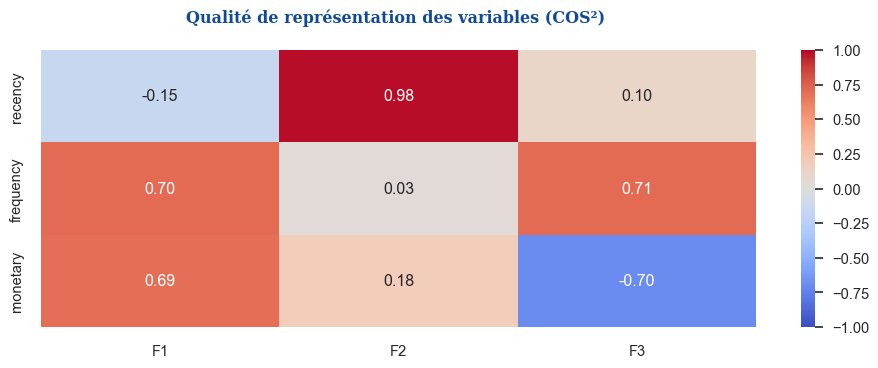

In [27]:

def GraphCorrelation(X,min_plans, preprocessor, figsize=(12, 5)):
    # Instanciation pca
    pca = Pipeline([("preprocessor", preprocessor),
                    ("pca", PCA(n_components = min_plans, svd_solver='full'))])
    pca.fit(X)
    scree = (pca.named_steps['pca'].explained_variance_ratio_*100).round(2)
    # Espace des composantes principales
    pcs = pd.DataFrame(data=pca.named_steps['pca'].components_, 
                       index=['F'+str(i+1)  for i in np.arange(len(scree))], 
                       columns=X.columns)

    fig, ax = plt.subplots(figsize=figsize)
    sns.heatmap(pcs.T, vmin=-1, vmax=1, annot=True, cmap="coolwarm", fmt="0.2f")
    plt.title("Qualité de représentation des variables (COS²) \n", fontdict=font_title2)
    
GraphCorrelation(X,min_plans, preprocessor,figsize=(10, 4))

### Cercle de corrélation

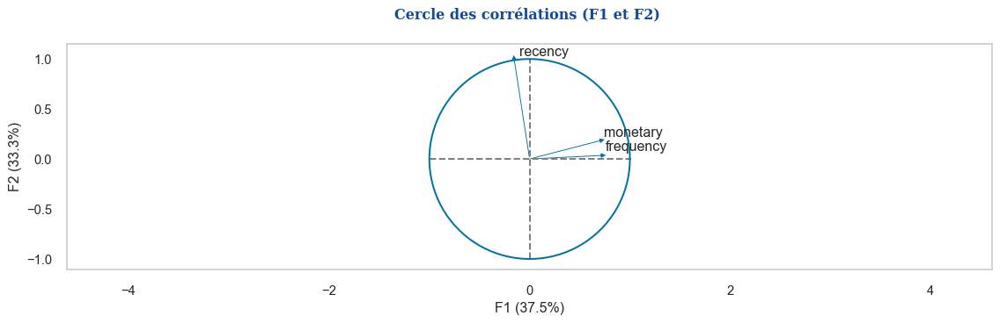

In [28]:
correlation_graph(X, min_plans, preprocessor, (0,1), figsize=(12, 4))

------
**L'axe 1 :** correspond à la recence. il oppose les clients les clients ayant fait un achat recemment à ceux dont la dernière date d'achat remonte dans le temps. Ce seul axe fournit 98% de l'information. 

**L'axe 2 :** oppose les clients High value à ceux qui depensent moins.


#### <font color="#337da4" id="2.3"> 2.3. Clustering après réduction </font>
----------------------------

In [29]:
def elbowmetrics2(X, preprocessor, metrics: list = None, k_list=(2, 11),
                 cols=2, figsize=(12, 5), graphname='elbow_metrics.png'):
    # --- Figures Settings ---
    color_palette=['#FFCC00', '#54318C']
    set_palette(color_palette)
    title=dict(fontsize=12, fontweight='bold', style='italic', fontfamily='serif')
    text_style=dict(fontweight='bold', fontfamily='serif')
    
    if metrics:
        metrics_list = metrics
    else:
        metrics_list = ['distortion']

    nplot =  2*len(metrics_list)
    rows = len(metrics_list)  # nplot // cols + 1

    fig, axs = plt.subplots(rows, cols, figsize=figsize, sharex=False, sharey=False)
    axs = trim_axs(axs, nplot)
    plt.title('Nombre optimal de clusters', fontsize=14, **text_style)
    for i, m in enumerate(metrics_list):
        kmeans_visualizer = Pipeline([
            ("preprocessor", preprocessor),
            ("kelbowvisualizer", KElbowVisualizer(KMeans(random_state=random_state),
                                                  K=k_list, metric=m, n_jobs=-1,
                                                  ax=axs[2 * i]))])
        kmeans_visualizer.fit(X)
        kmeans_visualizer.named_steps['kelbowvisualizer'].finalize()

        # Meilleur valeur du K
        K = kmeans_visualizer.named_steps['kelbowvisualizer'].elbow_value_
        # Silhouette Visualizer
        silhouette_visualizer = Pipeline([
            ("preprocessor", preprocessor),
            ("silhouettevisualizer", SilhouetteVisualizer(KMeans(n_clusters=K, random_state=random_state),
                                                          ax=axs[2 * i + 1]))])
        silhouette_visualizer.fit(X)
        silhouette_visualizer.named_steps['silhouettevisualizer'].show(bbox_inches='tight', dpi=400)


        kmeans_visualizer.named_steps['kelbowvisualizer'].ax.set_title(m+' Score \n', **title)
        kmeans_visualizer.named_steps['kelbowvisualizer'].ax.tick_params(labelsize=7)
        for text in kmeans_visualizer.named_steps['kelbowvisualizer'].ax.legend_.texts:
            text.set_fontsize(9)
        for spine in kmeans_visualizer.named_steps['kelbowvisualizer'].ax.spines.values():
            spine.set_color('None')
        kmeans_visualizer.named_steps['kelbowvisualizer'].ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), borderpad=2, frameon=False, fontsize=8)
        kmeans_visualizer.named_steps['kelbowvisualizer'].ax.grid(axis='y', alpha=0.5, color='#9B9A9C', linestyle='dotted')
        kmeans_visualizer.named_steps['kelbowvisualizer'].ax.grid(axis='x', alpha=0)
        kmeans_visualizer.named_steps['kelbowvisualizer'].ax.set_xlabel('\nK Values', fontsize=9, **text_style)
        kmeans_visualizer.named_steps['kelbowvisualizer'].ax.set_ylabel(m+' Score\n', fontsize=9, **text_style)
    
    plt.suptitle('Clustering: nombre optimal de clusters (K) selon '+m, fontsize=14, **text_style)
    plt.gcf().text(0.9, 0.05, 'github.com/bouramayaya', style='italic', fontsize=7)
    plt.tight_layout()
    fig.savefig(imgPath + graphname, bbox_inches='tight', dpi=400)
    plt.show()
    return K



In [30]:
X_projected=pd.DataFrame(X_projected, X.index, X.columns)
X_projected.head(3)

,recency,frequency,monetary
0,-0.05,-0.84,-0.13
1,-0.41,-0.91,0.22
2,-0.65,1.85,0.32


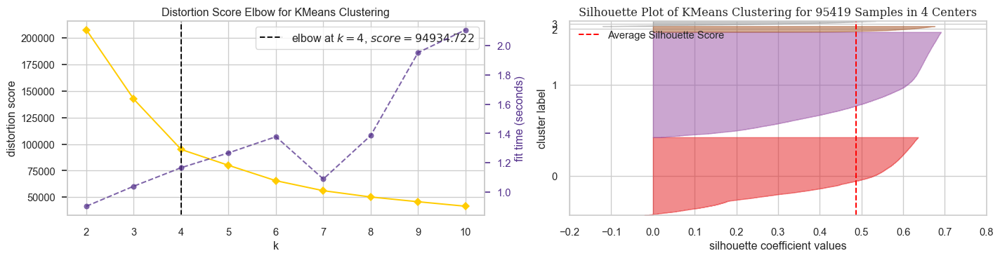

<Figure size 1152x384 with 0 Axes>

In [31]:
K_dist_reduced=elbowmetrics2(X_projected, preprocessor,  k_list=(2, 11), cols=2, figsize=(15, 4),
                        graphname='elbow_metrics_distortion_reduced.png')

In [32]:
# --- Define K-Means Functions ---
def nbclusters(X, metrics:list, k_list:list=(2, 10), figsize=(14, 5), graphName=None):

    title=dict(fontsize=12, fontweight='bold', style='italic', fontfamily='serif')
    text_style=dict(fontweight='bold', fontfamily='serif')
    layout=(1, len((metrics)))
    
    fig = plt.figure(figsize=figsize)     
    for i, m in enumerate(metrics):
        ax = fig.add_subplot(*layout,i+1)
        kmeans_visualizer = Pipeline([
            ("preprocessor", preprocessor),
            ("kelbowvisualizer", KElbowVisualizer(KMeans(random_state=random_state),
                                                  K=k_list, metric=m, n_jobs=-1,
                                                  ax=ax))])
        kmeans_visualizer.fit(X)
        kmeans_visualizer.named_steps['kelbowvisualizer'].finalize()

        kmeans_visualizer.named_steps['kelbowvisualizer'].ax.set_title(m+' Score Elbow\n', **title)
        kmeans_visualizer.named_steps['kelbowvisualizer'].ax.tick_params(labelsize=7)
        for text in kmeans_visualizer.named_steps['kelbowvisualizer'].ax.legend_.texts:
            text.set_fontsize(9)
        for spine in kmeans_visualizer.named_steps['kelbowvisualizer'].ax.spines.values():
            spine.set_color('None')
        kmeans_visualizer.named_steps['kelbowvisualizer'].ax.legend(loc='upper center', borderpad=2, frameon=False, fontsize=10)
        kmeans_visualizer.named_steps['kelbowvisualizer'].ax.grid(axis='y', alpha=0.5, color='#9B9A9C', linestyle='dotted')
        kmeans_visualizer.named_steps['kelbowvisualizer'].ax.grid(axis='x', alpha=0)
        kmeans_visualizer.named_steps['kelbowvisualizer'].ax.set_xlabel('\nK Values', fontsize=9, **text_style)
        kmeans_visualizer.named_steps['kelbowvisualizer'].ax.set_ylabel(m+' Scores\n', fontsize=9, **text_style)
    
    plt.suptitle('Clustering: nombre optimal de clusters (K)', fontsize=14, **text_style)
    plt.gcf().text(0.9, 0.05, 'github.com/bouramayaya', style='italic', fontsize=7)
    if graphName:
        fig.savefig(imgPath + graphName, bbox_inches='tight')
    plt.tight_layout()
    plt.show()

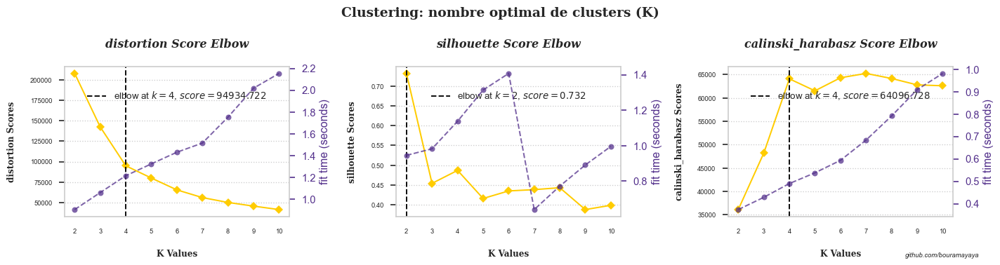

In [33]:
metrics = ['distortion', 'silhouette', 'calinski_harabasz']
nbclusters(X_projected, metrics=metrics, k_list=(4, 11), figsize=(15, 4), graphName='NBClusters_reduced.png')

*****************************************************
Le nombre optimal de clusters est de : 2
*****************************************************


2

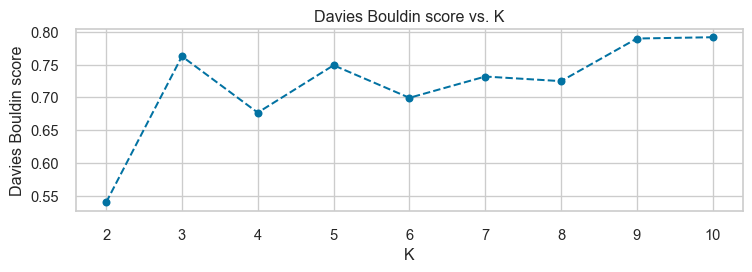

In [34]:
X_projected_scaled=preprocessor.fit_transform(X_projected)
nbclusters_Bouldin(X_projected_scaled, range(2,11))

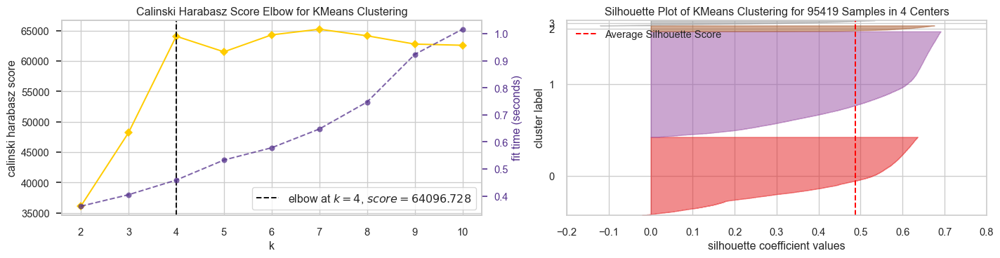

In [35]:
metrics = ["calinski_harabasz"]
K_calinski_reduced=elbowmetrics(X_projected, preprocessor, metrics=metrics, k_list=(4, 11), cols=2, figsize=(15, 4),
                        graphname='elbow_metrics_calinski_reduced.png')

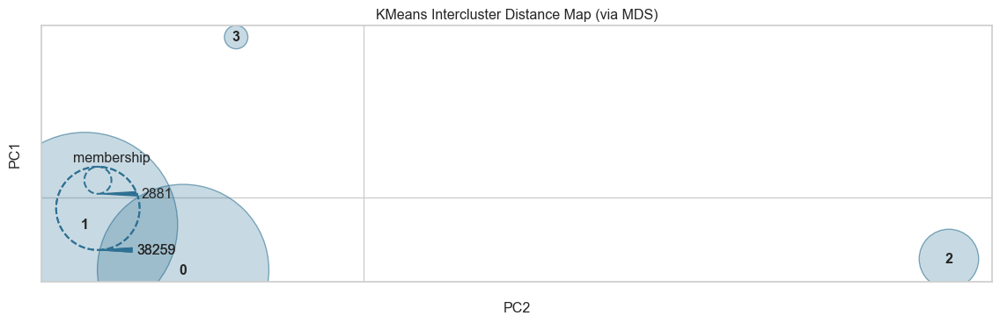

In [36]:
distanceInterCluster(X_projected, preprocessor, 4, graphname='distanceCluster_reduced.png')

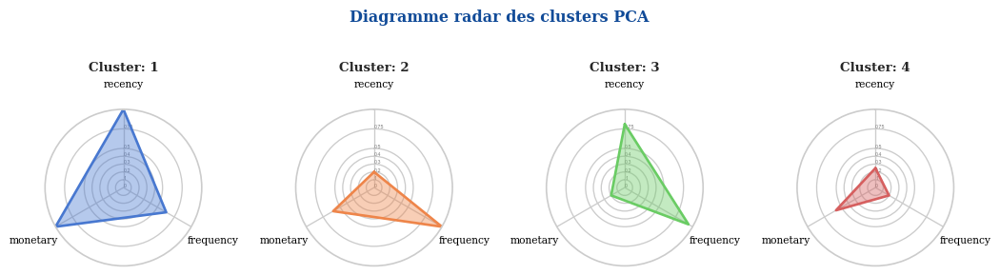

In [37]:
X_scaled_pca = preprocessor.fit_transform(X_projected)
X_scaled_pca = pd.DataFrame(X_scaled_pca, index=X.index, columns=X.columns)

kmeans_model_pca = Pipeline([("preprocessor", preprocessor),
                             ("kmeans", KMeans(4, random_state=random_state))])
kmeans_model_pca.fit(X_projected)
kmeans_labels_pca = kmeans_model_pca.named_steps['kmeans'].labels_

X_scaled_pca["kmeans_label"] = kmeans_labels_pca
X_scaled_clusters_pca = X_scaled_pca.groupby("kmeans_label", as_index=False).mean()
X_scaled_clusters_pca

viz_radar(X_data=X_scaled_clusters_pca.iloc[:,1:],
          model=KMeans(KBest, random_state=random_state), dpi=96,
          title='Diagramme radar des clusters PCA',
          graphName='RFM_radar_plot_pca.png')


-------------

***Après reduction***, nous obtenons toujours le même **nombre optimal de cluster, qui est de 4**.     
Cependant, le graphique radar devient beaucoup plus lisible plus facile et permet une meilleure description des clusters. 

- **Cluster 1**: nos champions;
- **Cluster 2**: les anciens champions, très frequents, en abandon;
- **Cluster 3**: Nouveaux clients-low value;
- **Cluster 4**: les anciens champions, pas frequents, en abandon.

### <font color="#337da4" id="3"> 3. Segmentation des clients Olist (RFM étendue) </font>
----------------------------

In [14]:
df_olist=pd.read_csv('df_olist_final.csv')
df_olist.head()

df_olist=df_olist.drop_duplicates()
df_olist.shape[0]==df_olist.drop_duplicates(subset=['customer_unique_id']).shape[0]

X=df_olist[['recency', 'frequency', 'monetary', 'poids_freight', 'delivery_delay_mean',
'payment_installments_mean','mean_review_score']]

----
Nous disposons d'une multitude de variables dans la base Olist. 
Pour l'implementation de notre segmentation, nous allons selectionner les meilleures variables possibles pour notre analyse. 

#### <font color="#337da4" id="3.1"> 3.1. Selection de variables pertinentes</font>
----------------------------

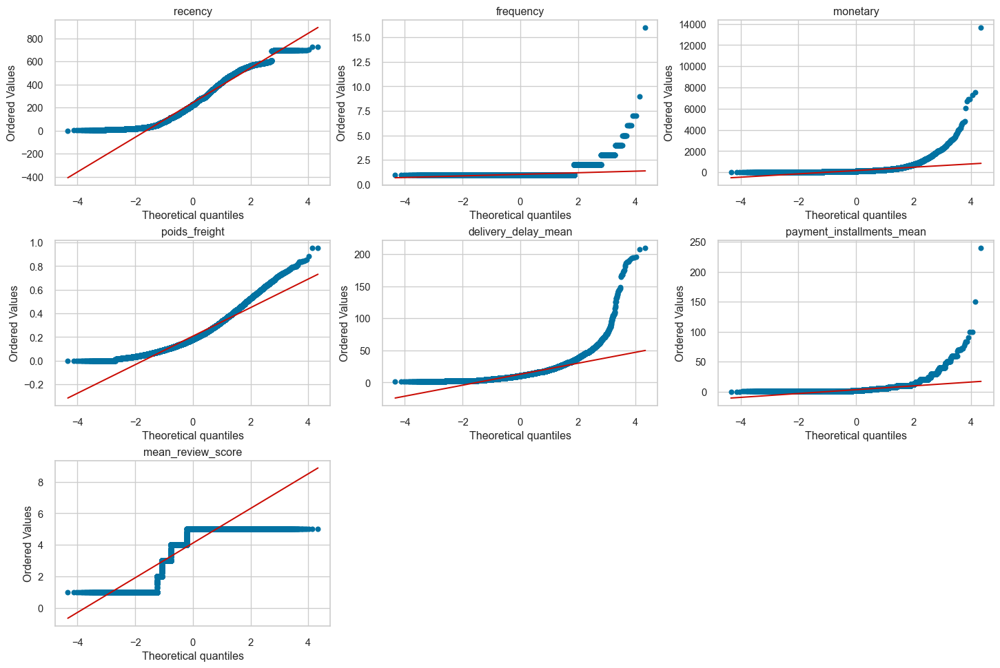

,Statistic,p-value
recency,0.96,0.00
frequency,0.15,0.00
monetary,0.48,0.00
poids_freight,0.93,0.00
delivery_delay_mean,0.77,0.00
payment_installments_mean,0.56,0.00
mean_review_score,0.69,0.00


In [15]:
from scipy.stats import boxcox, probplot, norm, shapiro
shapiro_test = {}
layout=(15,3)

plt.figure(figsize=(15, 40),constrained_layout=True)
for i,var in enumerate(X.columns):
    ax = plt.subplot(*layout,i+1)
    probplot(x = df_olist[var], dist=norm, plot=ax)
    plt.title(var)
    shapiro_test[var] = shapiro(X[var])
# fig.subplots_adjust(top=0.88)
# fig.tight_layout()    
plt.show()

pd.DataFrame(shapiro_test, index=['Statistic', 'p-value']).transpose()

# #All the variable are statistically non normally distributed.Let's try BoxCox transformation
# shapiro_test = {}
# lambdas = {}
# j=2
# plt.figure(figsize=(20, 10))
# for i in range(6):
#     ax = plt.subplot(2,3,i+1)
#     x, lbd = boxcox(df[df.columns[j]])
#     probplot(x = x, dist=norm, plot=ax)
#     plt.title(df.columns[j])
#     shapiro_test[df.columns[j]] = shapiro(x)
#     lambdas[df.columns[j]] = lbd
#     j+=1
    
# plt.show()

# pd.DataFrame(shapiro_test, index=['Statistic', 'p-value']).transpose()

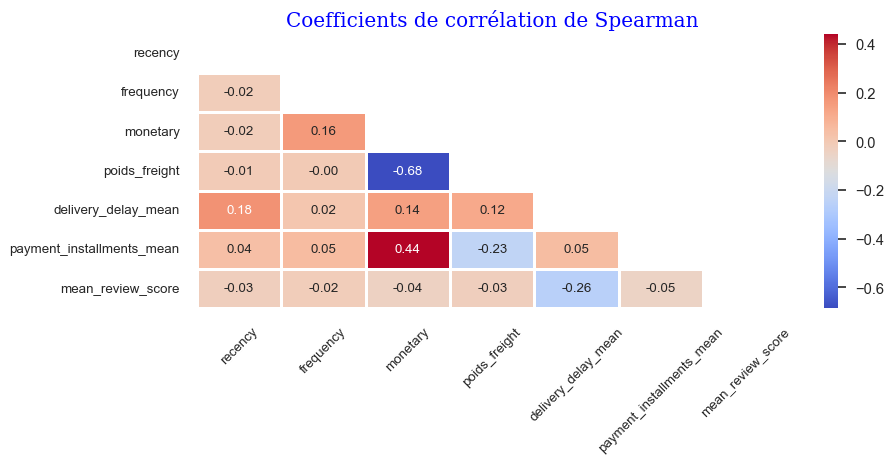

In [16]:
# ---------------------------------------------------------------------------
#  Matrice de corrélation linéaire: , cmap='Spectral'
# ---------------------------------------------------------------------------

def matriceCorrelation(data, graphName='correlation.png', figsize=(12, 8),cmap='coolwarm'):
    upp_mat = np.triu(data.corr(method='spearman', numeric_only=True))
    plt.figure(figsize=figsize)
    ax = sns.heatmap(data.corr(method='spearman', numeric_only=True), annot=True, fmt=".2f",
                     cmap=cmap, annot_kws={'size': 10}, linewidth=1, 
                     mask=upp_mat)  # cmap = 'coolwarm',cmap = 'Wistia'
    plt.xticks(rotation=45, fontsize=10)
    plt.yticks(rotation=0, fontsize=10)
    plt.title("Coefficients de corrélation de Spearman", fontdict=font1)
    ax.grid(False)
    plt.savefig(imgPath + graphName, bbox_inches='tight', dpi=96)
    plt.show()
    
matriceCorrelation(X, graphName='correlation_Olist.png', figsize=(10, 5))


--------
Certaines variables sont fortement correlées entre elles.  Nous allons supprimer une variables de chaque paire. 
C'est le cas de la variable **``poids_freight``**, qui est fortement correlée avec **`monetary`**.

In [17]:
X.drop('poids_freight', axis=1, inplace=True)


#### <font color="#337da4" id="3.2"> 3.2. Clustering</font>
----------------------------


##### <font color="#337da4" id="3.2.1"> 3.2.1. Preprocessing</font>
----------------------------

In [18]:
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder,PolynomialFeatures
from sklearn.compose import make_column_selector as selector
from sklearn.compose import ColumnTransformer

def prepro(X):
    numeric_features=X.columns
    numeric_transformer = Pipeline(steps=[('imputer', SimpleImputer(strategy='median')),
                                          ('scaler', StandardScaler())])

    preprocessor = ColumnTransformer(transformers=[('num', numeric_transformer, numeric_features)])

    preprocessor = Pipeline(steps=[
        ('preprocessor', preprocessor)
    ])

    X_scaled= pd.DataFrame(data=preprocessor.fit_transform(X), 
                           index=X.index, columns=X.columns)
    return preprocessor, X_scaled


preprocessor, X_scaled=prepro(X)
preprocessor

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  Index(['recency', 'frequency', 'monetary', 'delivery_delay_mean', 'payment_installments_mean',
       'mean_review_score'],
      dtype='object'))]))])

In [19]:
pipe1 = Pipeline([
        ('preprocessor', preprocessor), 
        ('pca', PCA(n_components=2,  random_state=random_state))
    ])

X_pca = pd.DataFrame(pipe1.fit_transform(X))
pipe1.named_steps['pca'].explained_variance_ratio_

array([0.24441337, 0.21048423])

##### <font color="#337da4" id="3.2.2"> 3.2.2. Projection des données </font>
----------------------

<h4>t-Distributed Stochastic Neighbor Embedding (t-SNE)</h4>

t-Distributed Stochastic Neighbor Embedding (t-SNE) est un algorithme de réduction de dimensionnalité non linéaire populaire, développé par **Laurens van der Maaten** et **Geoggrey Hinton**. Il s’agit d’un algorithme d’apprentissage automatique pour la visualisation qui présente l’intégration de données de grande dimension dans un espace de faible dimension à deux ou trois dimensions. Comme pour l’ACP l’objectif est de déterminer un espace de plus petite dimension tout en préservant les distances entre les points. Il permet de projeter des données de haute dimension sur un espace de faible dimension (généralement 2D ou 3D) tout en préservant les relations de similarité entre les échantillons.

Le principe de fonctionnement de T-SNE est basé sur deux étapes principales :

- Construction de matrices de similarité : Tout d'abord, T-SNE calcule une mesure de similarité entre chaque paire d'échantillons de données d'entrée. Cette mesure de similarité est généralement basée sur la distance euclidienne ou une autre mesure de distance adaptée au type de données. Le résultat est une matrice de similarité qui capture les relations de proximité entre les échantillons.

- Projection dans l'espace de faible dimension : Ensuite, T-SNE construit un espace de faible dimension dans lequel les échantillons seront projetés. Il commence par attribuer à chaque échantillon une position aléatoire dans cet espace. Puis, il optimise itérativement cette projection en minimisant la divergence entre les distributions de similarité de l'espace d'origine et de l'espace de faible dimension.

**Hyperparamètres t-SNE** :

> - ***n_components*** : le nombre de dimensions dans l'espace de projection réduit. Par défaut, il est généralement défini à 2 pour une visualisation en 2D.

> - ***perplexity*** : la perplexité est un paramètre crucial pour le t-SNE. Elle contrôle le nombre de voisins utilisés pour construire la structure de voisinage. Une perplexité élevée donne généralement des regroupements plus larges dans la visualisation. La valeur par défaut est 30, mais vous pouvez ajuster ce paramètre en fonction de vos données.

> - ***n_iter*** : le nombre d'itérations de l'algorithme. Par défaut, il est défini à 1000. Plus le nombre d'itérations est élevé, plus l'algorithme aura de chances de trouver une représentation appropriée, mais cela augmentera également le temps d'exécution.

> - ***learning_rate*** : le taux d'apprentissage du t-SNE. Il détermine l'importance des gradients lors de chaque itération. La valeur par défaut est 200, mais vous pouvez essayer différentes valeurs pour obtenir une meilleure visualisation.

> - ***random_state*** : une graine (seed) pour initialiser la génération de nombres aléatoires. Cela garantit la reproductibilité des résultats.


<h4>UMAP (Uniform Manifold Approximation and Projection)</h4>

UMAP (Uniform Manifold Approximation and Projection) est un algorithme de réduction de dimensionnalité non linéaire très efficace, qui est utilisé pour visualiser et explorer des données à haute dimension. Il est basé sur une combinaison de méthodes d'apprentissage automatique et de géométrie différentielle. UMAP est conçu pour préserver les relations de proximité entre les points lors de la réduction de dimensionnalité.

La principale différence entre t-SNE et UMAP vient de leur définition de cette notion de similarité. UMAP définit une affinité de façon locale autour de chaque point, avec une perplexité dépendant de la densité du voisinage.

Actuellement, la méthode **UMAP** (Uniform Manifold Approximation and Projection) n’est pas intégrée dans `scikit-learn`. Pour l’utiliser il est nécessaire d’installer la librairie `umap-learn` (voir doc https://umap-learn.readthedocs.io). La commande d’installation avec *pip*  est `pip install umap-learn`.

**Hyperparamètres UMAP** :
> - ***n_components*** : le nombre de coordonnées après réduction de dimension, 2 par défaut (UMAP(n_components = 3) par exemple)
> - ***random_state = 4*** : pour initialiser le générateur random pour avoir toujours les mêmes résultats.
> - ***n_neighbors = 15*** : le nombre de voisins à considérer, par défaut 15. Plus il est élevé, plus UMAP sortira une vision globale au détriment du local, et plus il est petit, plus c'est la vision locale qui sera avantagé.
> - ***min_dist = 0.1***: distance minimum entre 2 points, par défaut 0.1. Peut prendre des valeurs entre 0 et 1, et plus la valeur est grande moins les points peuvent être collés ensemble.
> - ***metric = 'euclidean'***: distance utilisée, par défaut euclidean. Peut aussi être manhattan, cosine, correlation, ... (beaucoup de choix).

In [22]:
import matplotlib.cm as cm


def projection_cluster(X, layout=(1, 3), nb_clusters=None, graphname=None):
    text_style = dict(fontweight='bold', fontfamily='serif')
    ann = dict(textcoords='offset points', va='center', ha='center', fontfamily='serif', style='italic')
    title = dict(color='#114b98', fontsize=15, fontweight='bold', style='italic', fontfamily='serif')
    bbox = dict(boxstyle='round', pad=0.3, color='#FFDA47', alpha=0.6)
    ncols = layout[1]
    nrows = layout[0]
    fig, ax = plt.subplots(*layout, figsize=(5 * ncols, 4 * nrows))

    if nb_clusters:
        colors = AllColors[:nb_clusters]
        color_palette = AllColors[:nb_clusters]  # ['#472165', '#FFBB00', '#3C096C', '#9D4EDD', '#FFE270']
        set_palette(color_palette)

        model_pca = KMeans(n_clusters=nb_clusters, random_state=random_state)
        model_pca.fit(X_pca)

        model_tsne = KMeans(n_clusters=nb_clusters, random_state=random_state)
        model_tsne.fit(X_tsne)

        model_umap = KMeans(n_clusters=nb_clusters, random_state=random_state)
        model_umap.fit(X_umap)

        # colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
        sns.scatterplot(x=X_pca.iloc[:, 0], y=X_pca.iloc[:, 1], data=X, legend="full",
                        s=75, lw=0, alpha=1, c=model_pca.labels_, edgecolor='k', ax=ax[0])
        ax[0].set_title(r"Projection des clusters-PCA",
                        **title)

        sns.scatterplot(x=X_tsne.iloc[:, 0], y=X_tsne.iloc[:, 1], data=X, legend="full",
                        s=75, lw=0, alpha=1, c=model_tsne.labels_, edgecolor='k', ax=ax[1])
        ax[1].set_title(r"Projection des clusters-TSNE", **title)

        sns.scatterplot(x=X_umap.iloc[:, 0], y=X_umap.iloc[:, 1], data=X, legend="full",
                        s=75, lw=0, alpha=1, c=model_umap.labels_, edgecolor='k', ax=ax[2])
        ax[2].set_title(r"Projection des clusters-UMAP", **title)

        # sns.scatterplot(x=X_isomap.iloc[:,0], y=X_isomap.iloc[:,1], data=X, legend="full",
        #                 s=75, lw=0, alpha=1, c=colors, edgecolor='k', ax=ax[2])
        # ax[2].set_title("Projection-ISOMAP", **title)

    else:
        colors = ['#D72C16']
        sns.scatterplot(x=X_pca.iloc[:, 0], y=X_pca.iloc[:, 1], data=X, legend="full", c=colors, ax=ax[0])
        ax[0].set_title("Projection-PCA", **title)

        sns.scatterplot(x=X_tsne.iloc[:, 0], y=X_tsne.iloc[:, 1], data=X, legend="full", c=colors, ax=ax[1])
        ax[1].set_title("Projection-TSNE", **title)

        sns.scatterplot(x=X_umap.iloc[:, 0], y=X_umap.iloc[:, 1], data=X, legend="full", c=colors, ax=ax[2])
        ax[2].set_title("Projection-UMAP", **title)

        # sns.scatterplot(x=X_isomap.iloc[:,0], y=X_isomap.iloc[:,1], data=X, legend="full",  ax=ax[2])
        # ax[2].set_title("Projection-ISOMAP", **title)
    if graphname:
        fig.savefig(imgPath + graphname, bbox_inches='tight')

In [23]:
# projection_cluster(X, layout=(1,3), nb_clusters=None, graphname='projection_olist.png')

##### <font color="#337da4" id="3.2.3"> 3.2.3. Nombre optimal de clusters</font>
-----------------------------------------------------

### Elbow Method (Inertia)
Elbow Method is used to identify $k$ when the **Inertia Dropped Significantly** as compared to inertia before.


$$ \text{Inertia} = \sum^m_{i=1}||x^{(i)}-\mu_{c^{(i)}}||^2_2 $$

- $m$ : Number of Datapoints
- $x^{(i)}$ : i-th Datapoints
- $\mu_{c^{(i)}}$ : Cluster Centroids for i-th Datapoints

> Inertia Measure the Sum of Squared Distance of each datapoints to its assigned cluster centroids.

**Remarks:**
- With $k$ increase, the inertia will decrease. This is because with more clusters being formed, each datapoints will be closer to its centroids. However, this come at the cost of interpretability of the cluster formed with high number of $k$
- The "Elbow" might not be visible if the clustering is ambiguous.

### Silhouette Analysis
Silhouette Coefficient $\in [-1,1]$ is a convenient metric to **Quantify the Distinguishability of the Cluster Formed** with 1 denote a highly packed cluster and 0 denote an overlapping cluster.

$$ \text{Silhouette Coefficient}, s(o) = \frac{b(o) - a(o)}{max(a(o), b(o))} $$
<p align='center'>
    <img src="https://2.bp.blogspot.com/-dQi4lSpbbnw/Wpr7iFzrjFI/AAAAAAAACps/qliCgVQ1gW4Jrri_UT_7d9JKI_LXd0n8wCLcBGAs/s1600/ssi-formula.png" style="background: #fff;">
</p>

- $s(o)$ : Silhouette Coefficient of datapoints $o$
- $a^{(i)}$ : Average Distance to other datapoints of the Assigned Cluster Centroids
- $b^{(i)}$ : Average Distance to Nearest Cluster Centroids


In [24]:
def clustering_eval(preprocessor, model, data, metric, elbow=True, mds=False, KBest=None):
    
    if((elbow==True) & (mds==True)):
        ncols=3
    elif((elbow==False) | (mds==False)):
        ncols=2
    else:
        ncols=1
        
    fig, axes = plt.subplots(nrows=1, ncols=ncols, sharex=False, sharey=False, figsize=(12,3))
    
    ax=0
    if(elbow==True):
        # Elbow visualizer
        kmeans_visualizer = Pipeline([
            ("preprocessor", preprocessor),
            ("kelbowvisualizer", KElbowVisualizer(model,K=(4,11), metric=metric, ax=axes[ax]))])
        kmeans_visualizer.fit(data)
        KBest = kmeans_visualizer.named_steps['kelbowvisualizer'].elbow_value_
        kmeans_visualizer.named_steps['kelbowvisualizer'].finalize()
        ax+=1
    
    # Set best K
    K = KBest
    model.set_params(n_clusters=K)

    # Silhouette Visualizer
    silhouette_visualizer = Pipeline([
        ("preprocessor", preprocessor),
        ("silhouettevisualizer", SilhouetteVisualizer(model, ax=axes[ax]))])
    silhouette_visualizer.fit(data)
    silhouette_visualizer.named_steps['silhouettevisualizer'].finalize()
    ax+=1
    
    # Intercluster distance Map with best k
    if(mds==True):
        distance_visualizer = Pipeline([
            ("preprocessor", preprocessor),
            ("distancevisualizer", InterclusterDistance(model, ax=axes[ax]))])
        distance_visualizer.fit(data)
        distance_visualizer.named_steps['distancevisualizer'].finalize()
    
    return K
    plt.show()


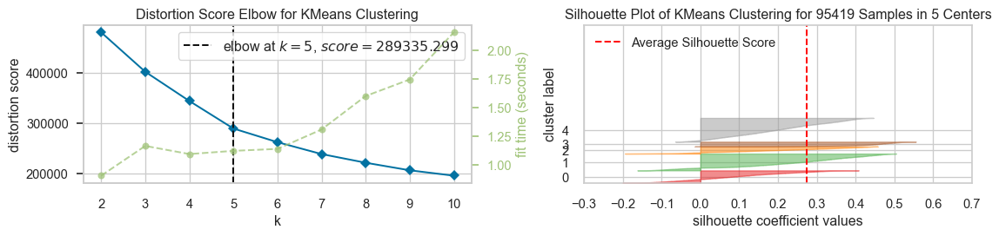

In [46]:
K = clustering_eval(preprocessor=preprocessor, 
                model=KMeans(random_state=random_state), 
                data=X, 
                metric="distortion", # ['distortion', 'silhouette', 'calinski_harabasz']
                elbow=True,
                mds=False,
                KBest=None)

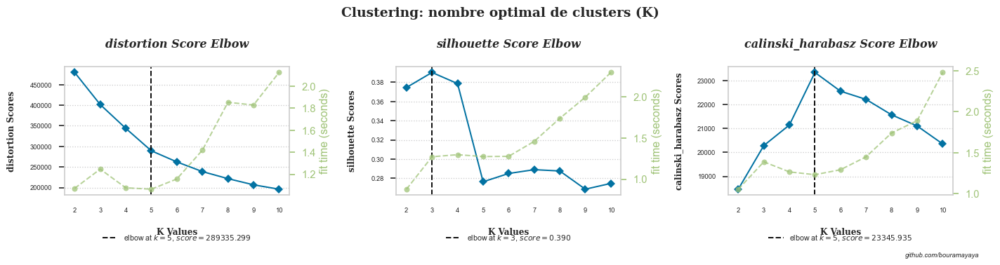

In [47]:
def nbclusters(X, metrics:list, k_list:list=(2, 10), figsize=(14, 5), graphName:str=None):
    #color_palette=['#FFCC00', '#54318C']
    #set_palette(color_palette)
    title=dict(fontsize=12, fontweight='bold', style='italic', fontfamily='serif')
    text_style=dict(fontweight='bold', fontfamily='serif')
    layout=(1, len((metrics)))

    fig = plt.figure(figsize=figsize)
    for i, m in enumerate(metrics):
        ax = fig.add_subplot(*layout,i+1)
        kmeans_visualizer = Pipeline([
            ("preprocessor", preprocessor),
            ("kelbowvisualizer", KElbowVisualizer(KMeans(random_state=random_state),
                                                  K=k_list, metric=m, n_jobs=-1,
                                                  ax=ax))])
        kmeans_visualizer.fit(X)
        kmeans_visualizer.named_steps['kelbowvisualizer'].finalize()

        kmeans_visualizer.named_steps['kelbowvisualizer'].ax.set_title(m+' Score Elbow\n', **title)
        kmeans_visualizer.named_steps['kelbowvisualizer'].ax.tick_params(labelsize=7)
        # for text in kmeans_visualizer.named_steps['kelbowvisualizer'].ax.legend_.texts: text.set_fontsize(9)
        for spine in kmeans_visualizer.named_steps['kelbowvisualizer'].ax.spines.values():
            spine.set_color('None')
        kmeans_visualizer.named_steps['kelbowvisualizer'].ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), borderpad=2, frameon=False, fontsize=8)
        kmeans_visualizer.named_steps['kelbowvisualizer'].ax.grid(axis='y', alpha=0.5, color='#9B9A9C', linestyle='dotted')
        kmeans_visualizer.named_steps['kelbowvisualizer'].ax.grid(axis='x', alpha=0)
        kmeans_visualizer.named_steps['kelbowvisualizer'].ax.set_xlabel('\nK Values', fontsize=9, **text_style)
        kmeans_visualizer.named_steps['kelbowvisualizer'].ax.set_ylabel(m+' Scores\n', fontsize=9, **text_style)

    plt.suptitle('Clustering: nombre optimal de clusters (K)', fontsize=14, **text_style)
    plt.gcf().text(0.9, 0.05, 'github.com/bouramayaya', style='italic', fontsize=7)
    plt.tight_layout()
    if graphName:
        fig.savefig(imgPath + graphName, bbox_inches='tight')
    plt.show()

metrics = ['distortion','silhouette','calinski_harabasz']
nbclusters(X, metrics=metrics, k_list=(4, 11), figsize=(15, 4), graphName='NBClusters_Olist.png')

In [48]:
metrics = ['distortion', 'silhouette', 'calinski_harabasz']

def elbowmetrics(X, preprocessor, metrics: list = None, k_list=(4, 11),
                 cols=2, figsize=(12, 5), graphname='elbow_metrics.png'):
    if metrics:
        metrics_list = metrics
    else:
        metrics_list = ['distortion']

    nplot = 2 * len(metrics_list)
    rows = len(metrics_list)  # nplot // cols + 1

    fig, axs = plt.subplots(rows, cols, figsize=figsize, sharex=False, sharey=False)
    axs = trim_axs(axs, nplot)

    for i, m in enumerate(metrics_list):
        kmeans_visualizer = Pipeline([
            ("preprocessor", preprocessor),
            ("kelbowvisualizer", KElbowVisualizer(KMeans(random_state=random_state),
                                                  K=k_list, metric=m, n_jobs=-1,
                                                  ax=axs[2 * i]))])
        kmeans_visualizer.fit(X)
        kmeans_visualizer.named_steps['kelbowvisualizer'].finalize()

        # Meilleur valeur du K
        K = kmeans_visualizer.named_steps['kelbowvisualizer'].elbow_value_
        # Silhouette Visualizer
        silhouette_visualizer = Pipeline([
            ("preprocessor", preprocessor),
            ("silhouettevisualizer", SilhouetteVisualizer(KMeans(n_clusters=K, random_state=random_state),
                                                          ax=axs[2 * i + 1]))])
        silhouette_visualizer.fit(X)
        silhouette_visualizer.named_steps['silhouettevisualizer'].show(bbox_inches='tight', dpi=96)
    fig.text(0.198, .99, 'Clustering: Silhouette scores',
             fontsize=15, fontweight='bold', fontfamily='serif')
    fig.savefig(imgPath + graphname, bbox_inches='tight', dpi=96)
    plt.show()
    return K

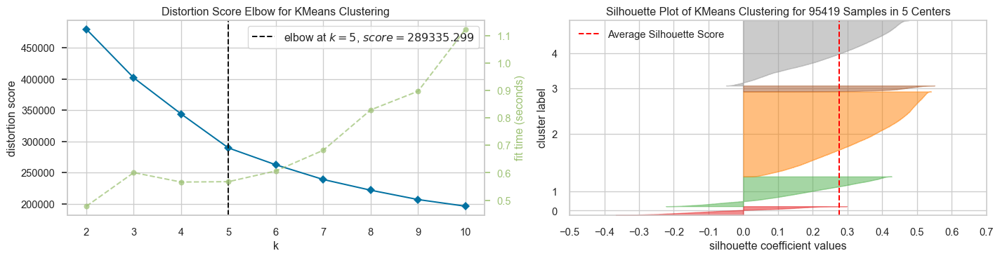

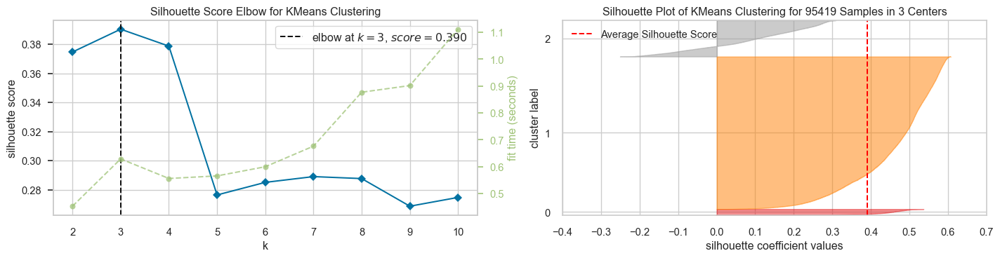

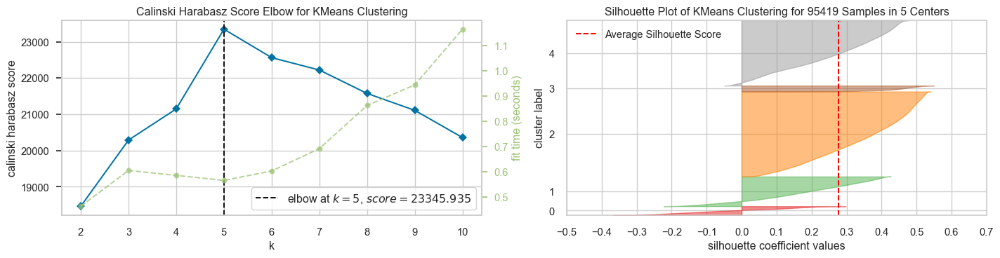

In [26]:
for m in metrics:
    elbowmetrics(X, preprocessor, metrics=[m], k_list=(4, 11),
                 cols=2, figsize=(15, 4), graphname='elbow_metrics_'+m+'.png')

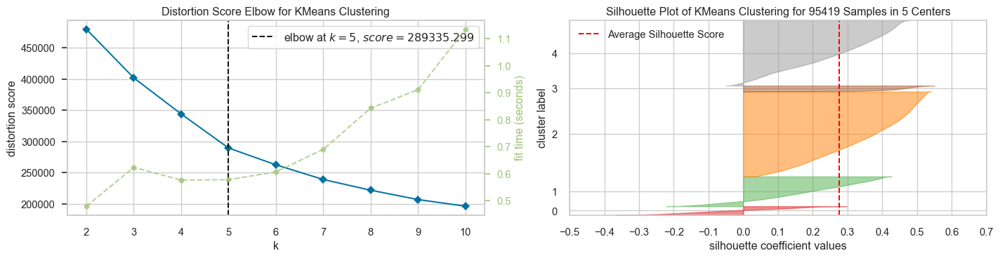

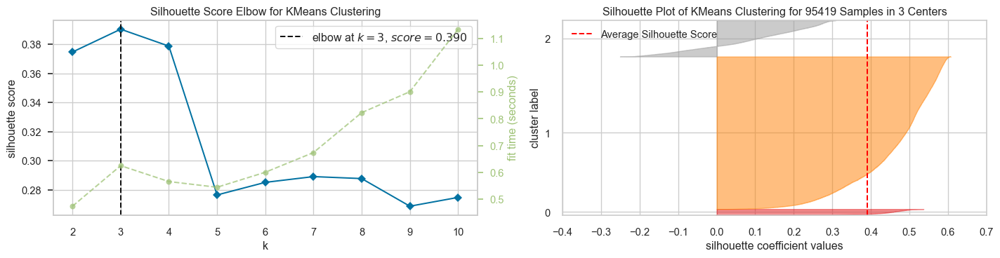

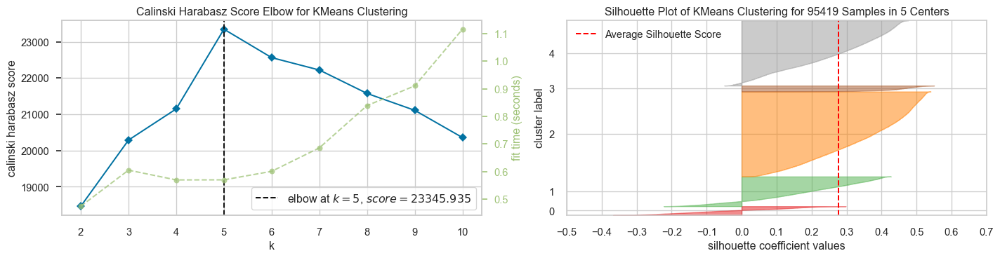

In [27]:
for m in metrics:
    elbowmetrics(X, preprocessor, metrics=[m], k_list=(4, 11),
                 cols=2, figsize=(15, 4), graphname='elbow_metrics_'+m+'.png')

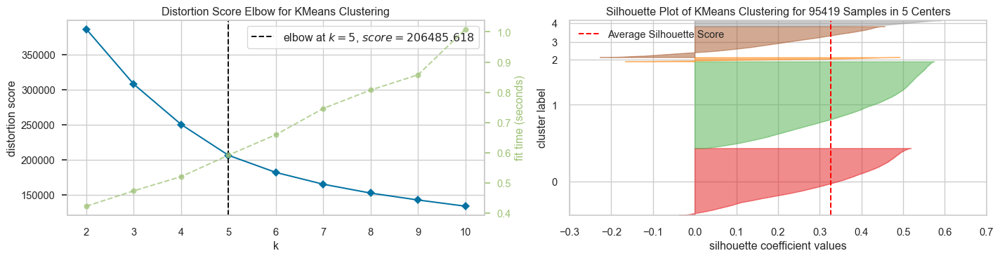

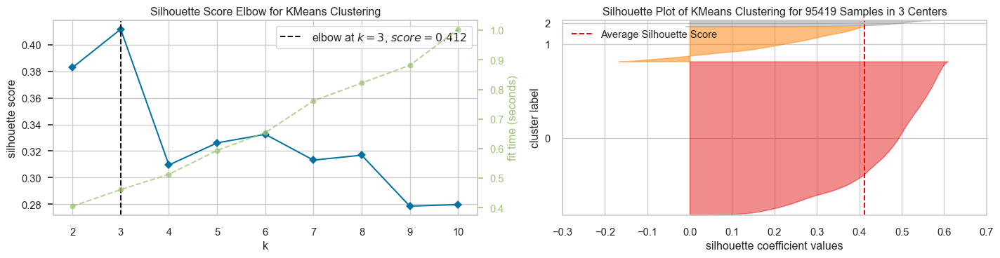

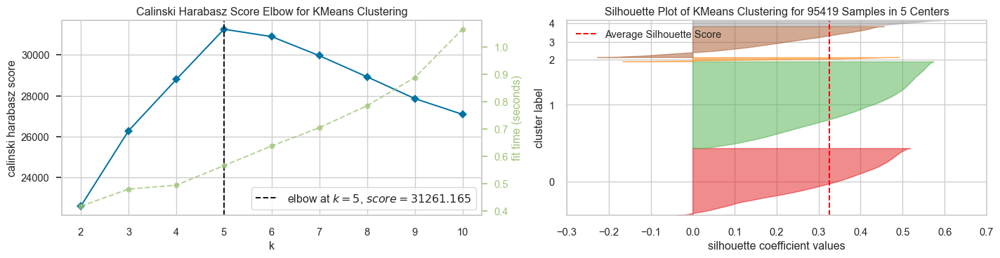

In [28]:
X5=X.drop(columns='payment_installments_mean')
preprocessor5,X_scaled5=prepro(X5)
for m in metrics:
    elbowmetrics(X5, preprocessor5, metrics=[m], k_list=(4, 11),
                 cols=2, figsize=(15, 4), graphname='elbow_metrics_'+m+'.png')

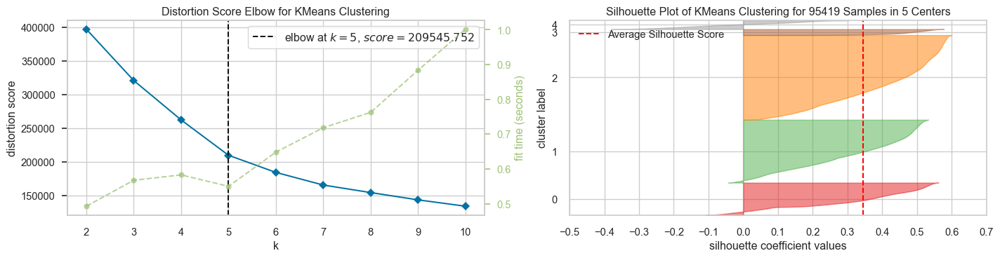

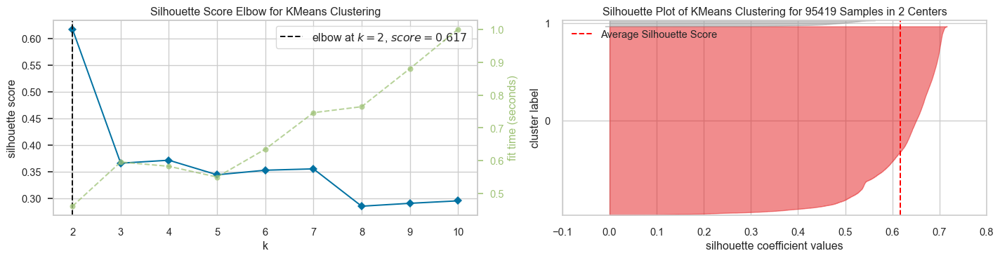

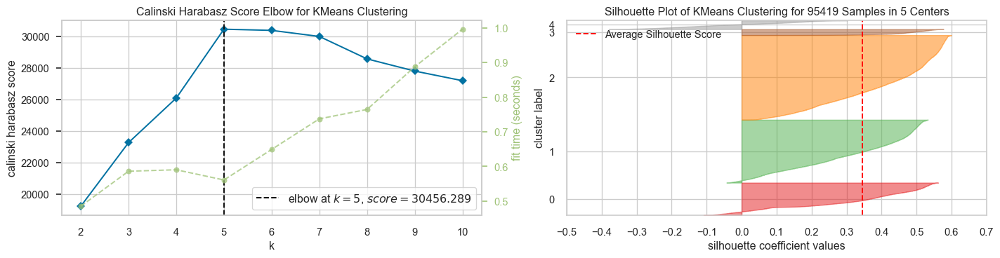

In [29]:
X5b=X.drop(columns='delivery_delay_mean')
preprocessor5b, X_scaled4=prepro(X5b)
for m in metrics:
    elbowmetrics(X5b, preprocessor5b, metrics=[m], k_list=(4, 11),
                 cols=2, figsize=(15, 4), graphname='elbow_metrics_'+m+'.png')

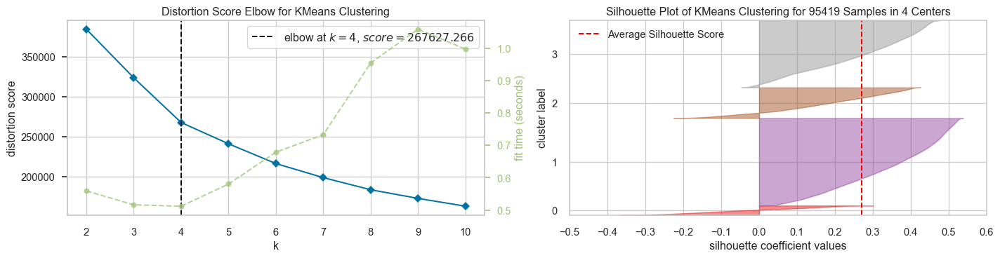

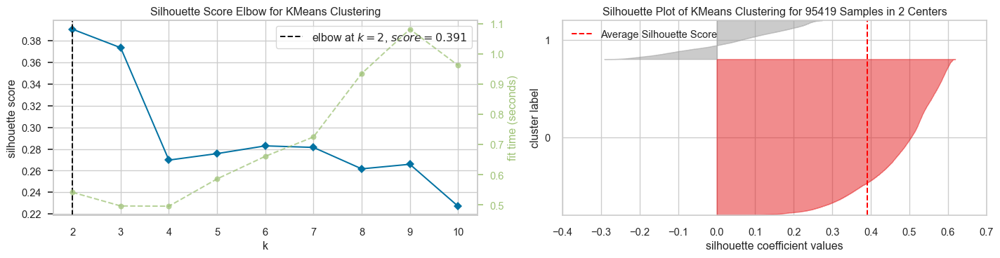

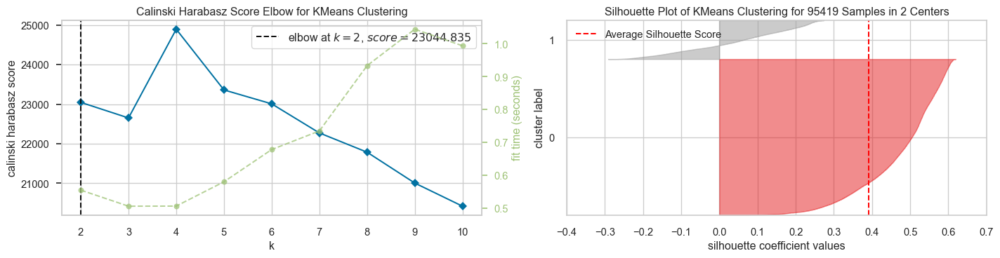

In [30]:
X5c=X.drop(columns='frequency')
preprocessor5c, X_scaled5c=prepro(X5c)
for m in metrics:
    elbowmetrics(X5c, preprocessor5c, metrics=[m], k_list=(4, 11),
                 cols=2, figsize=(15, 4), graphname='elbow_metrics_'+m+'.png')

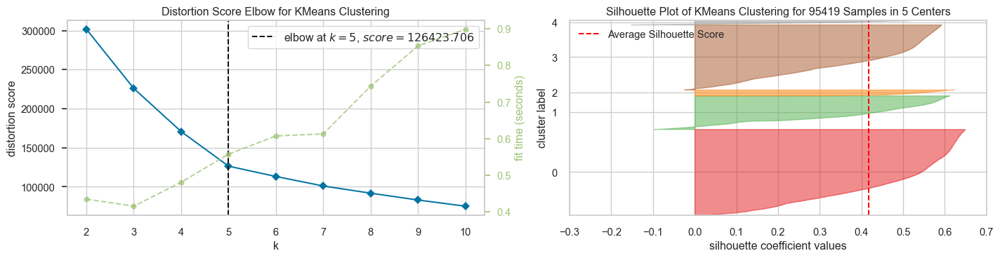

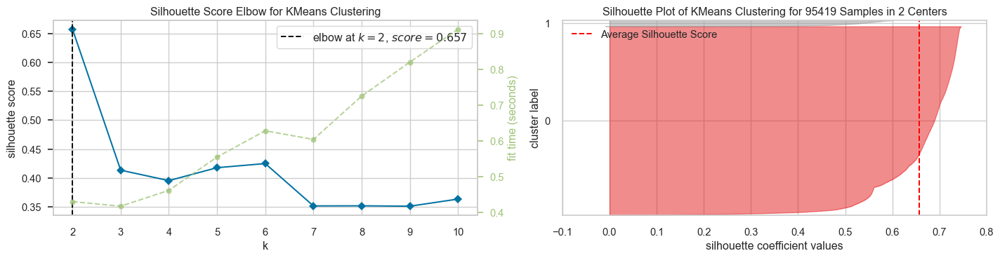

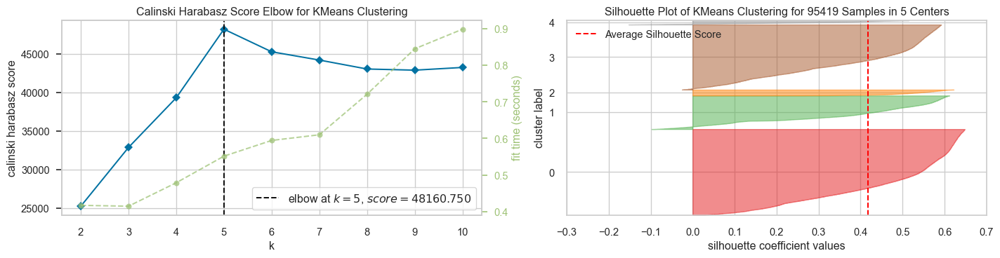

In [31]:
X4=X.drop(columns=['delivery_delay_mean', 'payment_installments_mean'])
preprocessor4, X_scaled4=prepro(X4)
for m in metrics:
    elbowmetrics(X4, preprocessor4, metrics=[m], k_list=(4, 11),
                 cols=2, figsize=(15, 4), graphname='elbow_metrics_'+m+'.png')

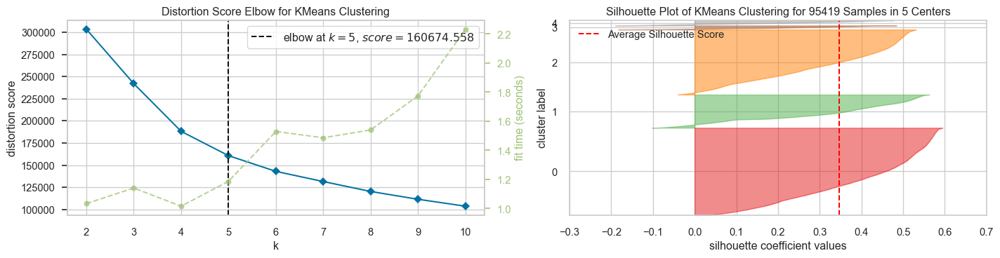

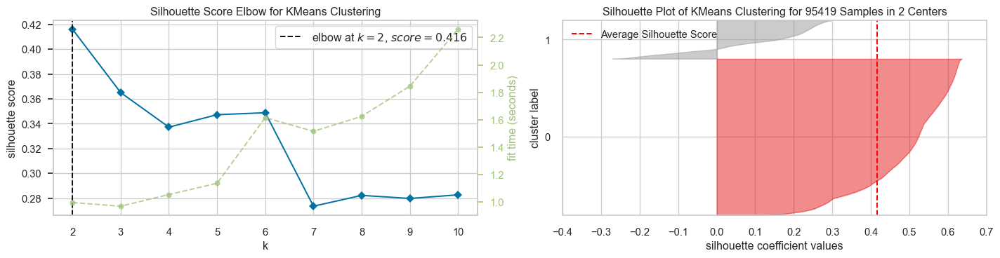

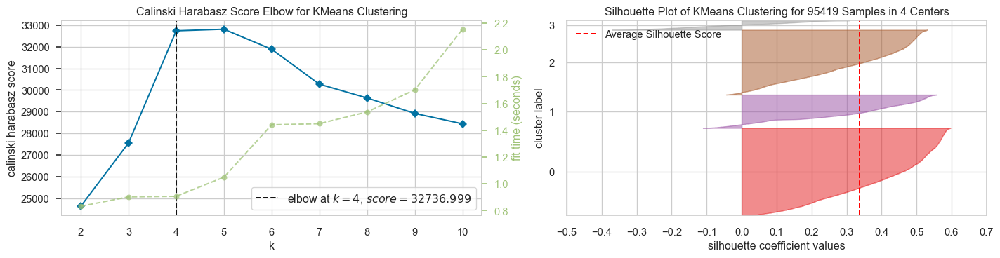

In [25]:
X4b=X.drop(columns=['delivery_delay_mean', 'frequency'])
preprocessor4b, X_scaled4b=prepro(X4b)
for m in metrics:
    elbowmetrics(X4b, preprocessor4b, metrics=[m], k_list=(4, 11),
                 cols=2, figsize=(15, 4), graphname='elbow_metrics_'+m+'.png')

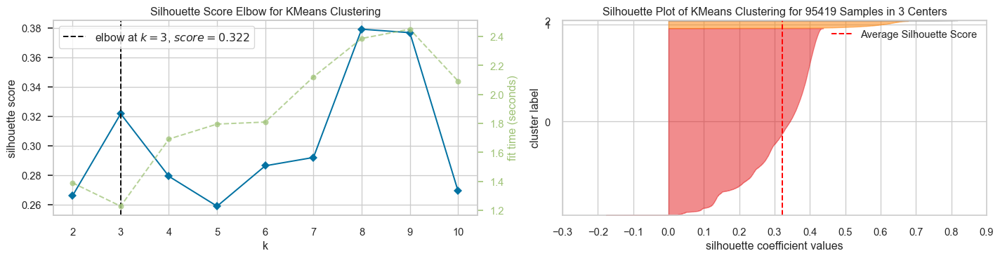

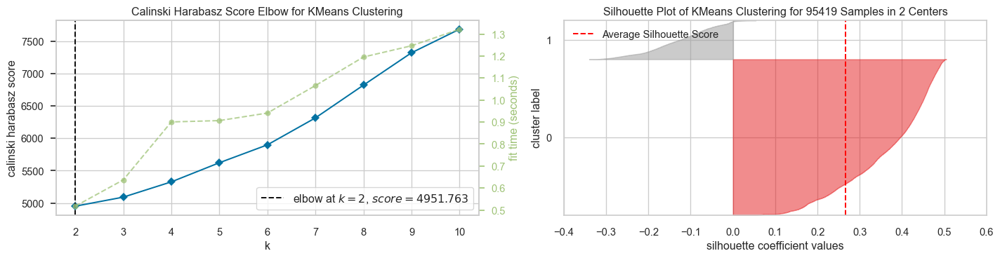

In [26]:
varSelectList=list(set(['recency', 'frequency', 'monetary', 'delivery_delay_mean', 'payment_installments_mean',
               'mean_review_score','poids_freight', 'cat_housewares', 'canceled', 'unavailable', 'approved', 'cat_cool_stuff', 
               'cat_culture', 'cat_services', 'cat_appliances', 'cat_food_drinks', 'cat_furniture', 
               'invoiced', 'cat_garden_outdoors', 'cat_tools', 'processing']))

Xa=df_olist[varSelectList]
preprocessora, X_scaleda=prepro(Xa)
for m in metrics[1:]:
    elbowmetrics(Xa, preprocessora, metrics=[m], k_list=(4, 11),
                 cols=2, figsize=(15, 4), graphname='elbow_metrics_all_'+m+'.png')

['cat_furniture', 'invoiced', 'frequency', 'cat_cool_stuff', 'cat_housewares', 'cat_tools', 'canceled', 'approved', 'cat_garden_outdoors', 'poids_freight', 'delivery_delay_mean', 'cat_culture', 'processing', 'cat_appliances', 'recency', 'payment_installments_mean', 'mean_review_score', 'unavailable', 'cat_food_drinks', 'monetary', 'cat_services']


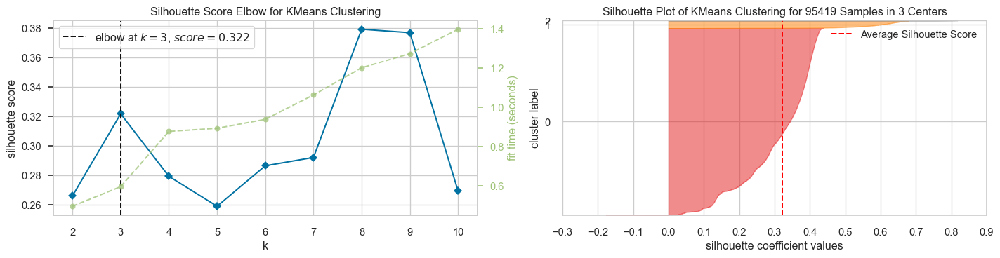

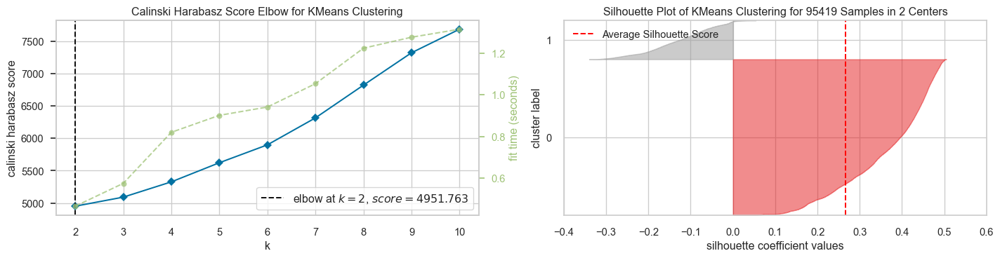

In [27]:
varSelectListb=list(set(varSelectList)-set(['cat_hygiene_and_beauty', 'cat_auto_leisure',
                                            'cat_electronics', 'cat_fashion', 'cat_decoration']))
print(varSelectListb)
Xb=df_olist[varSelectListb]
preprocessorb, X_scaledb=prepro(Xb)
for m in metrics[1:]:
    elbowmetrics(Xb, preprocessorb, metrics=[m], k_list=(4, 11),
                 cols=2, figsize=(15, 4), graphname='elbow_metrics_all_'+m+'.png')

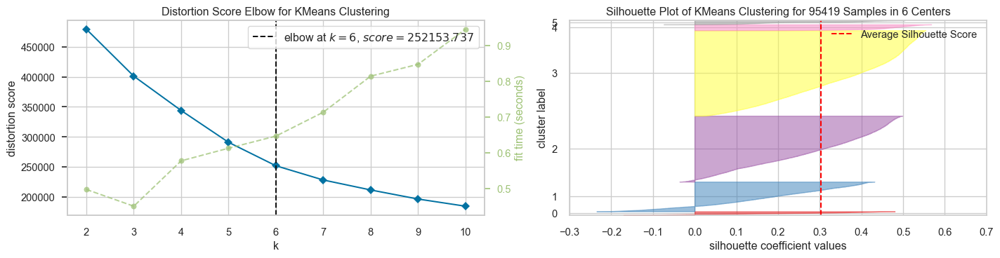

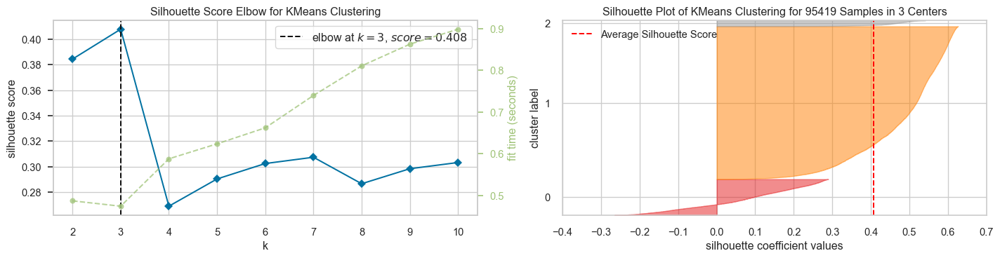

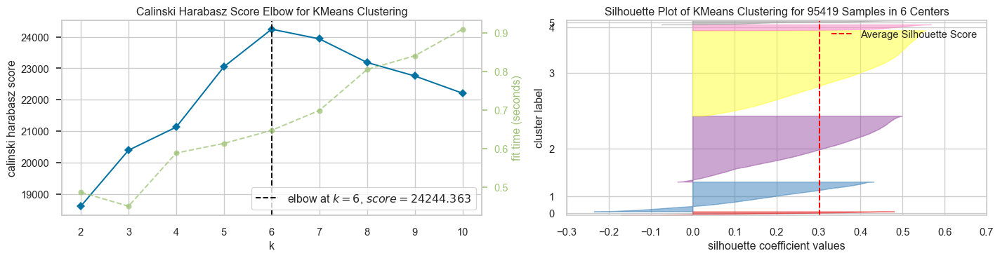

In [28]:
varSelectListc=['recency', 'frequency', 'monetary', 'delivery_delay_mean',
                'mean_review_score','nbitem_order_mean']

Xc=df_olist[varSelectListc]
preprocessorc, X_scaledc=prepro(Xc)
for m in metrics:
    elbowmetrics(Xc, preprocessorc, metrics=[m], k_list=(4, 11),
                 cols=2, figsize=(15, 4), graphname='elbow_metrics_all_'+m+'.png')

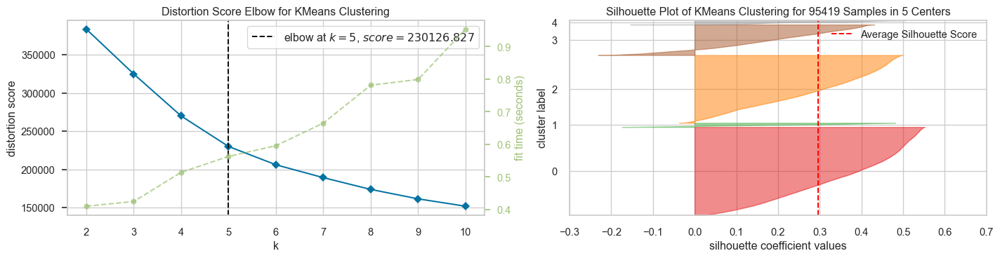

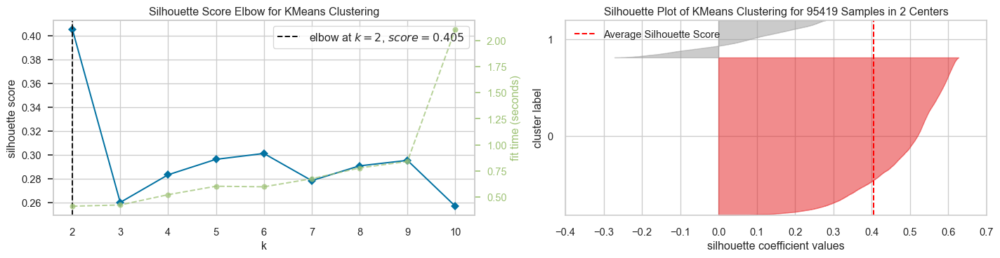

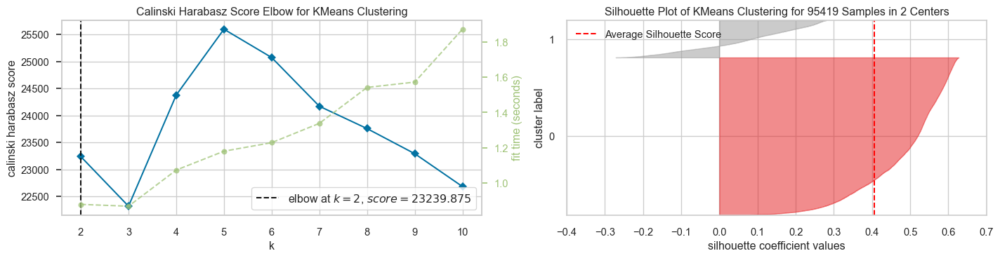

In [29]:
varSelectListc=['recency',  'monetary', 'delivery_delay_mean',
                'mean_review_score','nbitem_order_mean']

Xc=df_olist[varSelectListc]
preprocessorc, X_scaledc=prepro(Xc)
for m in metrics:
    elbowmetrics(Xc, preprocessorc, metrics=[m], k_list=(4, 11),
                 cols=2, figsize=(15, 4), graphname='elbow_metrics_all_'+m+'.png')

In [ ]:
#  différentes combinaisons

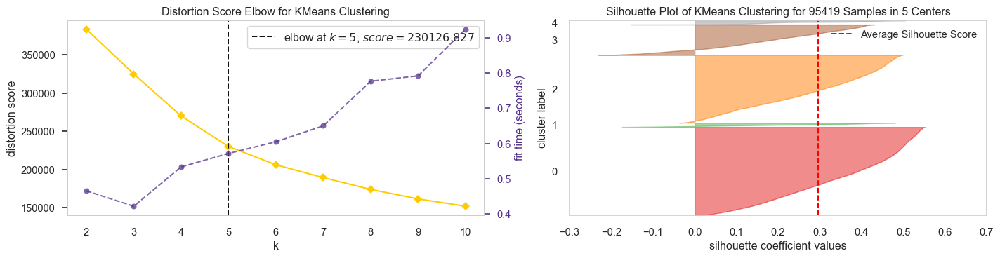

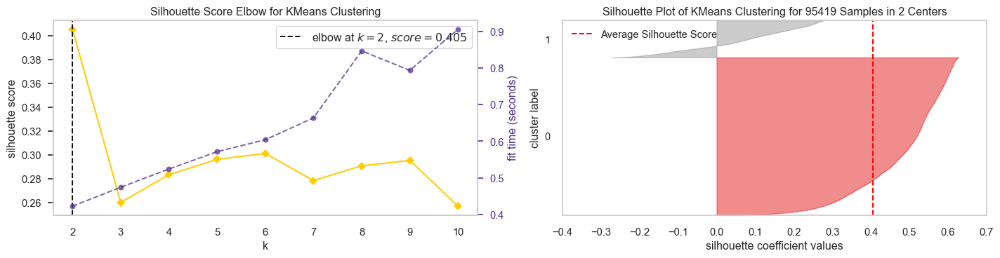

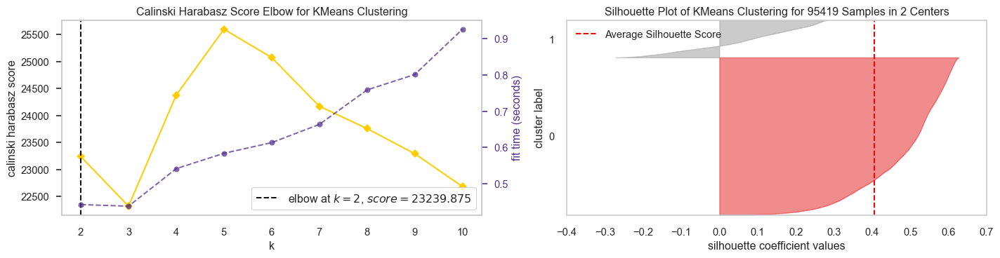

In [84]:
varSelectListc=['recency',  'monetary', 'delivery_delay_mean',
                'mean_review_score','nbitem_order_mean']

Xc=df_olist[varSelectListc]
preprocessorc, X_scaledc=prepro(Xc)
for m in metrics:
    elbowmetrics(Xc, preprocessorc, metrics=[m], k_list=(4, 11),
                 cols=2, figsize=(15, 4), graphname='elbow_metrics_all_'+m+'.png')

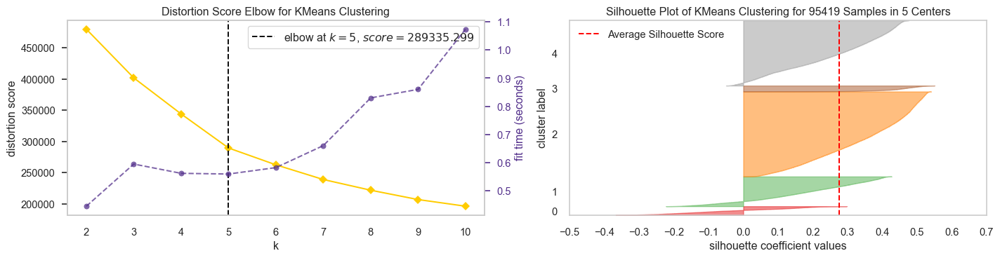

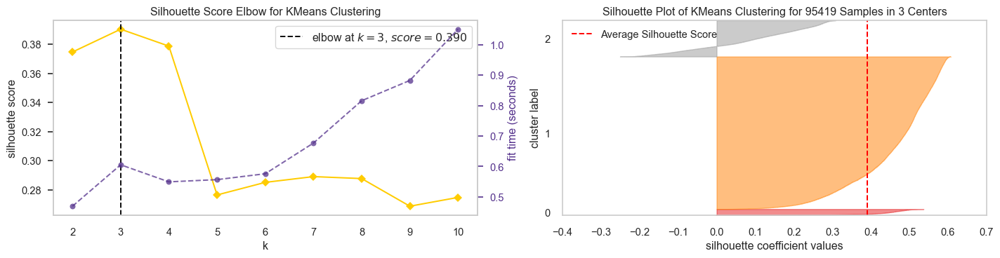

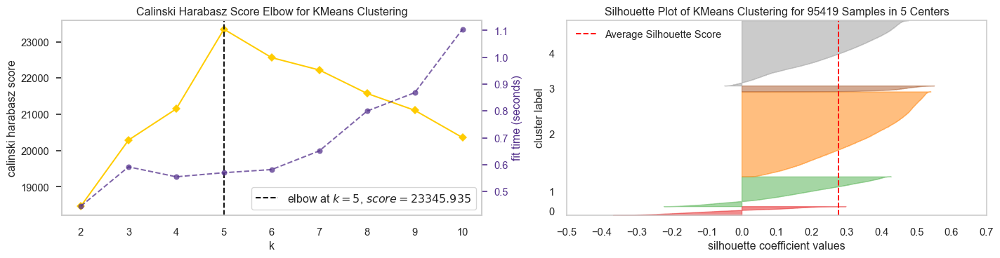

In [85]:
preprocessor, X_scaled=prepro(X)
for m in metrics:
    elbowmetrics(X, preprocessor, metrics=[m], k_list=(4, 11),
                 cols=2, figsize=(15, 4), graphname='elbow_metrics_X_'+m+'.png')

In [86]:
for v in range(4, len(X.columns)):
    varlist=list(set(X.columns.tolist()[:v])-set(['frequency']))
    print('v=',v, 'var =', varlist)

v= 4 var = ['monetary', 'delivery_delay_mean', 'recency']
v= 5 var = ['monetary', 'payment_installments_mean', 'delivery_delay_mean', 'recency']


v= 4 var = ['monetary', 'delivery_delay_mean', 'recency']


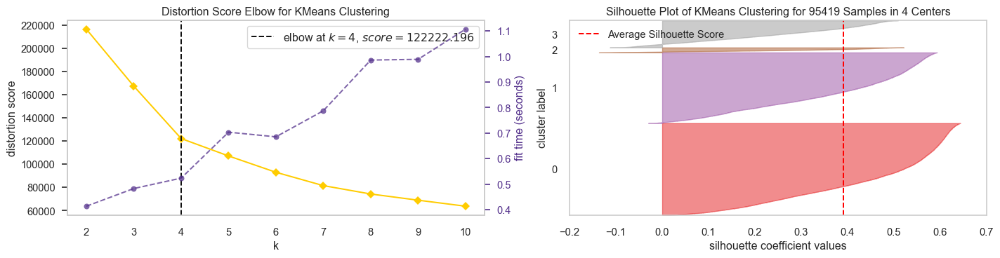

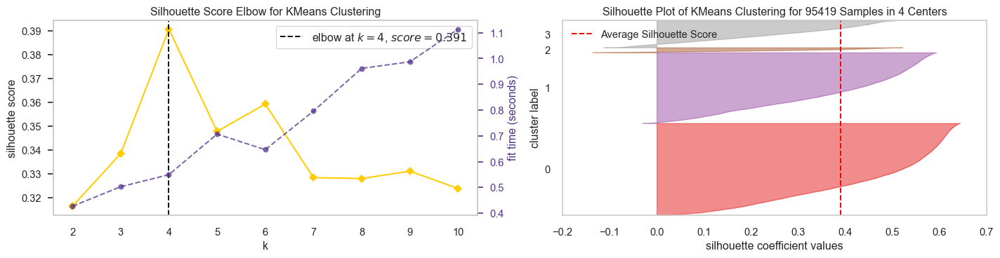

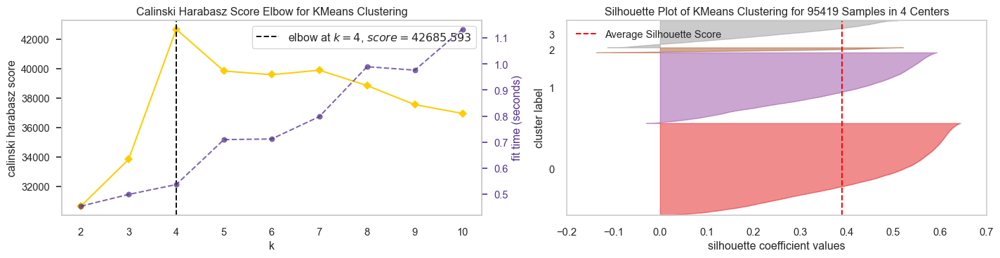

v= 5 var = ['monetary', 'payment_installments_mean', 'delivery_delay_mean', 'recency']


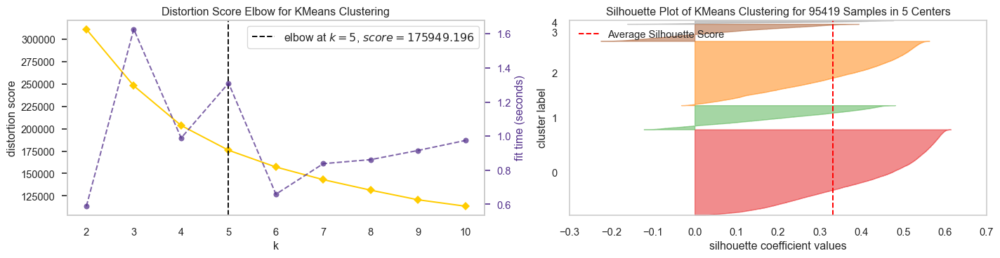

In [ ]:
for v in range(4, len(X.columns)):
    varlist=list(set(X.columns.tolist()[:v])-set(['frequency']))
    print('v=',v, 'var =', varlist)
    preprocessorX, X_scaledX=prepro(X[varlist])
    for m in metrics:
        elbowmetrics(X[varlist], preprocessorX, metrics=[m], k_list=(4, 11),
                     cols=2, figsize=(15, 4), graphname='elbow_metrics_all_'+m+'.png')

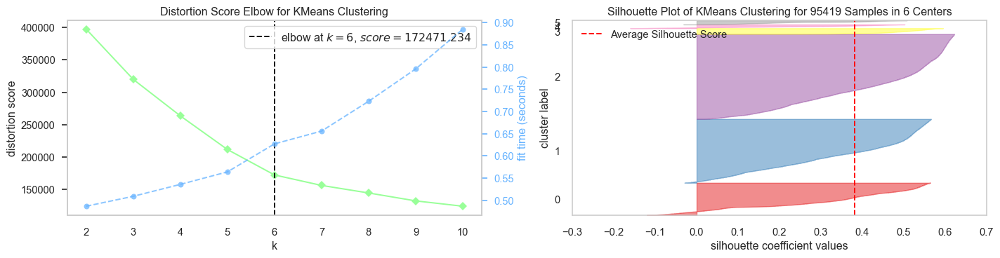

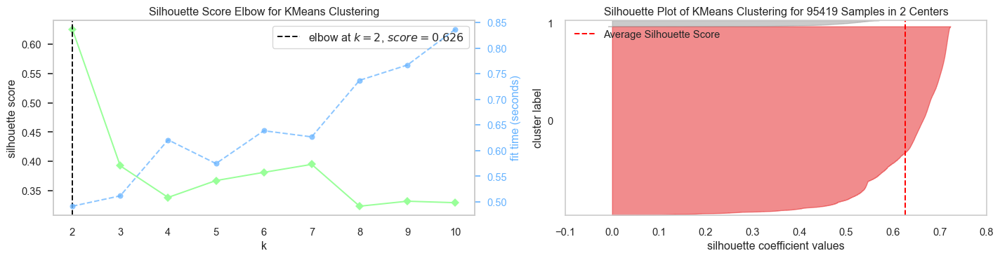

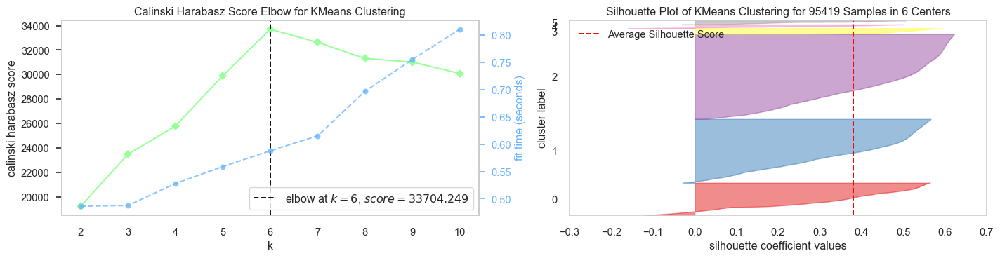

In [131]:
varSelectListc=['recency', 'frequency', 'monetary','mean_review_score','nbitem_order_mean']

Xc=df_olist[varSelectListc]
preprocessorc, X_scaledc=prepro(Xc)
for m in metrics:
    elbowmetrics(Xc, preprocessorc, metrics=[m], k_list=(4, 11),
                 cols=2, figsize=(15, 4), graphname='elbow_metrics_all_'+m+'.png')

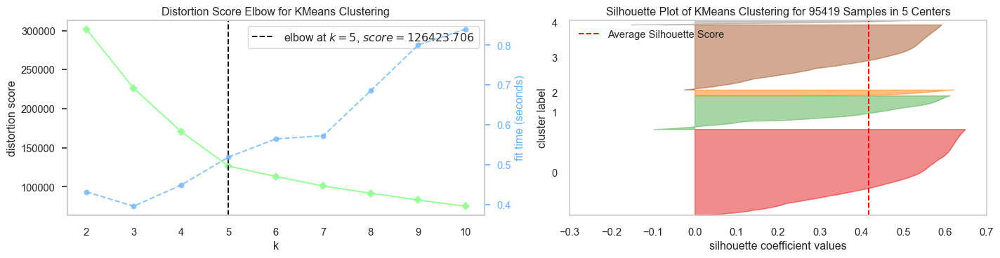

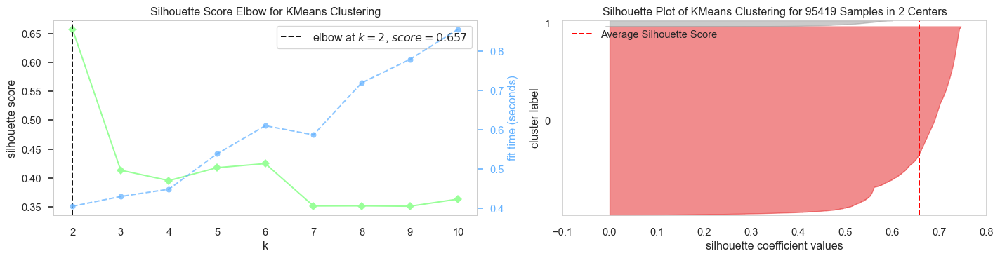

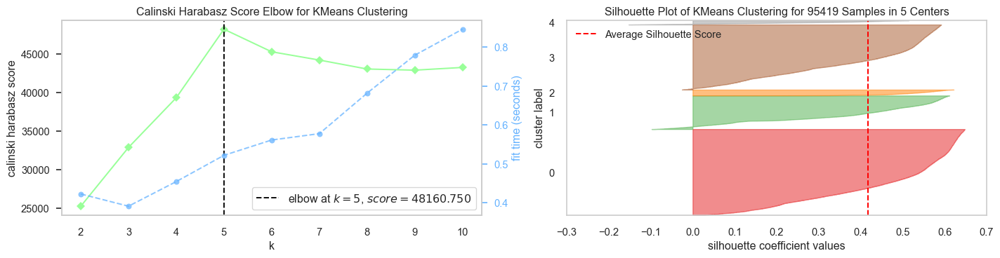

In [132]:
varSelectListc=['recency', 'frequency', 'monetary','mean_review_score']

Xc=df_olist[varSelectListc]
preprocessorc, X_scaledc=prepro(Xc)
for m in metrics:
    elbowmetrics(Xc, preprocessorc, metrics=[m], k_list=(4, 11),
                 cols=2, figsize=(15, 4), graphname='elbow_metrics_all_'+m+'.png')

In [49]:
X=df_olist[['recency', 'frequency', 'monetary','mean_review_score']]
preprocessor, X_scaled=prepro(X)

-------

A la lumière des résultats ci dessus, nous voyons que les clusters issus du ***modèle RFMS (RFM+mean_score_reviews)*** sont mieux **separés et presentent moins d'impuretés**. 
Nous allons retenir le modèle RFMS avec $ \large K=5$.  


In [50]:
KBest=5

For n  number of clusters = 5 Average silhouette score is:  0.417661112730354


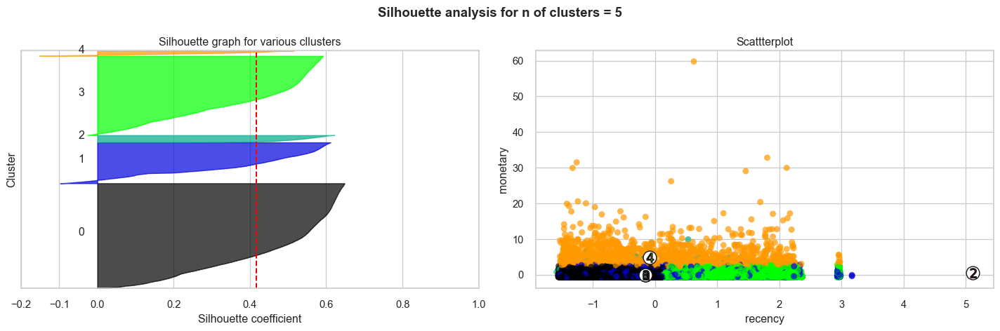

In [51]:
from sklearn.metrics import silhouette_samples

scores = []

n_clusters = [KBest] #[2, 3, 4, 5, 6, 7, 8, 9]

def viz_cluster(n_clusters):
    for n in n_clusters:
        fig, (ax1, ax2) = plt.subplots(1, 2)
        fig.set_size_inches(15, 5)


        ax1.set_xlim([-0.2, 1])
        ax1.set_ylim([0, len(X_scaled) + (n + 1) * 10])

        clusterer = KMeans(n_clusters = n, random_state=random_state)
        cluster_labels = clusterer.fit_predict(X_scaled)
        silhouette_avg = silhouette_score(X_scaled, cluster_labels)
        print("For n  number of clusters =", n,
              "Average silhouette score is: ", silhouette_avg)
        scores.append(silhouette_avg)

        sample_silhouette_values = silhouette_samples(X_scaled, cluster_labels)

        y_lower = 10
        for i in range(n):
            ith_cluster_silhouette_values = \
                sample_silhouette_values[cluster_labels == i]

            ith_cluster_silhouette_values.sort()

            size_cluster_i = ith_cluster_silhouette_values.shape[0]
            y_upper = y_lower + size_cluster_i
            color = cm.nipy_spectral(float(i) / n)
            ax1.fill_betweenx(np.arange(y_lower, y_upper),
                              0, ith_cluster_silhouette_values,
                              facecolor=color, edgecolor=color, alpha=0.7)

            ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

            y_lower = y_upper + 10  

        ax1.set_title("Silhouette graph for various cllusters")
        ax1.set_xlabel("Silhouette coefficient")
        ax1.set_ylabel("Cluster")
        ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

        ax1.set_yticks([])  
        ax1.set_xticks([-0.2,-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

        colors = cm.nipy_spectral(cluster_labels.astype(float) / n)
        ax2.scatter(X_scaled['recency'], X_scaled['monetary'], 
                    marker='.', s=180, lw=0, alpha=0.7,
                    c=colors, edgecolor='k')

        centers = clusterer.cluster_centers_
        ax2.scatter(centers[:, 1], centers[:, 2], marker='o',
                    c="white", alpha=1, s=200, edgecolor='k')
        for i, c in enumerate(centers):
            ax2.scatter(c[1], c[2], marker='$%d$' % i, alpha=1,
                        s=100, edgecolor='k')

        ax2.set_title("Scattterplot")
        ax2.set_xlabel('recency')
        ax2.set_ylabel('monetary')

        plt.suptitle(("Silhouette analysis"
                      " for n of clusters = %d" % n),
                     fontsize=14, fontweight='bold')

    plt.show()

viz_cluster(n_clusters)

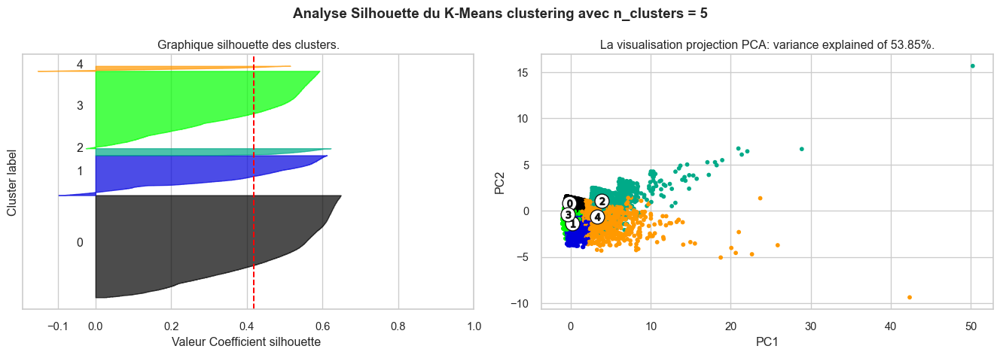

In [52]:
def calculate_k_mean(n_cluster: int, X):
    '''
    General Function to returns commonly used metrics for K-Means Clustering and the fitted instance
    '''
    kmean = KMeans(n_clusters = n_cluster, random_state=random_state)
    cluster_labels = kmean.fit_predict(X)
    return kmean.inertia_, cluster_labels, kmean.cluster_centers_, kmean

def silhouette_analysis_with_pca(n_clusters : int,  X):
    '''
    Perform Silhoette Analysis and Visualising the clusters generated using PCA

    Reference: https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html
    '''
    
    # Perform K-Mean Clustering
    _, cluster_labels, cluster_centroids, kmean = calculate_k_mean(n_clusters, X)

    # Compute Individual Silhoette Score
    silhoettes_avg = silhouette_score(X, cluster_labels)

    # Compute Average Silhoette Score
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(14, 5)

    ################################### Silhouette Plot #############################################
 
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    # ax1.set_xlim([-0.1, 1])
    # ax1.set_ylim([0, len(cust_df) + (n_clusters + 1) * 10])
    y_lower = 10

    # Assign colours for different cluster
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()
        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i
        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper), 0, 
                          ith_cluster_silhouette_values, 
                          facecolor=color, edgecolor=color, alpha=0.7)
        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("Graphique silhouette des clusters.")
    ax1.set_xlabel("Valeur Coefficient silhouette ")
    ax1.set_ylabel("Cluster label")
    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhoettes_avg, color="red", linestyle="--")
    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    ################################### PCA Plot #############################################
 
    # Compute PCA with only First 2 Number of Component
    pca2 = PCA(n_components=2)
    sample_pca2 = pca2.fit_transform(X)

    # Plotting the PCA graph
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(sample_pca2[:,0], sample_pca2[:,1], marker='.', s=75, lw=0, alpha=1,
            c=colors, edgecolor='k')

    # Labeling the clusters
    centers = cluster_centroids.dot(pca2.components_.T) # Calculate New Cluster Positions after PCA

    # Labelling each cluster centroids
    ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                 c="white", alpha=1, s=200, edgecolor='k')
    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')
    ax2.set_title("La visualisation projection PCA: variance explained of {:.2f}%.".format(pca2.explained_variance_ratio_.sum()*100))
    ax2.set_xlabel("PC1")
    ax2.set_ylabel("PC2")
    plt.suptitle(("Analyse Silhouette du K-Means clustering "
                  "avec n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')
    plt.show()


silhouette_analysis_with_pca(n_clusters = KBest, X = X_scaled)

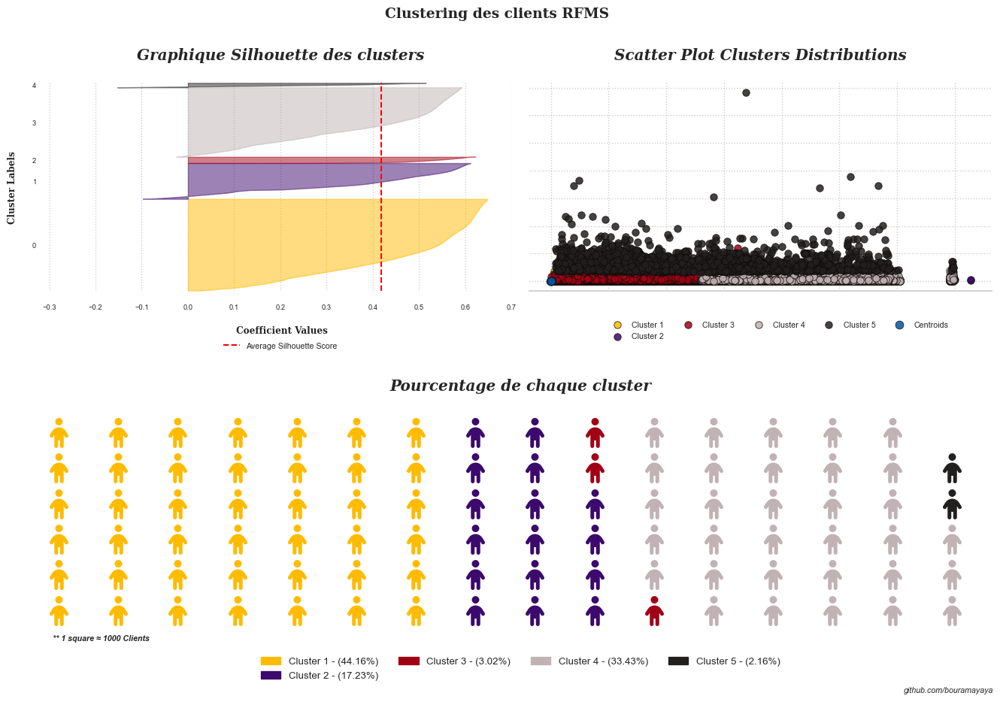

In [38]:
# --- Calling K-Means Functions ---
visualizer(X, preprocessor,  K=KBest, var1='recency', var2='monetary', echelle=1000,figsize=(14, 10),
          titre='Clustering des clients RFMS \n', graphname='visualizer_RFMS1.png');

#### <font color="#337da4"> Distance inter cluster </font>
-----------------------------------------------------

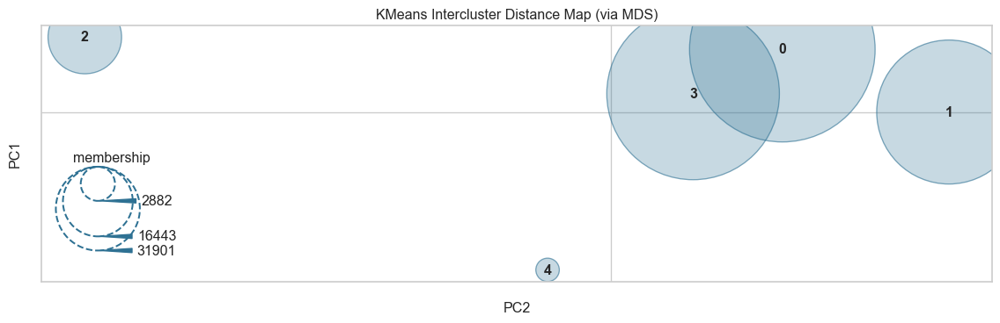

In [39]:
distanceInterCluster(X, preprocessor, KBest, graphname='distanceInterClusterRFMS.png')

##### <font color="#337da4" id="3.2.4"> 3.2.4. Projection des clusters</font>
-----------------------------------------------------

In [49]:
X_pca, X_tsne, X_umap, variance_explique=reduction(X, 2)

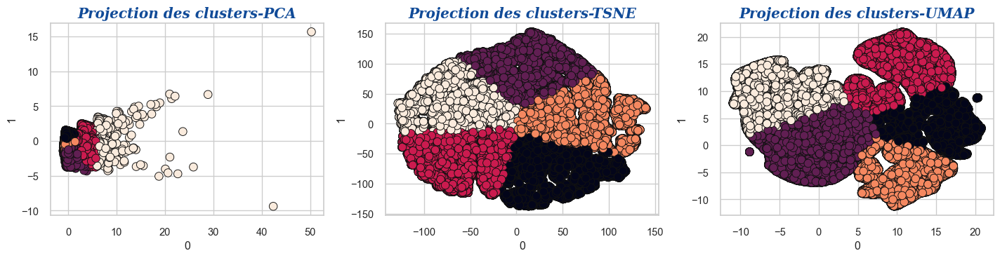

In [50]:
projection_cluster(X, layout=(1,3), nb_clusters=KBest, graphname='projection_ClusterRFMS.png')

In [51]:
X_pca3, X_tsne3, X_umap3, variance_explique3=reduction(X, n_components=3)    
X_pca3.columns=['PC'+str(i) for i in range(1, 4)]
X_tsne3.columns=['TSNE'+str(i) for i in range(1, 4)]
X_umap3.columns=['UMAP'+str(i) for i in range(1, 4)]

In [52]:
list(variance_explique3)[1]*100

25.64324342196269

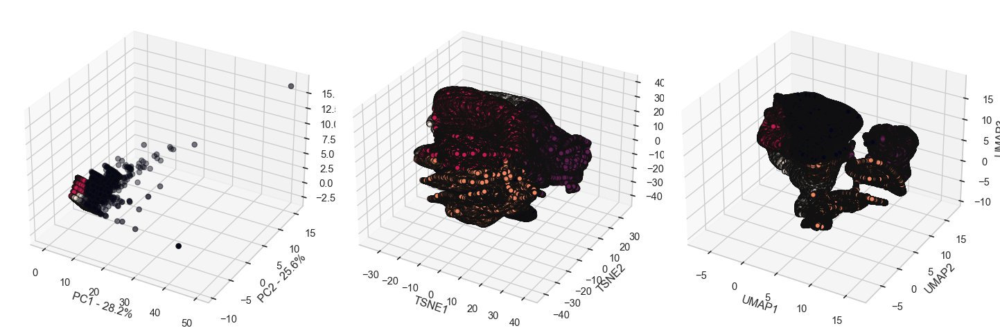

In [53]:
projection_3D(X, K=KBest,  n_components=3)

In [54]:
commentaires='''

Cluster 1: il s'agit des nouveaux clients, low value et moins frequents mais satisfaits;

Cluster 2: il s'agit des clients insatisfaits;

Cluster 3: il s'agit des clients très frequents, low value mais satisfaits;

Cluster 4: il s'agit des anciens clients, low value mais satisfaits;

Cluster 5: il s'agit des super high value, satisfaits.

'''

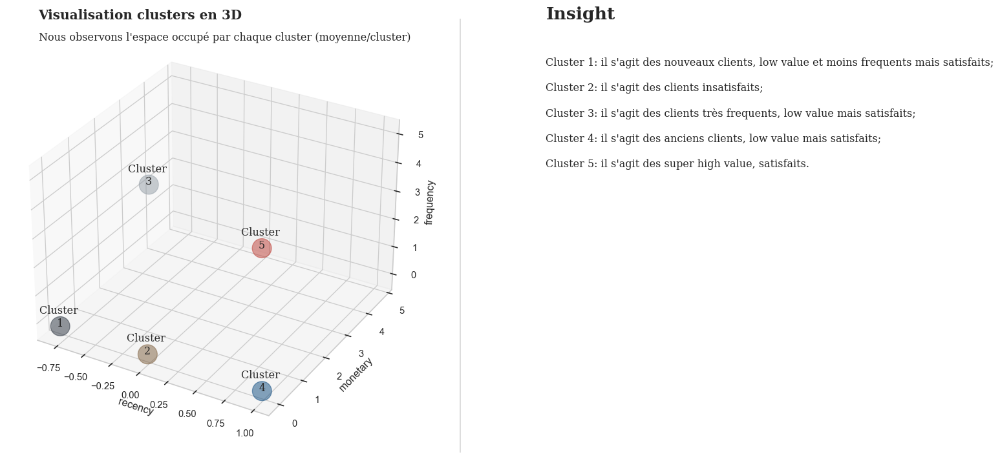

In [55]:
varlist=['recency', 'monetary','frequency']
plot_centroid_3D(X, name="kmeans", 
                n_clusters=KBest, graphname='RFMS_centroid3D1.png',
                model=KMeans(n_clusters=KBest, random_state=random_state),
                varlist=varlist, commentaires=commentaires)

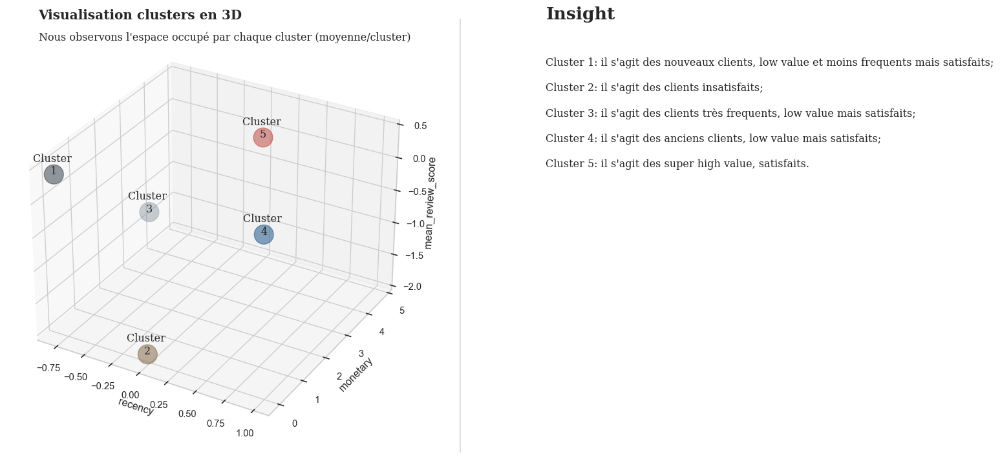

In [56]:
varlist=['recency','monetary','mean_review_score']
plot_centroid_3D(X, name="kmeans", n_clusters=KBest,graphname='RFMS_centroid3D2.png', 
                model=KMeans(n_clusters=KBest, random_state=random_state),
                varlist=varlist, commentaires=commentaires)

##### <font color="#337da4" id="3.2.5"> 3.2.5.Description des clusters </font>
-----------------------------------------------------

##### <font color="#337da4"> Features importances </font>

-------------------------

In [57]:
dfeatures=features_importances_analysis(X_scaled, KBest)
dfeatures

Cluster 0:
recency : 0.7587406543188395
frequency : 0.1610459707707521
monetary : 0.1418345182703489
mean_review_score : 0.43125211049661166
Cluster 1:
recency : 0.004228167984816606
frequency : 0.1610459707707521
monetary : 0.05925007327438918
mean_review_score : 1.8765417702603049
Cluster 2:
recency : 0.1134222104189505
frequency : 5.116754384294206
monetary : 0.5368000631085338
mean_review_score : 0.03292123276276441
Cluster 3:
recency : 1.010417549821323
frequency : 0.16104597077075208
monetary : 0.140172987476788
mean_review_score : 0.39889627046717613
Cluster 4:
recency : 0.003126211308380045
frequency : 0.08513495926580127
monetary : 4.798370784154593
mean_review_score : 0.06554920523820114


,variables,Cluster 0,Cluster 1,Cluster 2,Cluster 3,Cluster 4
0,recency,0.76,0.00,0.11,1.01,0.00
1,frequency,0.16,0.16,5.12,0.16,0.09
2,monetary,0.14,0.06,0.54,0.14,4.80
3,mean_review_score,0.43,1.88,0.03,0.40,0.07


<Figure size 1152x384 with 0 Axes>

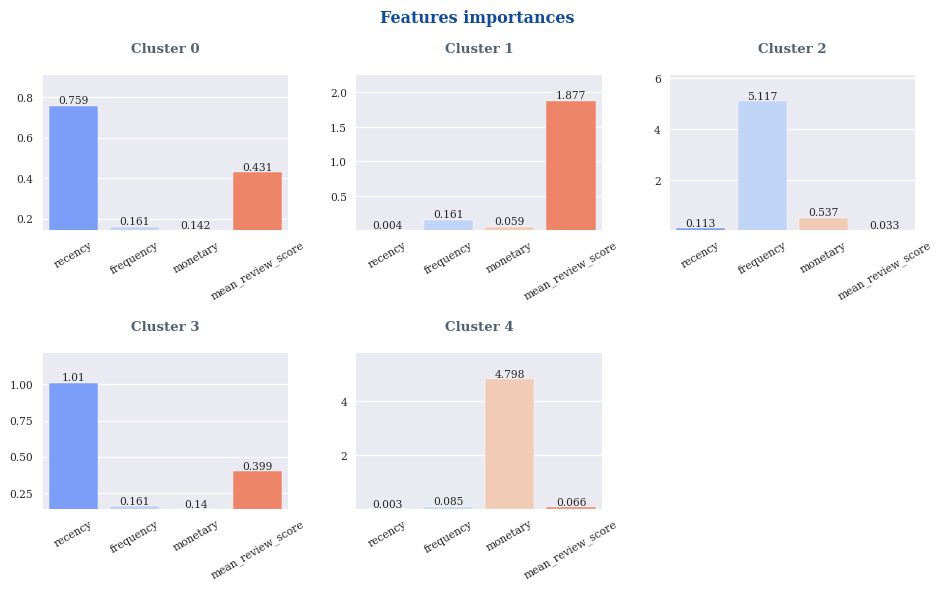

In [58]:
# sns.set_style('darkgrid')
features_importances_graph(data=dfeatures, listvar=dfeatures.columns.tolist()[1:], aggvar='variables', 
            title = r"Features importances" "\n \n \n",
            ncols=3, figsize=(10, 6), labelsize=8, rotation=30, xlabsize=8, ylabsize=8,
            palette='coolwarm', saturation=1, graphName='Features_importances2.png',  
                           shareyy= False, sharexx= False) # , graphName='Features_importances.png'

In [65]:
def description_cluster(X, KBest,
                        model=KMeans(n_clusters=KBest, random_state=random_state),
                        metric='mean',
                        save=None):
    # --- Add K-Means Prediction to Data Frame ----
    model= Pipeline([("preprocessor", preprocessor),
                     ("clusterer", model)])
    model.fit(X)
    labels=model.named_steps['clusterer'].labels_
    df_cluster=X[X.columns]
    df_cluster['clusters'] = labels+1
    df_cluster['clusters'] = 'Cluster '+df_cluster['clusters'].astype(str)


    # --- Calculationg Overall Mean from Current Data Frame ---
    df_profile_overall = pd.DataFrame()
    df_profile_overall['Overall'] = df_cluster.describe().loc[[metric]].T

    # --- Summarize Mean of Each Clusters ---
    df_cluster_summary = (df_cluster.groupby('clusters').describe().T.reset_index()
                          .rename(columns={'level_0': 'Variables', 'level_1': 'Metrics'}))
    df_cluster_summary = df_cluster_summary[df_cluster_summary['Metrics'] == metric].set_index('Variables')

    # --- Combining Both Data Frame ---
    print(clr.start+'.: Statistiques par cluster :.'+clr.end)
    print(clr.color+'*' * 33)
    # f = {'Cluster 1':'{:.2f}'} #column col Cluster 1 to 2 decimals
    df_profile = np.round(df_cluster_summary.join(df_profile_overall).reset_index(), decimals = 3)
    df_styled=df_profile.style.format(precision=2).background_gradient(cmap='YlOrBr').hide_index()
    display(df_styled)
    if save:
        dfi.export(df_styled, imgPath + save)

    return df_profile

cluster_profile=description_cluster(X, KBest,
                                    model=KMeans(n_clusters=KBest, random_state=random_state),
                                    metric='mean', save='RFMS_profile_mean.png')

.: Statistiques par cluster :.
*********************************


Variables,Metrics,Cluster 1,Cluster 2,Cluster 3,Cluster 4,Cluster 5,Overall
recency,mean,126.39,243.24,225.22,397.34,242.12,242.59
frequency,mean,1.00,1.00,2.12,1.00,1.02,1.03
monetary,mean,131.30,149.95,284.57,131.68,1247.04,163.33
mean_review_score,mean,4.68,1.62,4.15,4.64,4.02,4.11


In [66]:
cluster_profile=description_cluster(X, KBest,
                                    model=KMeans(n_clusters=KBest, random_state=random_state),
                                    metric='50%', save='RFMS_profile_median.png')

.: Statistiques par cluster :.
*********************************


Variables,Metrics,Cluster 1,Cluster 2,Cluster 3,Cluster 4,Cluster 5,Overall
recency,50%,124.00,223.00,204.00,387.00,223.00,223.00
frequency,50%,1.00,1.00,2.00,1.00,1.00,1.00
monetary,50%,100.00,110.57,220.31,97.87,1024.58,106.26
mean_review_score,50%,5.00,1.00,4.67,5.00,5.00,5.00


In [67]:
kmeans_model= Pipeline([("preprocessor", preprocessor),
                             ("kmeans", KMeans(n_clusters=KBest, random_state=random_state))])
kmeans_model.fit(X)

labels=kmeans_model.named_steps['kmeans'].labels_+1
df_cluster=pd.concat([X, pd.DataFrame(data=labels,index=X.index, columns=['clusters'])], axis=1)
# df_cluster['clusters'] = labels+1
df_cluster['clusters'] = 'Cluster '+ df_cluster['clusters'].astype(str)
varlist=df_cluster.columns.tolist()[:-1]
varlist

['recency', 'frequency', 'monetary', 'mean_review_score']

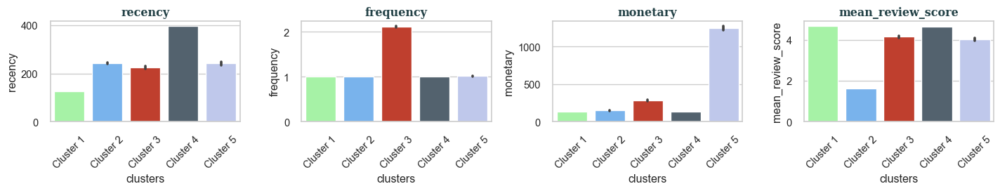

In [68]:
desc_cluster_bar(df_cluster, varlist, cluster_var='clusters',
                     ncols=4, figsize=(15, 3), rotation=45)

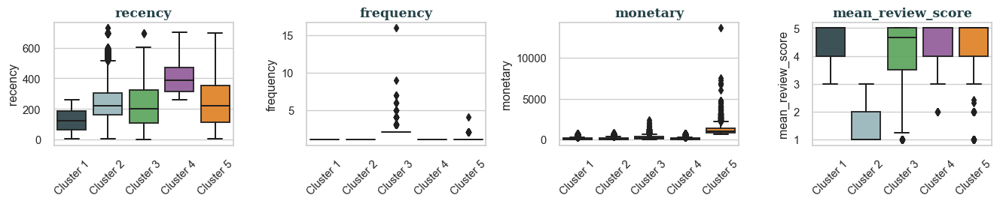

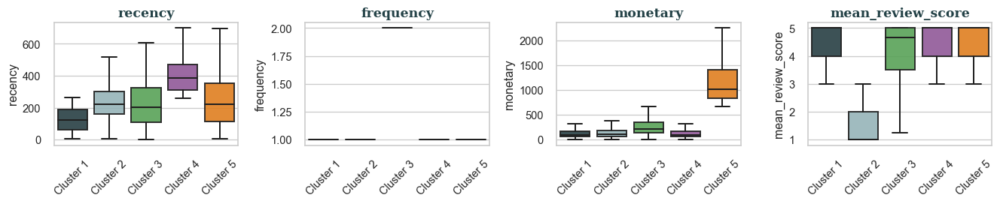

In [69]:
desc_cluster_boxplot(df_cluster, varlist, cluster_var='clusters',
                     ncols=4, figsize=(14, 3),outliers=True, rotation=45)
desc_cluster_boxplot(df_cluster, varlist, cluster_var='clusters',
                     ncols=4, figsize=(14, 3),outliers=False, rotation=45) 

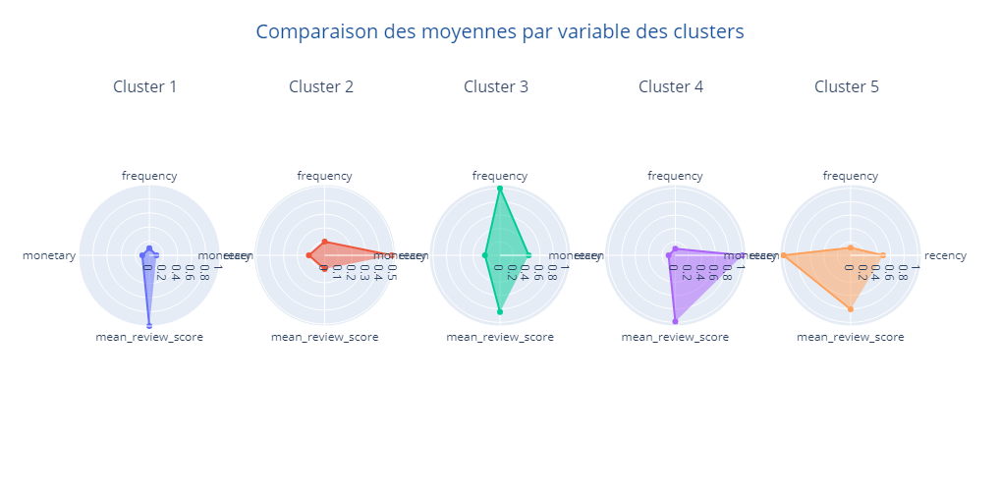

In [53]:
import plotly.offline as po
import plotly.io as pio
from plotly.subplots import make_subplots
import plotly.graph_objects as go

def rows_cols_update(rows, row, cols, col):
    if col + 1 > cols:
        row, col = row + 1, 1
    else:
        row, col = row, col + 1
    return row, col

def plot_radars(X_data, model,  cols=2, scaler = MinMaxScaler(feature_range=(0.1,1)), 
                width=1100, height=500, graphName=None):
    model.fit(X_data)
    labels = model.labels_
    X_clusters=X_data.assign(clusters=labels)
    X_clusters = X_clusters.groupby('clusters', as_index=False).mean()

    unique, counts = np.unique(labels, return_counts=True)
    nplot = len(set(unique))
    row, col = 1, 1
    rows = int(np.ceil(nplot / cols))  # .astype(int) # nplot // cols + 1

    data1=X_clusters[['clusters']]
    data2=X_clusters.drop('clusters', axis=1)

    group2=list(data2.columns)
    data2 = pd.DataFrame(scaler.fit_transform(data2),
                        columns=data2.columns)
    data=pd.concat([data1, data2], axis=1)
    # data=data[[group]+group2]
    # fig = go.Figure()
    # Créer une instance de la classe make_subplots avec les dimensions souhaitées
    fig = make_subplots(rows=rows, cols=cols, specs=[[{'type': 'polar'}] * cols] * rows,
                        subplot_titles=[f'Cluster {cat+1} \n' for cat in data['clusters']])
    # Spécification des tailles des figures
    fig.update_layout(
        autosize=False,
        width=width,  # Largeur totale de la figure
        height=height*rows,  # Hauteur totale de la figure
    )
    for k in data['clusters']:
        fig.add_trace(go.Scatterpolar(
            r=data[data['clusters'] == k].iloc[:, 1:].values.reshape(-1),
            theta=data.columns[1:],
            fill='toself',
            name='Cluster ' + str(k)
        ), row=row, col=col)
        # Ajout des sous titres
        fig.update_layout(title_text=f"Cluster {k}")
        # Update des lignes et colonnes
        row, col = rows_cols_update(rows, row, cols, col)

    fig.update_layout(
        polar=dict(
            radialaxis=dict(
                visible=True,
                range=[0, 1]
            )),
        showlegend=False,  # Supprimer la légende
        title={
            'text': "Comparaison des moyennes par variable des clusters ",
            'y': 0.95,
            'x': 0.5,
            'xanchor': 'center',
            'yanchor': 'top'},
        title_font_color='#114b98',
        title_font_size=20)
        # Save the figure as a PNG file
    if graphName:
        # po.plot(fig, filename=imgPath + graphName) en html
        # fig.write_image(imgPath + graphName)
        pio.write_image(fig, imgPath + graphName)

    fig.show()

plot_radars(X_data=X_scaled,
            model=KMeans(KBest, random_state=random_state),
            cols = 5, width=1000, height=500) # X_scaled_clusters, graphName='RFMS_radars_go.png'

---------------
A la lumière des résultats ci dessus (tableau de synthèse, diagramme radar),  les differents clusters peuvent être decrits comme ci dessous:

- **Cluster 1**:  il s'agit des nouveaux clients, low value et moins frequents mais satisfaits;
- **Cluster 2**:  il s'agit des clients insatisfaits;
- **Cluster 3**:  il s'agit des clients très frequents, low value mais satisfaits;
- **Cluster 4**:  il s'agit des anciens clients, low value mais satisfaits;
- **Cluster 5**:  il s'agit des super high value, satisfaits.


##### <font color="#337da4" id="3.2.5"> 3.2.5.Evaluation du clustering</font>
-----------------------------------------------------

In [54]:
kmeans =  KMeans(KBest, random_state=random_state)
kmeans.fit(X_scaled)
y_kmeans = kmeans.fit_predict(X_scaled)

In [55]:
def evaluate_clustering(X, y):
    db_index = round(davies_bouldin_score(X, y), 3)
    s_score = round(silhouette_score(X, y), 3)
    ch_index = round(calinski_harabasz_score(X, y), 3)
    print(clr.start+'.: Evaluate Clustering Quality :.'+clr.end)
    print(clr.color+'*' * 34+clr.end)
    print('.: Davies-Bouldin Index: '+clr.start, db_index)
    print(clr.end+'.: Silhouette Score: '+clr.start, s_score)
    print(clr.end+'.: Calinski Harabasz Index: '+clr.start, ch_index)
    return db_index, s_score, ch_index

# --- Evaluation de la qualité du clustering
db_kmeans, ss_kmeans, ch_kmeans = evaluate_clustering(X_scaled, y_kmeans)

.: Evaluate Clustering Quality :.
**********************************
.: Davies-Bouldin Index:  0.78
.: Silhouette Score:  0.418
.: Calinski Harabasz Index:  48160.75


#### <font color="#337da4" id="3.3"> 3.3. DBSCAN</font>
----------------------------

<h4> Définition</h4>
DBSCAN (density-based spatial clustering of applications with noise) est un algorithme de partitionnement de données proposé en 1996 par Martin Ester, Hans-Peter Kriegel, Jörg Sander et Xiaowei Xu1. Il s’agit d’un algorithme fondé sur la densité dans la mesure qui s’appuie sur la densité estimée des clusters pour effectuer le partitionnement.

<h4>  Principe de DBSCAN</h4>
L’algorithme DBSCAN utilise 2 paramètres : la distance ε et le nombre minimum de points « MinPts » devant se trouver dans un rayon ε pour que ces points soient considérés comme un cluster.

DBSCAN fonction de la maniere suivante :
<ul>
<li> 1 – DBSCAN commence par un point de données de départ arbitraire qui n’a pas été visité. Le voisinage de ce point est extrait en utilisant une distance epsilon ε.

<li> 2 – S’il y a un nombre suffisant de points (selon les minPoints) dans ce voisinage, le processus de mise en cluster démarre et le point de données actuel devient le premier point du nouveau cluster. Sinon, le point sera étiqueté comme bruit (plus tard, ce point bruyant pourrait devenir la partie du cluster). Dans les deux cas, ce point est marqué comme «visité».

<li> 3 – Pour ce premier point du nouveau cluster, les points situés dans son voisinage à distance se joignent également au même cluster. Cette procédure est ensuite répétée pour tous les nouveaux points qui viennent d’être ajoutés au groupe de cluster.

<li> 4 – Ce processus des étapes 2 et 3 est répété jusqu’à ce que tous les points du cluster soient déterminés, c’est-à-dire que tous les points à proximité du ε voisinage du cluster ont été visités et étiquetés.

<li> 5 – Une fois terminé avec le cluster actuel, un nouveau point non visité est récupéré et traité, ce qui permet de découvrir un nouveau cluster ou du bruit. Ce processus se répète jusqu’à ce que tous les points soient marqués comme étant visités. A la fin de tous les points visités, chaque points a été marqué comme appartenant à un cluster ou comme étant du bruit.
    </ul>

<h4> Hyperparamètres </h4>

> ***Epsilon (eps)*** : C'est le rayon autour de chaque point qui détermine son voisinage. Deux points sont considérés comme voisins s'ils sont distants de moins ou égal à epsilon. Ce paramètre contrôle la taille des clusters formés. Si epsilon est trop petit, il peut y avoir beaucoup de points isolés (bruit), tandis qu'un epsilon trop grand peut fusionner plusieurs clusters en un seul. La valeur de epsilon doit être choisie en fonction de la densité moyenne des points dans l'espace des données.

> ***MinPts*** : C'est le nombre minimum de points requis pour former un cluster. Si un point a au moins MinPts voisins à une distance inférieure ou égale à epsilon, alors il est considéré comme un point central et forme un cluster avec ses voisins. Sinon, il est considéré comme du bruit. La valeur de MinPts dépend de la densité attendue des clusters dans les données.

> ***Métrique de distance : DBSCAN*** nécessite une mesure de distance pour calculer la distance entre les points. Il existe différentes mesures de distance disponibles, telles que la distance euclidienne, la distance de Manhattan, la distance de Minkowski, etc. Le choix de la métrique de distance dépend de la nature des données et de la structure que vous souhaitez capturer.

> ***Algorithme de recherche de voisinage :*** L'algorithme DBSCAN utilise une structure de données pour accélérer la recherche des voisins. Deux options courantes sont l'arbre KD (KD-tree) et la recherche de voisinage basée sur la grille (R-tree). Le choix de l'algorithme dépend de la dimensionnalité des données et de la distribution spatiale des points.

> ***Méthode de traitement du bruit : DBSCAN*** est capable de détecter les points de bruit, c'est-à-dire les points qui ne sont pas attribués à un cluster. Vous pouvez spécifier comment vous souhaitez traiter ces points de bruit. Certains options courantes sont de les ignorer, de les étiqueter comme du bruit ou de les inclure dans le cluster le plus proche.

> ***Autres paramètres avancés :*** Certaines bibliothèques DBSCAN offrent des paramètres avancés, tels que le nombre maximum de voisins à considérer, le nombre maximum de clusters attendus, etc. Ces paramètres peuvent aider à contrôler davantage le processus de clustering.

----
Nous allons proceder à un echantillonnage (une taille de 3000) avant l'implementation de la méthode DBSCAN.


In [56]:
# X_scaled=X_scaled.drop('Cluster', axis=1)
X_scaled2=X_scaled.sample(3000)
len(X_scaled2)

3000

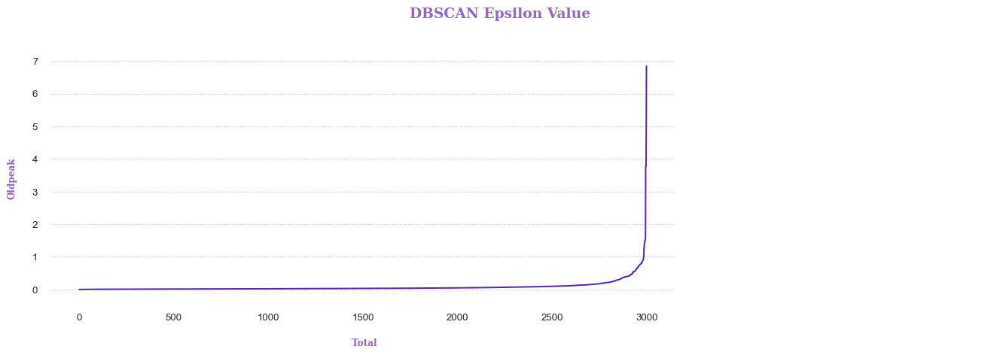

In [57]:
# --- la valeur optimale de Epsilon
def epsilon(X):
    
    # --- Calculate Nearest Neighbors ---
    neighbors=NearestNeighbors(n_neighbors=2)
    nbrs=neighbors.fit(X)
    distances, indices=nbrs.kneighbors(X)
    distances=np.sort(distances, axis = 0)
    
    # --- Figure Settings ---
    bbox=dict(boxstyle='round', pad=0.3, color='#FFDA47', alpha=0.6)
    txt1=dict(textcoords='offset points', va='center', ha='center', fontfamily='serif', style='italic')
    txt2=dict(textcoords='offset points', va='center', fontfamily='serif', style='italic')
    kw=dict(arrowstyle='Simple, tail_width=0.1, head_width=0.4, head_length=1', color='black')
    text_style=dict(fontweight='bold', color='#9467bd', fontfamily='serif')
    fig=plt.figure(figsize=(14, 5))
    
    # --- Epsilon Plot ---
    distances_1=distances[:, 1]
    ax1=fig.add_subplot(1, 3, (1, 2))
    plt.plot(distances_1, color='#5829A7')
    plt.xlabel('\n Total', fontsize=9, **text_style)
    plt.ylabel('Oldpeak\n', fontsize=9, **text_style)
    # ax1.add_patch(Rectangle((8600, -0.3), 500, 2.5, edgecolor='#FFCC00', fill=False, lw=1.5))
    # plt.annotate('The optimal Epsilon value is\nat the point of maximum curvature.', xy=(6300, 6), xytext=(1, 1), fontsize=10, bbox=bbox, **txt1)
    # plt.annotate('', xy=(8600, 1.8), xytext=(6300, 5.1), arrowprops=kw)
    for spine in ax1.spines.values():
        spine.set_color('None')
    plt.grid(axis='y', alpha=0.5, color='#9B9A9C', linestyle='dotted')
    plt.grid(axis='x', alpha=0)
    plt.tick_params(labelsize=10)
    
    # --- Explanations ---
    ax2=fig.add_subplot(1, 3, 3)
    # plt.annotate('From the plot, the maximum curvature\nof the curve is about 2, and thus\nwe picked our Eps as 2.', 
    #              xy=(2, 0.7), xytext=(1, 1), fontsize=14, bbox=bbox, **txt2)
    for spine in ax2.spines.values():
        spine.set_color('None')
    plt.grid(axis='both', alpha=0)
    plt.axis('off')
    
    plt.suptitle('DBSCAN Epsilon Value\n', fontsize=14, **text_style)

    plt.tight_layout()
    plt.show();


epsilon(X_scaled2);

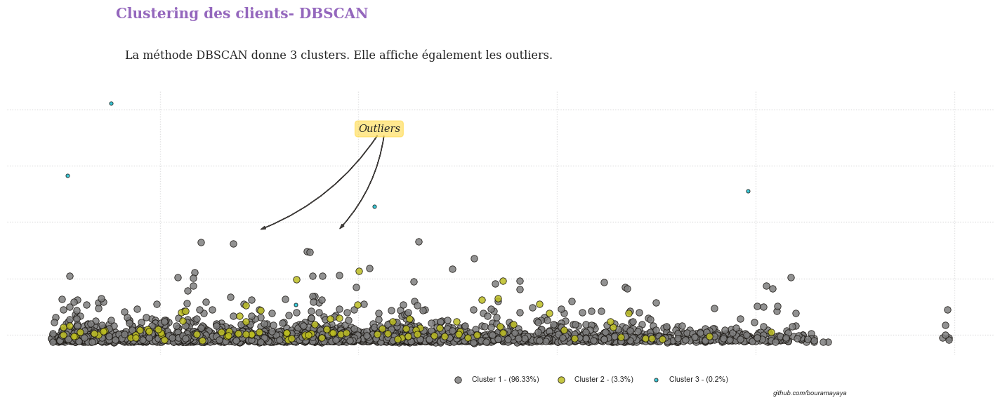

.: Estimation du modèle DBSCAN :.
**********************************
+++ Estimated number of clusters:  3
+++ Estimated number of noise points:  1
+++ Silhouette Coefficient:  0.63


In [58]:
mycolors=['#7f7f7f', '#bcbd22', '#17becf', '#e41a1c', '#377eb8', '#4daf4a', '#984ea3', '#ff7f00', '#ffff33',
             '#a65628', '#f781bf', "#E69F00", "#56B4E9", "#009E73", "#F0E442", "#0072B2", "#D55E00", "#CC79A7",
             "#000000", "b", "#4CAF50"]

# --- Implemention de DBSCAN ---
dbscan = DBSCAN(eps=2, min_samples=5, n_jobs=-1)
y_dbscan = dbscan.fit_predict(X_scaled2)
    
def dbscan_visualizer(X, dbscan, y_dbscan, var1=None, var2=None):
    if not var1:
        var1, var2=X.columns[0], X.columns[1]
    
    # --- Percentage labels ---
    unique, counts = np.unique(y_dbscan, return_counts=True)
    dbscan_count = dict(zip(unique, counts))
    total = sum(dbscan_count.values())
    dbscan_label = {key: round(value/total*100, 2) for key, value in dbscan_count.items() if key != -1}
    
    # Nombre de clusters, ignorant les bruits (noise).
    n_clusters_ = len(set(unique)) - (1 if -1 in unique else 0)
    n_noise_ = list(unique).count(-1)
    
    # --- Figures Settings
    cluster_colors=mycolors[:n_clusters_+1]
    labels = ['Cluster ' for i in range(1,n_clusters_+1)]+['Outliers'] #[, 'Cluster 2', 'Cluster 3', 'Cluster 4','Outliers']
    suptitle=dict(fontsize=15, color='#9467bd', fontweight='heavy', fontfamily='serif')
    title=dict(fontsize=12, fontfamily='serif')
    scatter_style=dict(linewidth=0.65, edgecolor='#100C07', alpha=0.85)
    bbox=dict(boxstyle='round', pad=0.3, color='#FFDA47', alpha=0.6)
    txt=dict(textcoords='offset points', va='center', ha='center', fontfamily='serif', style='italic')
    legend_style=dict(borderpad=2, frameon=False, fontsize=8)
    
    # --- Arrow Settings
    style = 'Simple, tail_width=0.3, head_width=3, head_length=5'
    kw = dict(arrowstyle=style, color='#3E3B39')
    arrow1 = patches.FancyArrowPatch((0.1, 17.8), (-0.5, 9.3), connectionstyle='arc3, rad=-0.16', **kw)
    arrow2 = patches.FancyArrowPatch((0.13, 17.8), (-0.1, 9.3), connectionstyle='arc3, rad=-0.16', **kw)    


    # --- Clusters Distribution ---
    y_dbscan_labels = list(set(y_dbscan.tolist()))
    fig, ax = plt.subplots(1, 1, figsize=(15, 6))
    for i in np.arange(0, 2, 1):
        plt.scatter(X.loc[y_dbscan==i, var1], X.loc[y_dbscan == i, var2], s=50, c=cluster_colors[i], label=labels[i], **scatter_style)
    plt.scatter(X.loc[y_dbscan==-1, var1], X.loc[y_dbscan == -1, var2], s=15, c=cluster_colors[2], label=labels[2], **scatter_style)
    for spine in ax.spines.values():
        spine.set_color('None')
    plt.legend([f"Cluster {i+1} - ({k}%)" for i, k in dbscan_label.items()], 
               bbox_to_anchor=(0.75, -0.01), ncol=3, **legend_style)
    plt.grid(axis='both', alpha=0.3, color='#9B9A9C', linestyle='dotted')
    # ax.add_patch(Rectangle((2, 7.8), 1, 1.5, edgecolor='#3E3B39', fill=False, lw=1.5))
    # ax.add_patch(Rectangle((2.6, 7.8), 1, 1.5, edgecolor='#3E3B39', fill=False, lw=1.5))
    ax.add_patch(arrow1)
    ax.add_patch(arrow2)
    plt.annotate('Outliers', xy=(0.1, 18.2), xytext=(1, 1), fontsize=11, bbox=bbox, **txt)
    plt.tick_params(left=False, right=False , labelleft=False , labelbottom=False, bottom=False)
    plt.title('La méthode DBSCAN donne %d clusters. Elle affiche également les outliers.' % n_clusters_, 
              x=0.12, y=1.1,loc='left', **title)
    plt.suptitle('Clustering des clients- DBSCAN', x=0.12, y=1, ha='left', **suptitle)
    plt.gcf().text(0.77, 0.04, 'github.com/bouramayaya', style='italic', fontsize=7)
    plt.show()
    
    print(clr.start+'.: Estimation du modèle DBSCAN :.'+clr.end)
    print(clr.color+'*' * 34+clr.end)
    print('+++ Estimated number of clusters: '+clr.start, n_clusters_)
    print(clr.end+'+++ Estimated number of noise points: '+clr.start, n_noise_)
    print(clr.end+'+++ Silhouette Coefficient: '+clr.start, round(silhouette_score(X, y_dbscan),2))
    
    # print('-------------------------------------------------')
    # print('Estimated number of clusters: %d' % n_clusters_)
    # print('Estimated number of noise points: %d' % n_noise_)
    # print("Homogeneity: %0.3f" % metrics.homogeneity_score(labels_true, labels))
    # print("Completeness: %0.3f" % metrics.completeness_score(labels_true, labels))
    # print("V-measure: %0.3f" % metrics.v_measure_score(labels_true, labels))
    # print("Adjusted Rand Index: %0.3f"
    #       % metrics.adjusted_rand_score(labels_true, labels))
    # print("Adjusted Mutual Information: %0.3f"
    #       % metrics.adjusted_mutual_info_score(labels_true, labels,
    #                                            average_method='arithmetic'))
    # print("Silhouette Coefficient: %0.3f"
    #       % silhouette_score(X, y_dbscan))
    # print('-------------------------------------------------')  

dbscan_visualizer(X_scaled2, dbscan, y_dbscan, var1='recency', var2='monetary');

In [59]:
# --- Evaluation de la qualité DBSCAN Clustering
db_dbscan, ss_dbscan, ch_dbscan = evaluate_clustering(X_scaled2, y_dbscan)

.: Evaluate Clustering Quality :.
**********************************
.: Davies-Bouldin Index:  0.667
.: Silhouette Score:  0.629
.: Calinski Harabasz Index:  430.069


#### <font color="#337da4" id="3.4"> 3.4. Hierarchical Clustering (Agglomerative)</font>
----------------------------

<div class="explain-box">
    <blockquote style="color: #000000;">
<b>Le clustering hiérarchique</b> fonctionne via le <b>regroupement de données</b> dans un <b>arbre de clusters</b>. Le clustering hiérarchique commence par traiter chaque point de données comme un cluster distinct. Ensuite, il identifie à plusieurs reprises les 2 clusters qui peuvent être les plus proches et fusionne les 2 clusters comparables maximum <b>jusqu'à ce que tous les clusters soient fusionnés</b>. Dans le clustering hiérarchique, l'objectif est de <b>produire une série hiérarchique de clusters imbriqués</b>. Les dendrogrammes seront utilisés pour <b>visualiser l'historique des regroupements et déterminer le nombre optimal de clusters</b>. Ensuite, en utilisant les dendogrammes générés, nous déterminons la plus grande distance verticale qui ne croise aucun des autres clusters. Ensuite, tracez une ligne de seuil/horizontale aux deux extrémités. Enfin, le nombre optimal de clusters est égal au nombre de lignes verticales passant par la ligne horizontale. Par exemple, dans le cas ci-dessous, le meilleur choix pour non. des clusters seront 4.
<br>
    <center>
    <img src="https://miro.medium.com/max/1198/1*VvOVxdBb74IOxxF2RmthCQ.png" alt="Dendogram" width="35%"> <img src="https://miro.medium.com/max/1100/1*guOwD01bko5ITVIJWQdIPQ.png" alt="Clustering" width="23%"><br>
    <i style="font-size: 10px;">🖼 Dendogram and Hierarchical Clustering Result Example by Prasad Pai</i>
    </center>
    </blockquote>   

</div>

Nous allons <b>créer d'abord un dendrogramme, puis tracer une ligne horizontale entre les deux points</b>. Après cela, nous allons évaluer le dendrogramme créé et comparer ses résultats avec le score de <b>Calinski-Harabasz</b>.
    
<!-- Hello world 👋. Thank you so much for downloading/forking my codes/works. If you like my works, please support me by giving upvotes and comments on my Kaggle profile (https://www.github.com/bouramayaya/). Thank you so much and have a great day 😆👍. More about me: https://linktr.ee/caesarmario_ -->

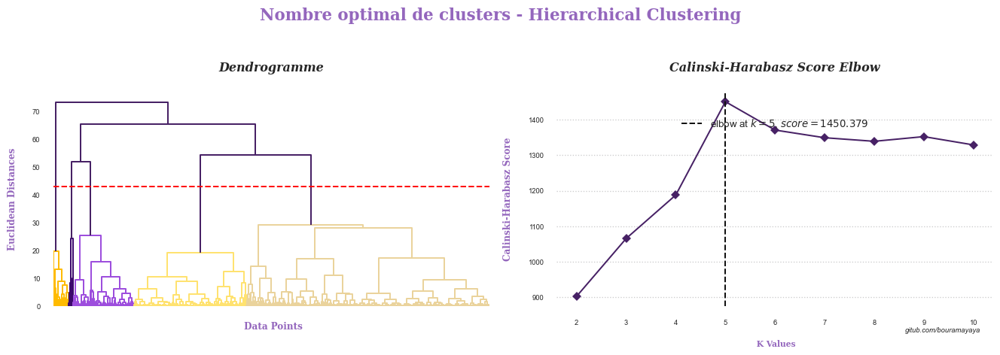

In [60]:
# --- Define Dendrogram ---
def agg_dendrogram(X):
    
    # --- Figure Settings ---
    color_palette=['#472165', '#FFBB00', '#3C096C', '#9D4EDD', '#FFE270','#EAD39C', '#7D5E3C', '#A10115', 
                   "#4CAF50", '#D72C16', '#F0EFEA', '#C0B2B5', '#221f1f', "black", "hotpink", "b", 
                   "#4CAF50",'#EAD39C', '#7D5E3C']
    set_palette(color_palette)
    text_style=dict(fontweight='bold', color='#9467bd', fontfamily='serif')
    ann=dict(textcoords='offset points', va='center', ha='center', fontfamily='serif', style='italic')
    title=dict(fontsize=12,  fontweight='bold', style='italic', fontfamily='serif')
    bbox=dict(boxstyle='round', pad=0.3, color='#FFDA47', alpha=0.6)
    fig=plt.figure(figsize=(14, 5))
    
    # --- Dendrogram Plot ---
    
    ax1=fig.add_subplot(1, 2, 1)
    dend=shc.dendrogram(shc.linkage(X, method='ward', metric='euclidean'))
    plt.axhline(y=43, color='red', linestyle='--')
    plt.xlabel('\n Data Points', fontsize=9, **text_style)
    plt.ylabel('Euclidean Distances\n', fontsize=9, **text_style)
    plt.annotate('Horizontal Cut Line', xy=(1500, 130), xytext=(1, 1), fontsize=8, bbox=bbox, **ann)
    plt.tick_params(labelbottom=False)
    for spine in ax1.spines.values():
        spine.set_color('None')
    plt.grid(axis='both', alpha=0)
    plt.tick_params(labelsize=7)
    plt.title('Dendrogramme\n', **title)
    
    # --- Elbow Score (Calinski-Harabasz Index) ---
    ax2=fig.add_subplot(1, 2, 2)
    elbow_score_ch = KElbowVisualizer(AgglomerativeClustering(), metric='calinski_harabasz', timings=False, ax=ax2)
    elbow_score_ch.fit(X)
    elbow_score_ch.finalize()
    elbow_score_ch.ax.set_title('Calinski-Harabasz Score Elbow\n', **title)
    elbow_score_ch.ax.tick_params(labelsize=7)
    for text in elbow_score_ch.ax.legend_.texts:
        text.set_fontsize(9)
    for spine in elbow_score_ch.ax.spines.values():
        spine.set_color('None')
    elbow_score_ch.ax.legend(loc='upper center', borderpad=2, frameon=False, fontsize=10)#, bbox_to_anchor=(0.5, -0.15)
    elbow_score_ch.ax.grid(axis='y', alpha=0.5, color='#9B9A9C', linestyle='dotted')
    elbow_score_ch.ax.grid(axis='x', alpha=0)
    elbow_score_ch.ax.set_xlabel('\n K Values', fontsize=8, **text_style)
    elbow_score_ch.ax.set_ylabel('Calinski-Harabasz Score\n', fontsize=9, **text_style)
    
    plt.suptitle('Nombre optimal de clusters - Hierarchical Clustering\n', fontsize=16, **text_style)
    plt.gcf().text(0.9, 0.08, 'gitub.com/bouramayaya', style='italic', fontsize=7)
    plt.tight_layout()
    plt.show();


agg_dendrogram(X_scaled2);

In [61]:
# import numpy as np
# import matplotlib.pyplot as plt
# from sklearn.cluster import AgglomerativeClustering
# from sklearn.metrics import calinski_harabasz_score
# from yellowbrick.cluster import KElbowVisualizer

# def find_optimal_clusters(data, max_clusters):
#     # Créer un dictionnaire pour stocker les scores Calinski-Harabasz
#     ch_scores = {}

#     # Appliquer AgglomerativeClustering pour différents nombres de clusters
#     for n_clusters in range(2, max_clusters+1):
#         cluster_model = AgglomerativeClustering(n_clusters=n_clusters)
#         cluster_labels = cluster_model.fit_predict(data)

#         # Calculer le score Calinski-Harabasz
#         ch_score = calinski_harabasz_score(data, cluster_labels)
#         ch_scores[n_clusters] = ch_score

#     # Utiliser KElbowVisualizer pour déterminer le nombre optimal de clusters
#     visualizer = KElbowVisualizer(cluster_model, k=(2, max_clusters), metric='calinski_harabasz')
#     visualizer.fit(data)
#     visualizer.show()

#     # Trouver le nombre de clusters optimal en utilisant le score Calinski-Harabasz
#     optimal_clusters = max(ch_scores, key=ch_scores.get)

#     # Afficher le score Calinski-Harabasz pour chaque nombre de clusters
#     print("Scores Calinski-Harabasz pour chaque nombre de clusters:")
#     for n_clusters, ch_score in ch_scores.items():
#         print(f"Nombre de clusters : {n_clusters}, Score : {ch_score}")

#     # Retourner le nombre optimal de clusters
#     return optimal_clusters

# max_clusters = 10  # Nombre maximum de clusters à considérer

# optimal_clusters = find_optimal_clusters(X_scaled2, max_clusters)
# print(f"Nombre de clusters optimal : {optimal_clusters}")


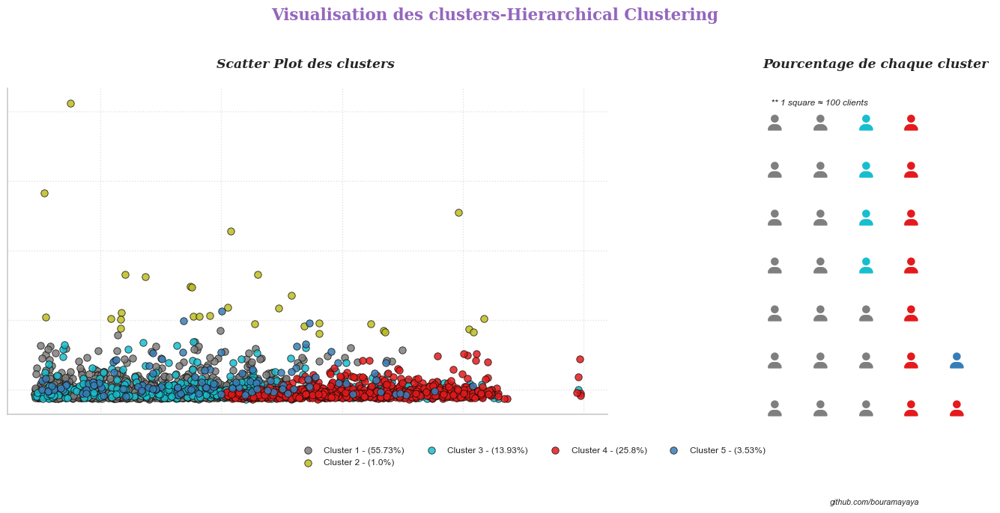

In [62]:
# --- Implemention de Hierarchical Clustering
agg_cluster = AgglomerativeClustering(n_clusters=5, affinity='euclidean', linkage='ward')
y_agg_cluster = agg_cluster.fit_predict(X_scaled2)

def agg_visualizer(X, K, var1=None, var2=None, echelle=100):
    agg_cluster = AgglomerativeClustering(n_clusters=K, affinity='euclidean', linkage='ward')
    y_agg_cluster = agg_cluster.fit_predict(X)
    if not var1:
        var1, var2=X.columns[0], X.columns[1]
    # --- Figures Settings ---
    cluster_colors=mycolors[:K] #['#FFBB00', '#3C096C', '#9D4EDD', '#FFE270','#EAD39C', '#7D5E3C']
    labels = ['Cluster '+str(i+1) for i in range(K)]
    suptitle=dict(fontsize=16, color='#9467bd', fontweight='heavy', fontfamily='serif')
    title=dict(fontsize=13, fontweight='bold', style='italic', fontfamily='serif')
    scatter_style=dict(linewidth=0.65, edgecolor='#100C07', alpha=0.85)
    legend_style=dict(borderpad=2, frameon=False, fontsize=9)
    fig=plt.figure(figsize=(14, 7))
    
    # --- Pourcentage 
    unique, counts = np.unique(y_agg_cluster, return_counts=True)
    df_waffle = dict(zip(unique, counts))
    total = sum(df_waffle.values())
    wfl_square = {key: value/echelle for key, value in df_waffle.items()}
    wfl_label = {key: round(value/total*echelle, 2) for key, value in df_waffle.items()}

    # ---Distribution Clusters
    y_agg_labels = list(set(y_agg_cluster.tolist()))
    ax1=fig.add_subplot(1, 3, (1, 2))
    for i in y_agg_labels:
        ax1.scatter(X.loc[y_agg_cluster==i, var1], X.loc[y_agg_cluster == i, var2], s=50, 
                    c=cluster_colors[i], label=labels[i], **scatter_style)
    for spine in ax1.spines.values():
        spine.set_color('None')
    for spine in ['bottom', 'left']:
        ax1.spines[spine].set_visible(True)
        ax1.spines[spine].set_color('#CAC9CD')
    ax1.legend([f"Cluster {i+1} - ({k}%)" for i, k in wfl_label.items()], bbox_to_anchor=(1.3, -0.03), 
               ncol=4, **legend_style)
    ax1.grid(axis='both', alpha=0.3, color='#9B9A9C', linestyle='dotted')
    ax1.tick_params(left=False, right=False , labelleft=False , labelbottom=False, bottom=False)
    plt.title('Scatter Plot des clusters \n', **title)
    
    # --- Waffle Chart
    ax2=fig.add_subplot(1, 3, 3)
    ax2.set_title('Pourcentage de chaque cluster \n', **title)
    ax2.set_aspect(aspect='auto')
    Waffle.make_waffle(ax=ax2, rows=7, values=wfl_square, colors=cluster_colors, icons='user', icon_size=16)
    ax2.get_legend().remove()
    ax2.text(0.01, 0.95, f"** 1 square ≈ {echelle} clients", style='italic', fontsize=9)
    
    plt.suptitle('Visualisation des clusters-Hierarchical Clustering \n', **suptitle)
    plt.gcf().text(0.83, -0.01, 'github.com/bouramayaya', style='italic', fontsize=8)
    plt.show();
    
# --- Appel de la fonction Hierarchical Clustering 
agg_visualizer(X_scaled2, K=5, var1='recency', var2='monetary', echelle=100);

In [63]:
# --- Evaluation de la qualité Hierarchical Clustering
db_agg, ss_agg, ch_agg = evaluate_clustering(X_scaled2, y_agg_cluster)

.: Evaluate Clustering Quality :.
**********************************
.: Davies-Bouldin Index:  0.796
.: Silhouette Score:  0.373
.: Calinski Harabasz Index:  1450.379


#### <font color="#337da4" id="3.5"> 3.5. Comparaison des modèles </font>
----------------------------

In [64]:
compare = pd.DataFrame({'Model': ['K-Means', 'DBSCAN', 'Hierarchical Clustering'], 
                        'Davies-Bouldin Index': [db_kmeans, db_dbscan, db_agg],
                        'Silhouette Score': [ss_kmeans, ss_dbscan, ss_agg],
                       'Calinski-Harabasz Index': [ch_kmeans, ch_dbscan, ch_agg]})


print(clr.start+'.: Comparaison :.'+clr.end)
print(clr.color+'*' * 32+clr.end)
compare.round(2).sort_values(by='Model', ascending=False).style.background_gradient(cmap='inferno_r').hide_index().set_properties(**{'font-family': 'Segoe UI'})

.: Comparaison :.
********************************


Model,Davies-Bouldin Index,Silhouette Score,Calinski-Harabasz Index
K-Means,0.780000,0.420000,48160.750000
Hierarchical Clustering,0.800000,0.370000,1450.380000
DBSCAN,0.670000,0.630000,430.070000


#### <font color="#337da4" id="3.6"> 3.6. Clustering retenu </font>
----------------------------

A travers ce tableau de synthèse, nous voyons le **DBSCAN** presente de meilleurs scores. Cependant, cette méthode ne peut pas être estimé avec l'ens des données.
De ce fait, **nous allons l'ignorer**. 

Ainsi, entre le **K-means et le clustering hiérarchique**, nous notons un score silhouette plus elevé pour la méthode des **K-means**.
Cette méthode sera **finalement retenu comme méthode finale**. 

### <font color="#337da4" id="4"> 4. Stabilité à l'initialisation du K-Means </font>
----------------------------
Pour ce test, vous allons estimer le modèle ***K-means à plusieurs reprises*** sans fixer ***le RandomState***.

Pour les labels initiaux, nous allons conserver les clusters calculés dans le dernier modèle retenu puis les comparer aux nouveaux labels calculés pour chacune des itérations.

Pour ce faire, nous allons considerer les indicateurs suivants:***Homogénéité, ARI, AMI***.

Ces scores permettent d'évaluer la qualité des clusters formés par l'algorithme de clustering. Des valeurs élevées indiquent une meilleure cohérence entre les clusters et les étiquetages de référence.

<h4>Homogénéité :</h4>

La mesure d'homogénéité évalue dans quelle mesure les clusters contiennent des points qui appartiennent à une seule classe.
Elle mesure à quel point chaque cluster est homogène en termes d'appartenance de classe.
La valeur de l'homogénéité varie de 0 à 1, où 1 signifie que tous les points du cluster appartiennent à une seule classe.

<h4>ARI (Adjusted Rand Index) :</h4>

L'ARI compare les étiquetages prédits par l'algorithme de clustering avec les étiquetages de référence (vraies étiquettes) pour mesurer la similarité entre eux.
L'ARI renvoie une valeur comprise entre -1 et 1, où 1 indique une correspondance parfaite entre les étiquetages prédits et les étiquetages de référence, 0 indique une correspondance au hasard et -1 indique une discordance complète.

<h4>AMI (Adjusted Mutual Information) :</h4>

L'AMI est une autre mesure qui évalue la similarité entre les étiquetages prédits et les étiquetages de référence.
L'AMI mesure la quantité d'informations mutuelles entre les deux étiquetages, en tenant compte de la probabilité d'occurrence des étiquetages individuels.

L'AMI renvoie une valeur comprise entre -1 et 1, où 1 indique une correspondance parfaite entre les étiquetages prédits et les étiquetages de référence, 0 indique une correspondance au hasard et -1 indique une discordance complète.

In [65]:
model =  KMeans(KBest, random_state=random_state)
estimator=model.fit(X_scaled)
labels = model.fit_predict(X_scaled)

def bench_k_means(model, name, data, labels):
    # t0 = time()
    estimator = model.fit(data)
    
    # fit_time = time() - t0
    results = [name,  estimator.inertia_] #fit_time,
    
    # Test differents metrics on pred labels
    clustering_metrics = [
        homogeneity_score,
        adjusted_rand_score,
        adjusted_mutual_info_score]
    results += [m(labels, estimator.labels_) for m in clustering_metrics]
    
    # Show the results
    formatter_result = ("{:9s}\t{:.0f}\t{:.3f}"
                        "\t{:.3f}\t{:.3f}")
    print(formatter_result.format(*results))
    

In [66]:
print("Scores de stabilité à l'initialisation")
print(53 * '_')
print('Iteration\tInertia\tHomo\tARI\tAMI')
print(53 * '_')

for i in range(10):
    imodel = model =  KMeans(KBest, random_state=i) 
    bench_k_means(model = imodel, name="Iter "+str(i), 
                  data=X_scaled, labels=labels)

print(53 * '_')

Scores de stabilité à l'initialisation
_____________________________________________________
Iteration	Inertia	Homo	ARI	AMI
_____________________________________________________
Iter 0   	126424	1.000	1.000	1.000
Iter 1   	126424	1.000	1.000	1.000
Iter 2   	126424	1.000	1.000	1.000
Iter 3   	126424	1.000	1.000	1.000
Iter 4   	126424	0.999	1.000	0.999
Iter 5   	126424	1.000	1.000	1.000
Iter 6   	126424	1.000	1.000	1.000
Iter 7   	126424	1.000	1.000	1.000
Iter 8   	126424	1.000	1.000	1.000
Iter 9   	126424	1.000	1.000	1.000
_____________________________________________________


In [67]:
from sklearn.cluster import KMeans
from sklearn.metrics import homogeneity_score, adjusted_rand_score, adjusted_mutual_info_score

def evaluate_kmeans_stability(X, num_clusters, num_init):
    homogeneity_scores = []
    ari_scores = []
    ami_scores = []

    for i in range(num_init):
        # Initialisation aléatoire
        kmeans = KMeans(n_clusters=num_clusters, random_state=i)
        kmeans.fit(X)

        # Évaluation du modèle avec les scores d'homogénéité, d'ARI et d'AMI
        labels_pred = kmeans.labels_

        homogeneity = homogeneity_score(labels, labels_pred)
        ari = adjusted_rand_score(labels, labels_pred)
        ami = adjusted_mutual_info_score(labels, labels_pred)

        homogeneity_scores.append(homogeneity)
        ari_scores.append(ari)
        ami_scores.append(ami)

    return homogeneity_scores, ari_scores, ami_scores

num_clusters=KBest
num_init=10
homogeneity_scores, ari_scores, ami_scores = evaluate_kmeans_stability(X_scaled, num_clusters, num_init)

# Affichage des scores moyens
print(53 * '_')
print('Indicateur                 \tvalue')
print(53 * '_')
print("Score moyen d'homogénéité :\t", round(np.mean(homogeneity_scores),4))
print("Score moyen d'ARI :        \t", round(np.mean(ari_scores),4))
print("Score moyen d'AMI :        \t", round(np.mean(ami_scores),4))
print(53 * '_')

_____________________________________________________
Indicateur                 	value
_____________________________________________________
Score moyen d'homogénéité :	 0.9998
Score moyen d'ARI :        	 1.0
Score moyen d'AMI :        	 0.9998
_____________________________________________________


In [ ]:
pip list>requirements_segmentation.txt

---------
Les **différentes itérations** montrent des inerties proches, une bonne homogénéité et un score AMI proche de 1. Nous pouvons donc en déduire que la stabilité à l'initialisation du modèle **K-Means est bonne**.